- Este código prepara o ambiente de desenvolvimento para um projeto de segmentação de imagem:

    - !pip install -q 'git+https://github.com/facebookresearch/segment-anything.git'
        - Instala a biblioteca 'segment-anything' do GitHub.
    - !pip install -q jupyter_bbox_widget roboflow dataclasses-json supervision
        - Instala várias bibliotecas Python necessárias.
    - Download dos pesos dos modelos utilizados 


In [1]:
# !pip install -q 'git+https://github.com/facebookresearch/segment-anything.git'
# !pip install -q jupyter_bbox_widget roboflow dataclasses-json supervision
# !wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth
# !wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_l_0b3195.pth
# !wget -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth 



### Primeira Abordagem 
Na primeira abordagem, optei por uma estratégia menos restritiva, cujo objetivo consistia em fornecer uma imagem ao modelo, receber o resultado com todas as partes segmentadas, e posteriormente extrair apenas a barba. Este processo pode revelar-se trabalhoso, pois implica selecionar manualmente a barba a partir da pasta onde são armazenadas as máscaras de cada segmento. O dataset para este caso será com fotos à nossa escolha em que consigamos segmentar a barba com o modelo SAM.

### Segunda Abordagem 
A segunda abordagem envolve o uso de conjuntos de dados que já incluem *bounding boxes*. Neste caso, o modelo é solicitado a identificar estas áreas, focando-se exclusivamente na segmentação da barba. Aqui, são geradas múltiplas máscaras, das quais apenas se preserva aquela que apresenta o maior valor de confiança. Para esta abordagem encontrei datasets com estas informações. O link dos datasets usados: 
  - https://universe.roboflow.com/aifaceattribute/aifaceattribute
  - https://universe.roboflow.com/naved-qureshi/beard-dataset
  - https://universe.roboflow.com/ridzeuss/bearddetection
  
  

#### **Algumas coisas a ter em mente**:

  - Na primeira abordagem é utilizada Zero Shot Segmentation que acabou por ser uma abordagem bastante boa para segmentar a barba toda sendo que perde pontos por não conseguir segmentar barbas que não sejam muito densas ou volumosas. A tipica barba curta acabou por se mostrar pouco expressiva nas imagens e o modelo em algumas ocasiões confundiu com pele. Não invalida a utilização da mesma, apenas temos de ter atenção a essa limitação que o dataset poderá ter.

  - Na segunda abordagem ao fazer prompt ao modelo com uma região (bounding box), o modelo mostrou-se muito bom a classificar qualquer tipo de barba. O unico contra em relação a isto é que apanhei casos em que ele segmentava um pedaço da cara mas acho que não é nda critico.

#### **Ideia**:

  - Tive a ideia que em vez de termos apenas uma abordagem até podiamos misturar as duas e ter um dataset bastante variado sendo que ía buscar as partes boas de ambos os modelos que é conseguirem segmentar qualquer tipo de barba. Isto pode ficar só pela ideia XD

#### **Notas**:

  - Imagens muito pixelizadas mostraram-se muito más para a segmentação e acredito que quando formos treinar o nosso modelo teremos problemas se incluirmos imagens assim.





In [2]:
import os  # Importa o módulo os para interação com o sistema operativo

# Obtém o diretório de trabalho atual e guarda na variável HOME
HOME = os.getcwd()

# Imprime o diretório de trabalho atual
print("HOME:", HOME)

HOME: /Users/nuno/programação/aprendizagem_visao


In [10]:
import os

# Existem três checkpoints disponíveis para o modelo:
# sam_vit_h_4b8939.pth
# sam_vit_l_0b3195.pth
# sam_vit_b_01ec64.pth
# Estes modelos têm tamanhos diferentes.

# Define os caminhos para os ficheiros de checkpoint usando o diretório HOME
CHECKPOINT_PATH_H = os.path.join(HOME, "models/sam_vit_h_4b8939.pth")
CHECKPOINT_PATH_L = os.path.join(HOME, "models/sam_vit_l_0b3195.pth")
CHECKPOINT_PATH_B = os.path.join(HOME, "models/sam_vit_b_01ec64.pth")

# Verifica se os ficheiros de checkpoint existem no diretório especificado
assert os.path.exists(CHECKPOINT_PATH_H)
assert os.path.exists(CHECKPOINT_PATH_L)
assert os.path.exists(CHECKPOINT_PATH_B)



In [3]:
import torch  # Importa a biblioteca PyTorch

# Define o dispositivo para executar as operações do tensor
# Neste caso, vamos usar a CPU
DEVICE = torch.device('cpu')

# Define os tipos de modelos com base na sua configuração
MODEL_TYPE_B = "vit_b"  # Modelo de tipo B
MODEL_TYPE_L = "vit_l"  # Modelo de tipo L
MODEL_TYPE_H = "vit_h"  # Modelo de tipo H


In [4]:
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor


# Carregar o modelo de segmentação especificado por MODEL_TYPE_H
sam = sam_model_registry[MODEL_TYPE_L](checkpoint=CHECKPOINT_PATH_L).to(device=DEVICE)


In [5]:
# Criar um generator de máscaras associado ao modelo de segmentação 'sam'
mask_generator = SamAutomaticMaskGenerator(sam)

In [9]:
IMAGE_NAME = "beard/44.jpg"  # Nome do ficheiro da imagem
IMAGE_PATH = os.path.join(HOME, IMAGE_NAME)  # Junta o diretório HOME com o nome da imagem para formar o caminho completo

# Verifica se o ficheiro da imagem existe no caminho especificado
# Se não existir, uma mensagem de erro é mostrada
assert os.path.isfile(IMAGE_PATH), f"Imagem não encontrada: {IMAGE_PATH}"

In [10]:
import cv2  # Importa a biblioteca OpenCV para manipulação e processamento de imagens

# Lê a imagem no formato BGR (Blue, Green, Red) usando o OpenCV
image_bgr = cv2.imread(IMAGE_PATH)

# Converte a imagem de BGR para RGB (Red, Green, Blue)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Imprime as dimensões da imagem em RGB
print("image_rgb.shape:", image_rgb.shape)

# Redimensiona a imagem para 1024x1024 pixels
image_rgb = cv2.resize(image_rgb, (1024, 1024))

# Imprime as novas dimensões da imagem após o redimensionamento
print(image_rgb.shape)

# Gera uma máscara para a imagem usando o gerador de máscaras `mask_generator`
sam_result = mask_generator.generate(image_rgb)

image_rgb.shape: (3088, 2316, 3)
(1024, 1024, 3)


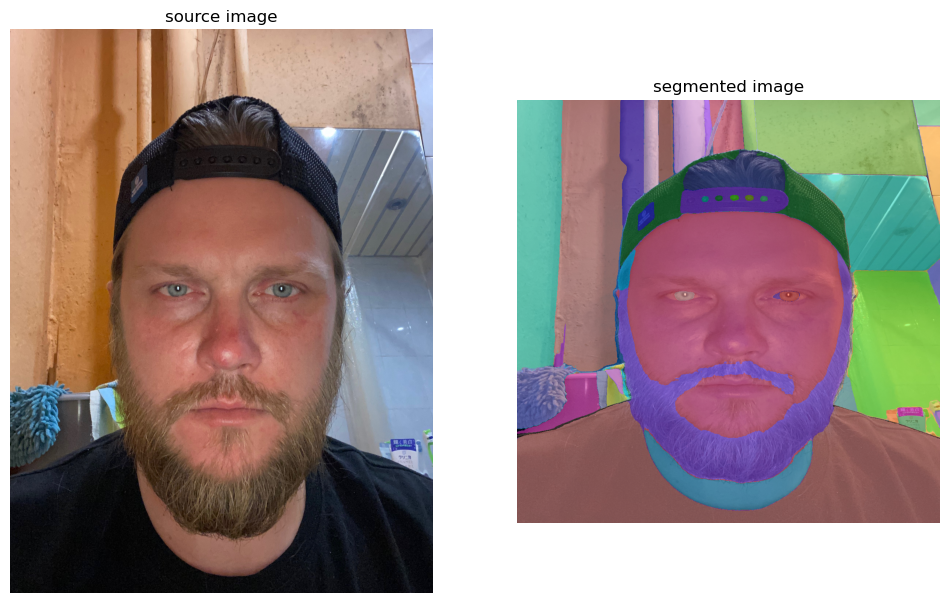

In [12]:
import supervision as sv  # Importa a biblioteca supervision para anotação e visualização de imagens

# Cria uma instância de MaskAnnotator com uma tabela de cores baseada em índices
mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)

# Converte os resultados do modelo SAM para um objeto Detections
detections = sv.Detections.from_sam(sam_result=sam_result)

# Anota a imagem RGB copiada com as detecções obtidas
annotated_image = mask_annotator.annotate(scene=image_rgb.copy(), detections=detections)

# Plota a imagem original e a imagem anotada numa grelha
sv.plot_images_grid(
    images=[image_bgr, annotated_image],  # Lista de imagens a serem exibidas
    grid_size=(1, 2),  # Configuração do tamanho da grelha
    titles=['source image', 'segmented image']  # Títulos para cada imagem na grelha
)

Processing Images:   0%|          | 0/13 [00:00<?, ?it/s]

image_rgb.shape (1024, 1024, 3)


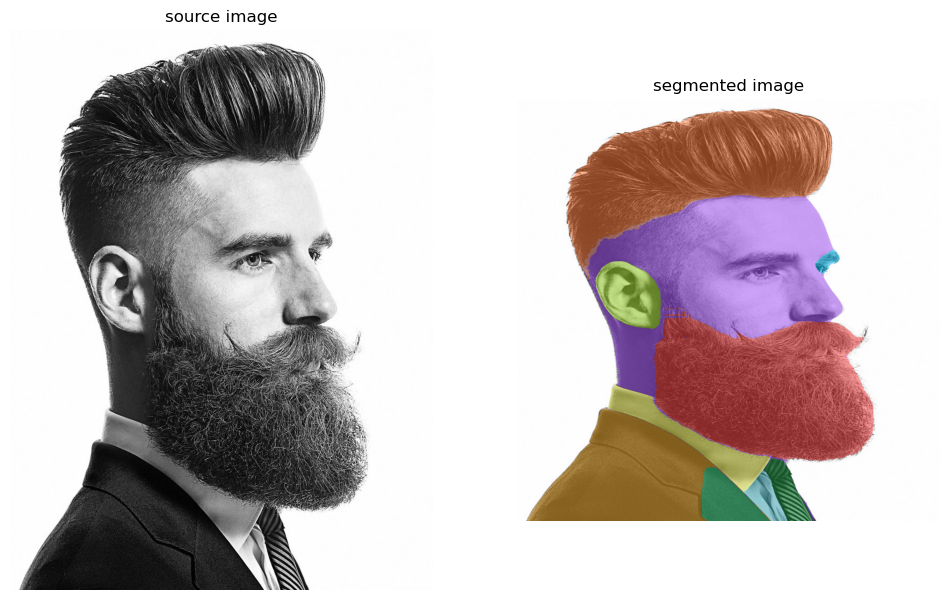

Processing Images:   8%|▊         | 1/13 [01:11<14:21, 71.75s/it]

image_rgb.shape (1024, 1024, 3)


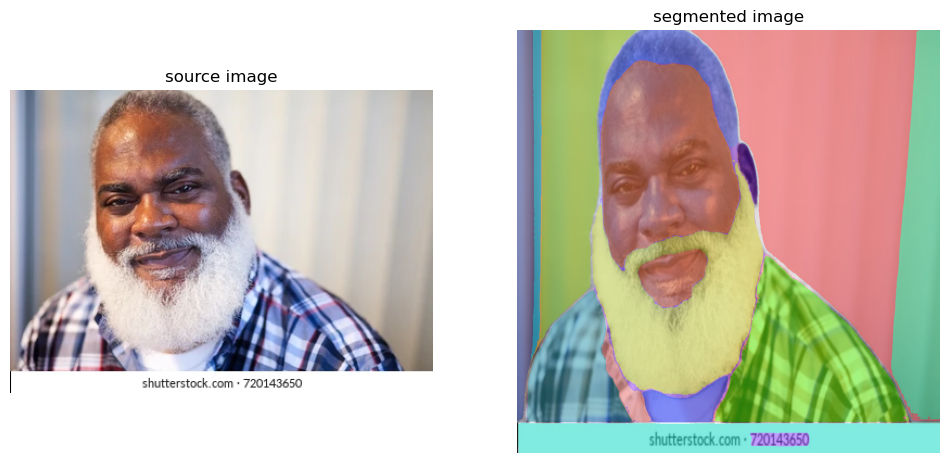

Processing Images:  15%|█▌        | 2/13 [02:32<14:08, 77.17s/it]

image_rgb.shape (1024, 1024, 3)


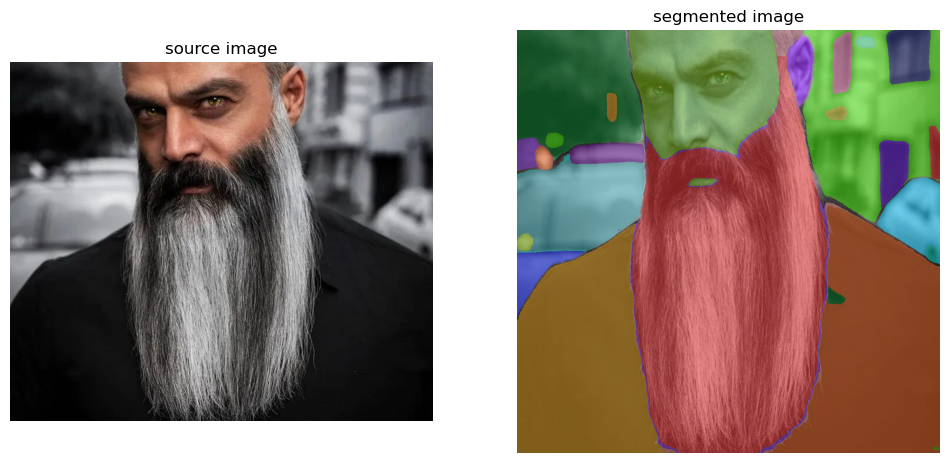

Processing Images:  23%|██▎       | 3/13 [03:40<12:09, 72.91s/it]

image_rgb.shape (1024, 1024, 3)


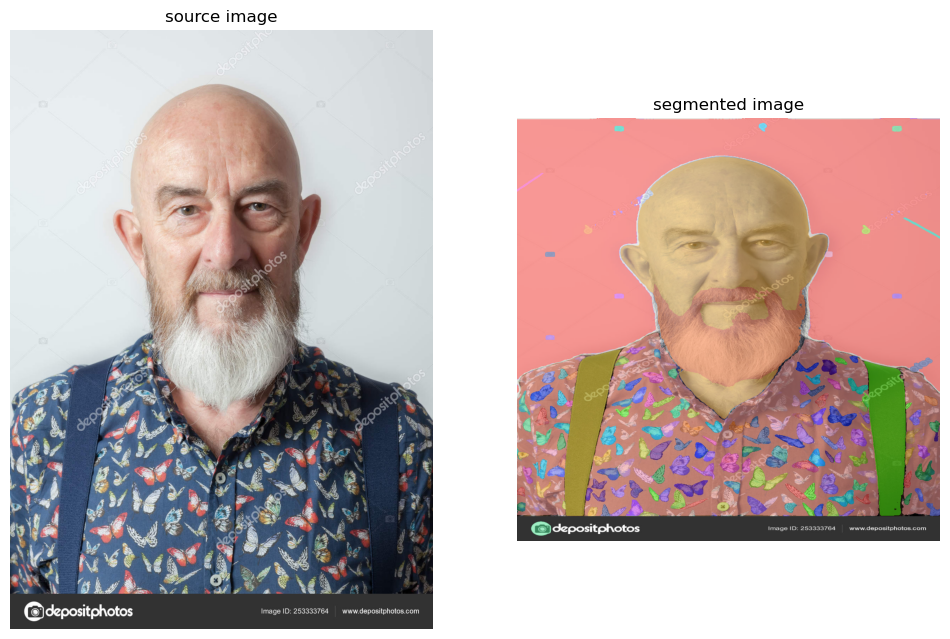

Processing Images:  31%|███       | 4/13 [04:44<10:25, 69.45s/it]

image_rgb.shape (1024, 1024, 3)


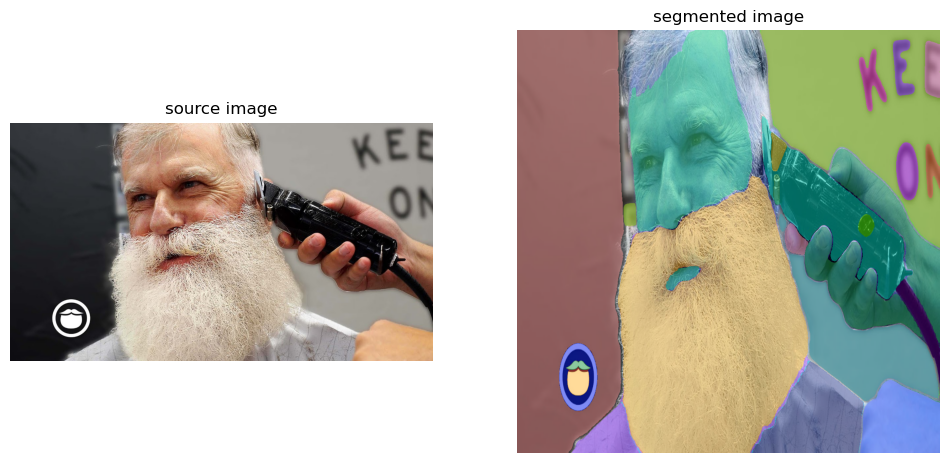

Processing Images:  38%|███▊      | 5/13 [05:50<09:04, 68.07s/it]

image_rgb.shape (1024, 1024, 3)


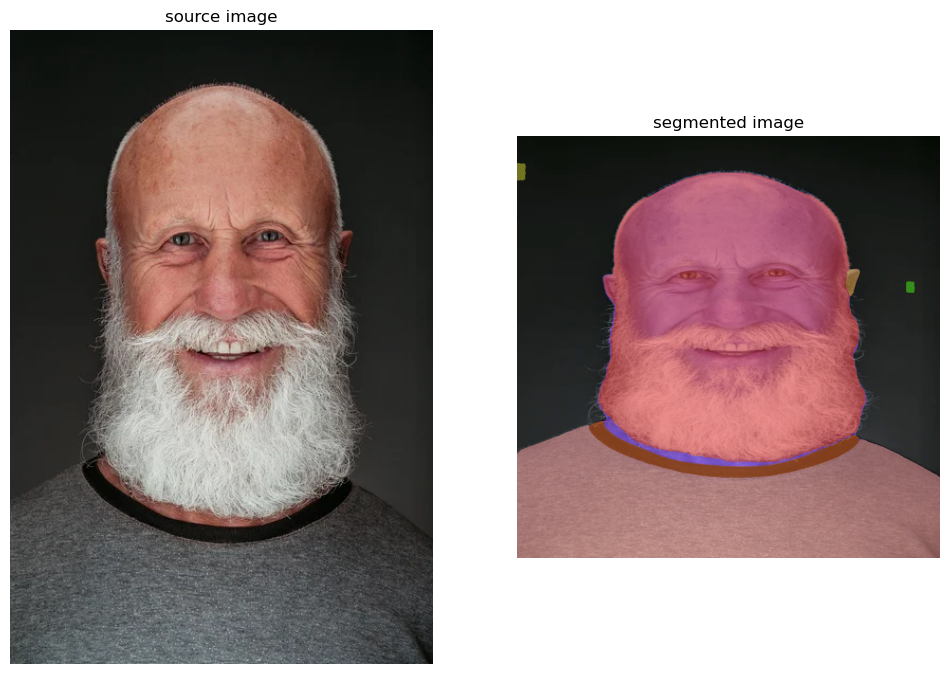

Processing Images:  46%|████▌     | 6/13 [06:58<07:57, 68.26s/it]

image_rgb.shape (1024, 1024, 3)


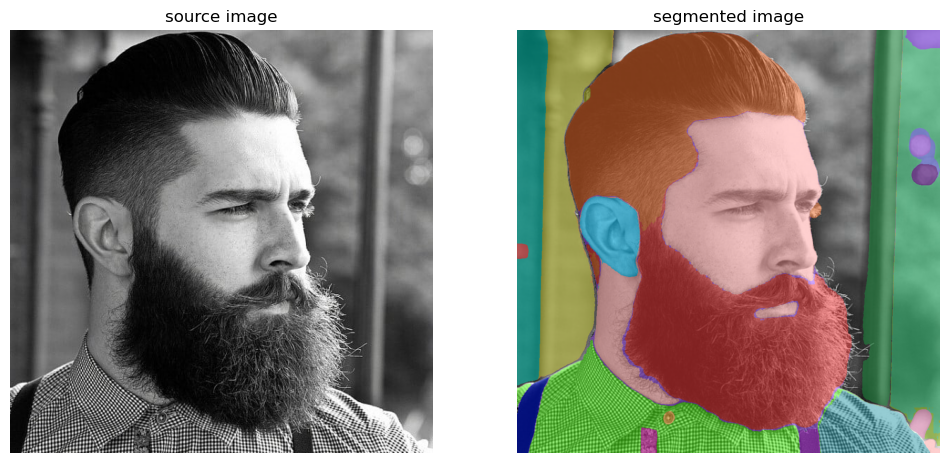

Processing Images:  54%|█████▍    | 7/13 [08:16<07:07, 71.17s/it]

image_rgb.shape (1024, 1024, 3)


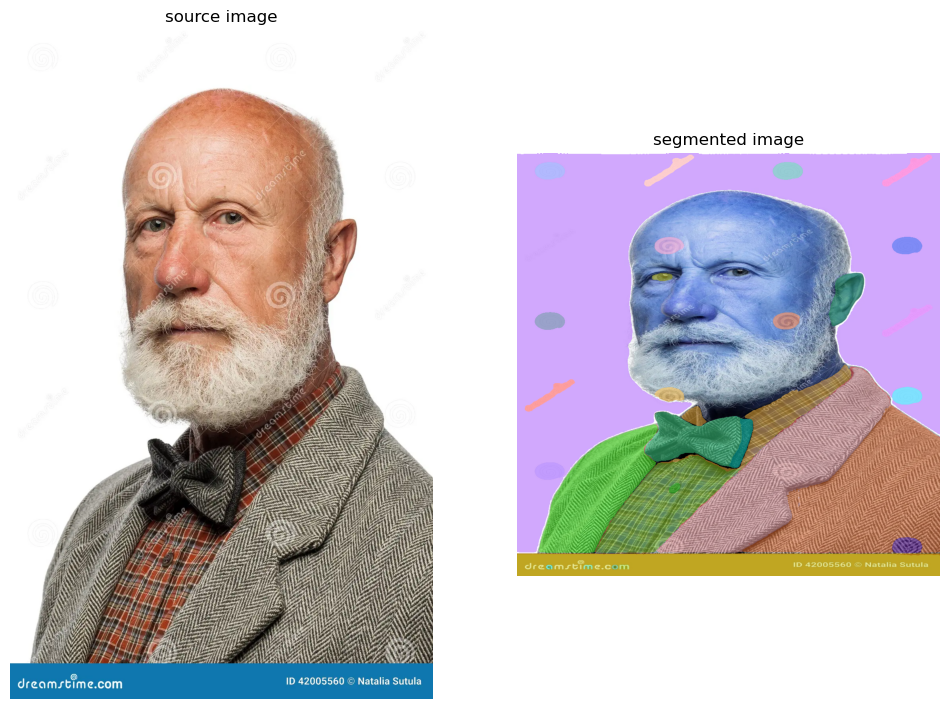

Processing Images:  62%|██████▏   | 8/13 [09:23<05:49, 69.85s/it]

image_rgb.shape (1024, 1024, 3)


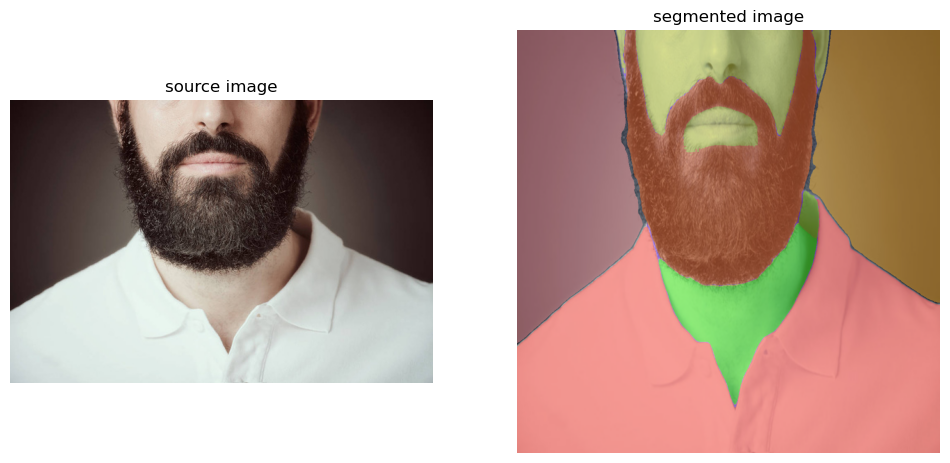

Processing Images:  69%|██████▉   | 9/13 [10:34<04:41, 70.28s/it]

image_rgb.shape (1024, 1024, 3)


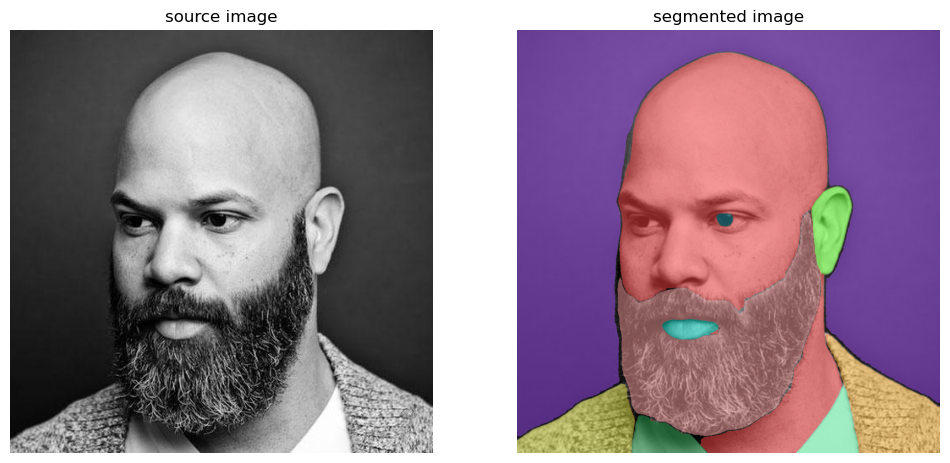

Processing Images:  77%|███████▋  | 10/13 [11:44<03:31, 70.38s/it]

image_rgb.shape (1024, 1024, 3)


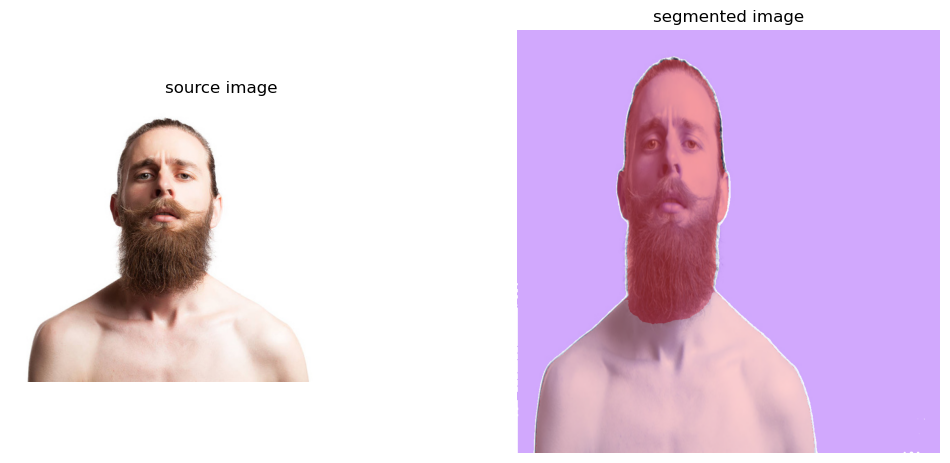

Processing Images:  85%|████████▍ | 11/13 [12:52<02:19, 69.55s/it]

image_rgb.shape (1024, 1024, 3)


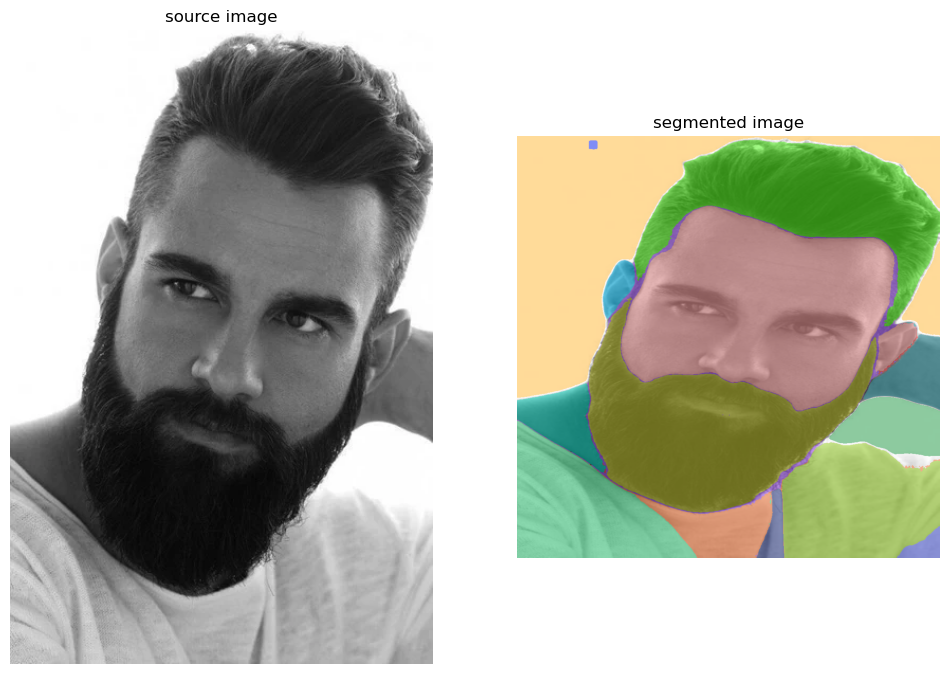

Processing Images:  92%|█████████▏| 12/13 [14:04<01:10, 70.12s/it]

image_rgb.shape (1024, 1024, 3)


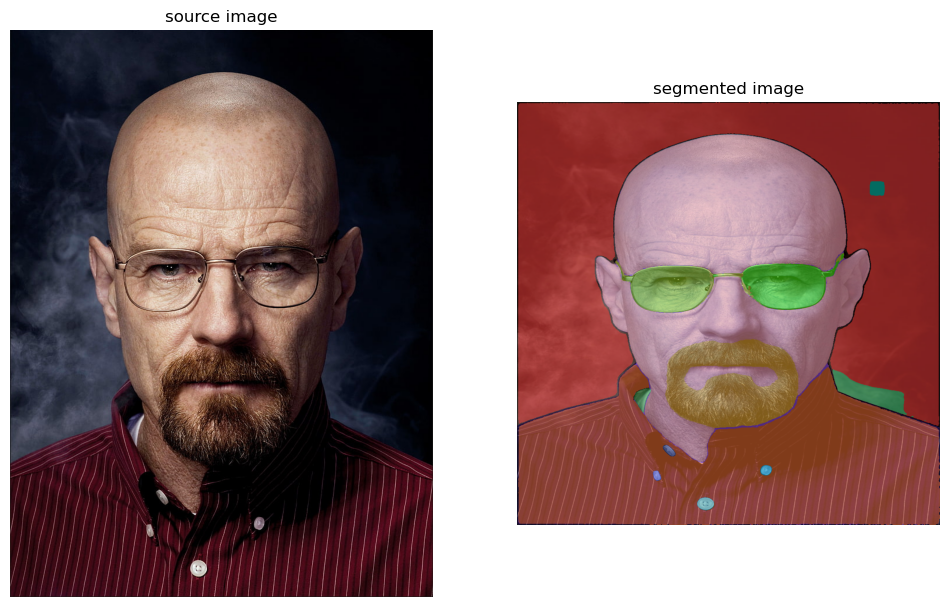

Processing Images: 100%|██████████| 13/13 [15:12<00:00, 70.19s/it]


In [11]:
from tqdm import tqdm  # Importa o módulo tqdm para visualizar barras de progresso
import numpy as np  # Importa a biblioteca numpy para operações matemáticas e manipulação de arrays

# Define o diretório que contém as imagens e o diretório de saída
image_dir = os.path.join(HOME, "teste")
output_dir = os.path.join(HOME, "output")

# Cria o diretório de saída se ele não existir
os.makedirs(output_dir, exist_ok=True)

# Obtém uma lista de todos os ficheiros de imagem no diretório especificado
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.png', '.jpg', '.jpeg', '.webp'))]

# Itera sobre os ficheiros de imagem
for image_file in tqdm(image_files, desc="Processing Images"):
    image_path = os.path.join(image_dir, image_file)  # Caminho completo da imagem
    image_bgr = cv2.imread(image_path)  # Lê a imagem em formato BGR
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)  # Converte de BGR para RGB
    image_rgb = cv2.resize(image_rgb, (1024, 1024))  # Redimensiona a imagem para 1024x1024 pixels

    # Imprime as dimensões da imagem para verificação
    print("image_rgb.shape", image_rgb.shape)

    # Gera uma máscara para a imagem usando o gerador de máscaras
    sam_result = mask_generator.generate(image_rgb)

    # Anota a imagem com as detecções obtidas
    mask_annotator = sv.MaskAnnotator(color_lookup=sv.ColorLookup.INDEX)
    detections = sv.Detections.from_sam(sam_result=sam_result)
    annotated_image = mask_annotator.annotate(scene=image_rgb.copy(), detections=detections)

    # Plota a imagem original e a imagem anotada
    sv.plot_images_grid(
        images=[image_bgr, annotated_image],
        grid_size=(1, 2),
        titles=['source image', 'segmented image']
    )

    # Cria um diretório para cada imagem para guardar as máscaras
    image_output_dir = os.path.join(output_dir, os.path.splitext(image_file)[0])
    os.makedirs(image_output_dir, exist_ok=True)

    # Guarda as máscaras
    masks = [
        mask['segmentation']  # Extrai as máscaras de segmentação
        for mask in sorted(sam_result, key=lambda x: x['area'], reverse=True)  # Ordena as máscaras por área
    ]

    # Salva cada máscara como uma imagem PNG
    for i, mask in enumerate(masks):
        output_path = os.path.join(image_output_dir, f"mask_{i}.png")
        cv2.imwrite(output_path, (mask * 255).astype(np.uint8))

# Segunda Abordagem

### Foram feitas 3 implementações diferentes com datasetes diferentes que essencialmente fazem a mesma coisa.

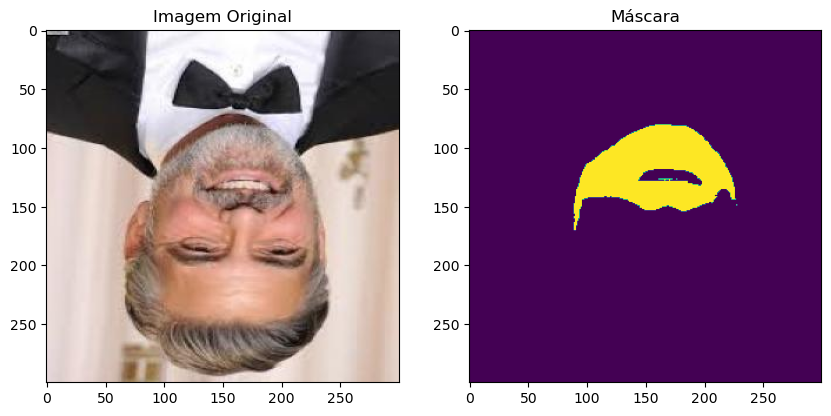

In [12]:
# Importar as bibliotecas necessárias
import pandas as pd
import matplotlib.pyplot as plt
import os
import numpy as np
import cv2

# Definição do nome e do caminho da imagem
IMAGE_NAME = "beard_boxes/train/images--0-_jpg.rf.05dcb5c519e2df59cd5999a86d32d1b2.jpg"
IMAGE_PATH = os.path.join(HOME, IMAGE_NAME)

# Verificar se a imagem existe no caminho especificado, se não, lançar um erro
assert os.path.isfile(IMAGE_PATH), f"Imagem não encontrada: {IMAGE_PATH}"

# Ler o ficheiro CSV que contém as anotações das caixas
boxes_csv = pd.read_csv(os.path.join(HOME, "beard_boxes/train/_annotations.csv"))

# Filtrar as anotações para obter apenas as informações da imagem especificada
boxes_csv = boxes_csv[boxes_csv["filename"] == "images--0-_jpg.rf.05dcb5c519e2df59cd5999a86d32d1b2.jpg"]

# Criar um array numpy com as coordenadas das caixas de delimitação
box = np.array([
    boxes_csv['xmin'],
    boxes_csv['ymin'],
    boxes_csv['xmax'],
    boxes_csv['ymax']
])

# Ler a imagem usando OpenCV
image_bgr = cv2.imread(IMAGE_PATH)
# Converter a imagem de BGR para RGB
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Instanciar o preditor de máscaras
mask_predictor = SamPredictor(sam)
# Definir a imagem no preditor
mask_predictor.set_image(image_rgb)

# Prever a máscara usando a caixa de delimitação
masks, scores, logits = mask_predictor.predict(
    box=box,
    multimask_output=False
)

# Criar uma figura para mostrar as imagens
plt.figure(figsize=(10, 5))  # Ajustar o tamanho conforme necessário

# Mostrar a imagem original
plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title('Imagem Original')

# Mostrar a máscara
plt.subplot(1, 2, 2)
plt.imshow(masks[0])
plt.title('Máscara')

# Exibir as imagens
plt.show()

SupervisionWarnings: red is deprecated: `Color.red()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.RED` instead.
SupervisionWarnings: red is deprecated: `Color.red()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.RED` instead.
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


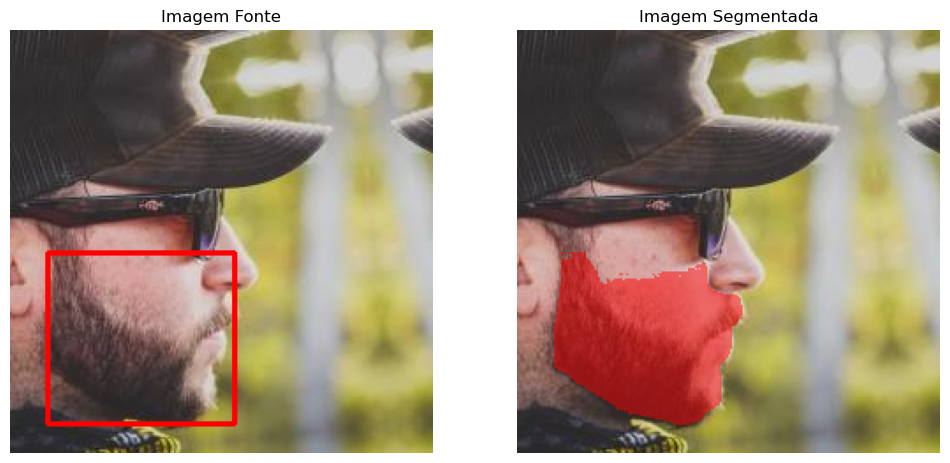

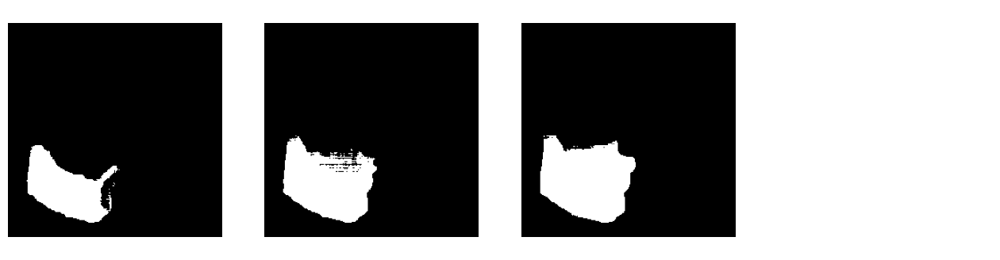

In [13]:
import cv2
from matplotlib import pyplot as plt
import supervision as sv
import numpy as np
import pandas as pd
import os

# Carregar dados de um CSV contendo anotações de imagens
boxes_csv = pd.read_csv(os.path.join(HOME, "beard_boxes_test/train/_annotations.csv"))
# Filtrar para manter apenas as anotações de classe "beard"
boxes_csv = boxes_csv[boxes_csv["class"] == "beard"]

# Ordenar os dados pelo nome do ficheiro
boxes_csv = boxes_csv.sort_values(by=['filename'])

# Selecionar o nome da imagem
IMAGE_NAME = 'beard_boxes_test/train/'+boxes_csv["filename"].values[4]
# Construir o caminho completo para a imagem
IMAGE_PATH = os.path.join(HOME, IMAGE_NAME)

# Verificar se a imagem existe; caso contrário, emitir um erro
assert os.path.isfile(IMAGE_PATH), f"Image not found: {IMAGE_PATH}"

# Extrair as coordenadas da caixa delimitadora para a quinta imagem
box = np.array([
    boxes_csv['xmin'].values[4],
    boxes_csv['ymin'].values[4],
    boxes_csv['xmax'].values[4],
    boxes_csv['ymax'].values[4]
])

# Ler a imagem e converter de BGR (OpenCV) para RGB (matplotlib)
image_bgr = cv2.imread(IMAGE_PATH)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Inicializar o preditor de máscaras com o modelo 'sam'
mask_predictor = SamPredictor(sam)
mask_predictor.set_image(image_rgb)

# Prever máscaras usando a caixa delimitadora
masks, scores, logits = mask_predictor.predict(
    box=box,
    multimask_output=True
)

# Anotar a imagem com caixas delimitadoras e máscaras
box_annotator = sv.BoxAnnotator(color=sv.Color.red())
mask_annotator = sv.MaskAnnotator(color=sv.Color.red(), color_lookup=sv.ColorLookup.INDEX)

# Criar detecções a partir das máscaras
detections = sv.Detections(
    xyxy=sv.mask_to_xyxy(masks=masks),
    mask=masks
)
# Filtrar para manter apenas a detecção com a maior área
detections = detections[detections.area == np.max(detections.area)]

# Anotar a imagem original com as caixas delimitadoras
source_image = box_annotator.annotate(scene=image_bgr.copy(), detections=detections, skip_label=True)
# Anotar a imagem original com as máscaras
segmented_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)

# Exibir as imagens anotadas em grade
sv.plot_images_grid(
    images=[source_image, segmented_image],
    grid_size=(1, 2),
    titles=['Imagem Fonte', 'Imagem Segmentada']
)

# Exibir as máscaras em grade
sv.plot_images_grid(
    images=masks,
    grid_size=(1, 4),
    size=(16, 4)
)

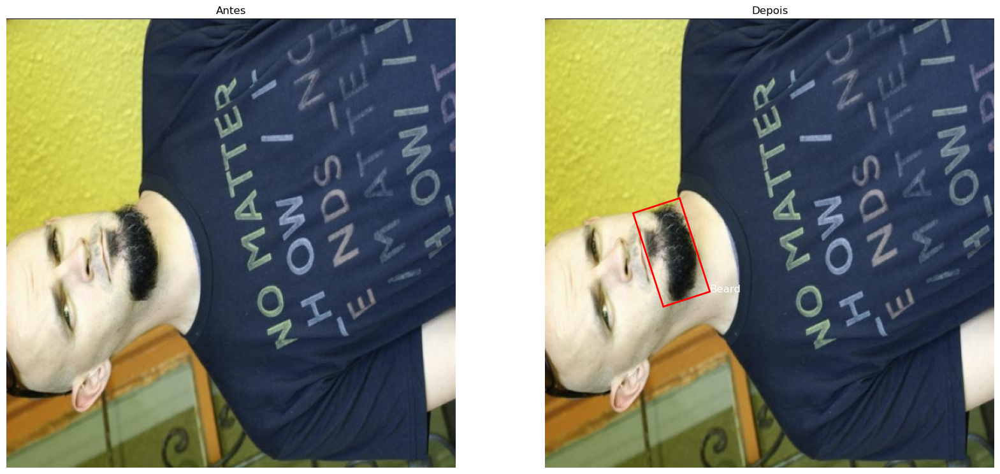

SupervisionWarnings: red is deprecated: `Color.red()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.RED` instead.
SupervisionWarnings: red is deprecated: `Color.red()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.RED` instead.
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


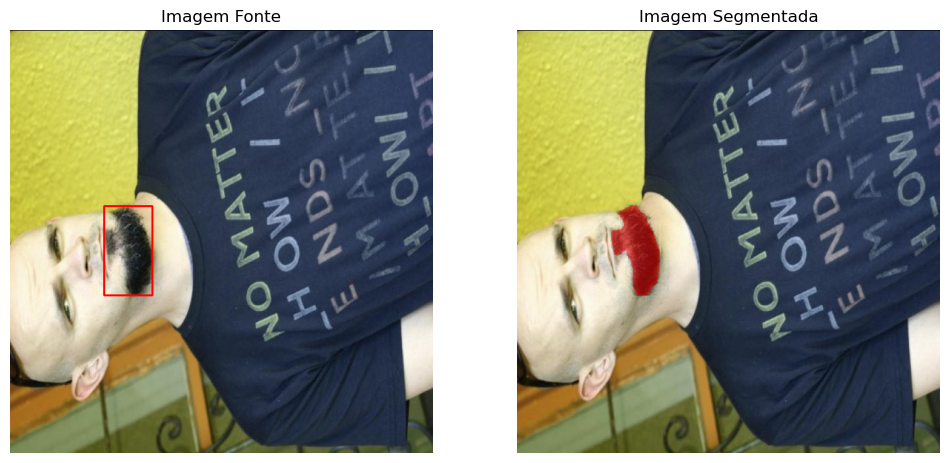

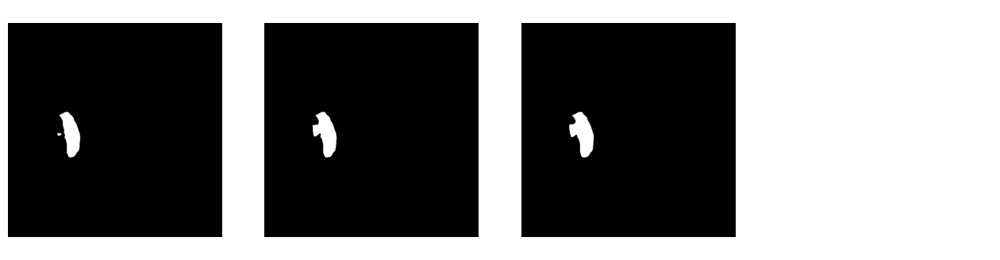

In [13]:
import os
import json
import random
import numpy as np
import supervision as sv

import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import cv2

# Definição dos caminhos
beard_segmented_dir = os.path.join(HOME, 'beard_segmented')
train_dir = os.path.join(beard_segmented_dir, 'train')
images_dir = os.path.join(train_dir, 'images')
labels_dir = os.path.join(train_dir, 'label')

# Listagem e filtragem dos arquivos de imagem
image_files = [file for file in os.listdir(images_dir) if file.endswith('.jpg')]

# Seleção aleatória de um arquivo de imagem
random_image_file = random.choice(image_files)
random_annotation_file = random_image_file.replace('.jpg', '.txt')

# Caminhos completos para a imagem e anotação
image_path = os.path.join(images_dir, random_image_file)
annotation_path = os.path.join(labels_dir, random_annotation_file)

# Carregamento da imagem
image = Image.open(image_path).convert('RGB')

# Carregamento e processamento da anotação
with open(annotation_path, 'r') as file:
    annotations = file.read().strip().split()[:-2]
float_annotations = [float(item) for item in annotations]
vertices_array = np.array(float_annotations).reshape(-1, 2)

# Plotagem da imagem antes e depois da anotação
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].imshow(image)
ax[0].set_title('Antes')
ax[0].axis('off')

ax[1].imshow(image)
polygon = patches.Polygon(vertices_array, closed=True, edgecolor='r', fill=None, linewidth=2)
ax[1].add_patch(polygon)
ax[1].text(vertices_array[0][0], vertices_array[0][1], 'Beard', color='white', fontsize=12)
ax[1].set_title('Depois')
ax[1].axis('off')
plt.show()

# Calculo da caixa delimitadora a partir dos vértices
xmin, ymin = np.min(vertices_array, axis=0)
xmax, ymax = np.max(vertices_array, axis=0)
box = np.array([xmin, ymin, xmax, ymax])

# Carregamento da imagem em BGR para processamento de visão computacional
image_bgr = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Inicialização do preditor de máscaras e predição
mask_predictor = SamPredictor(sam)
mask_predictor.set_image(image_rgb)
masks, scores, logits = mask_predictor.predict(box=box, multimask_output=True)

# Anotação da imagem com caixas delimitadoras e máscaras
box_annotator = sv.BoxAnnotator(color=sv.Color.red())
mask_annotator = sv.MaskAnnotator(color=sv.Color.red(), color_lookup=sv.ColorLookup.INDEX)
detections = sv.Detections(xyxy=sv.mask_to_xyxy(masks=masks), mask=masks)
detections = detections[detections.area == np.max(detections.area)]

source_image = box_annotator.annotate(scene=image_bgr.copy(), detections=detections, skip_label=True)
segmented_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)

# Exibição das imagens anotadas em grade
sv.plot_images_grid(images=[source_image, segmented_image], grid_size=(1, 2), titles=['Imagem Fonte', 'Imagem Segmentada'])

# Exibição das máscaras em grade
sv.plot_images_grid(images=masks, grid_size=(1, 4), size=(16, 4))

# Construção dos datasets com máscaras


#### Apenas foi usado os datasets (beard_boxes) e (beard_segmented) para a criação do nosso dataset. Não foi usado o dataset (beard_boxes_test) devido a conter bastante ruidos nas imagens, por se tratar dum dataset com bounding boxes para diferentes items das faces logo não era focado para a tarefa em análise e acabamos por ter resultados bastante maus na segmentação também.

# Beard_Boxes

In [7]:
# Importar as bibliotecas necessárias
import pandas as pd
import matplotlib.pyplot as plt
import os
import numpy as np
import cv2
from tqdm import tqdm

# Definir o diretório base e os caminhos
images_dir = os.path.join(HOME, "beard_boxes/train")
annotations_csv_path = os.path.join(HOME, "beard_boxes/train/_annotations.csv")

# Verificar se o diretório de imagens e o CSV de anotações existem
assert os.path.isdir(images_dir), f"Diretório de imagens não encontrado: {images_dir}"
assert os.path.isfile(annotations_csv_path), f"Ficheiro CSV de anotações não encontrado: {annotations_csv_path}"

# Ler o ficheiro CSV que contém as anotações das caixas
boxes_csv = pd.read_csv(annotations_csv_path)

# Instanciar o preditor de máscaras
mask_predictor = SamPredictor(sam)

# Criar diretório de saída para as máscaras
output_masks_dir = os.path.join(HOME, "output_masks_2nd")
os.makedirs(output_masks_dir, exist_ok=True)

# Iterar sobre cada imagem no CSV de anotações com tqdm para a barra de progresso
for filename in tqdm(boxes_csv['filename'].unique(), desc="Processando imagens"):
    # Filtrar as anotações para obter apenas as informações da imagem atual
    image_annotations = boxes_csv[boxes_csv['filename'] == filename]
    
    IMAGE_PATH = os.path.join(images_dir, filename)

    # Verificar se a imagem existe no caminho especificado, se não, continuar para a próxima
    if not os.path.isfile(IMAGE_PATH):
        print(f"Imagem não encontrada: {IMAGE_PATH}")
        continue

    # Ler a imagem usando OpenCV
    image_bgr = cv2.imread(IMAGE_PATH)

    # Verificar se a imagem é preta e branca
    if len(image_bgr.shape) < 3 or image_bgr.shape[2] == 1:
        print(f"Imagem preta e branca, ignorando: {IMAGE_PATH}")
        continue

    # Converter a imagem de BGR para RGB
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

    # Definir a imagem no preditor
    mask_predictor.set_image(image_rgb)

    # Processar cada anotação (caixa de delimitação) para a imagem atual
    for idx, row in image_annotations.iterrows():
        # Criar um array numpy com as coordenadas das caixas de delimitação
        box = np.array([
            row['xmin'],
            row['ymin'],
            row['xmax'],
            row['ymax']
        ])
        
        highest_score = -1
        best_mask = None

        # Prever a máscara usando a caixa de delimitação
        masks, scores, logits = mask_predictor.predict(
            box=box,
            multimask_output=True
        )

        # Encontrar a máscara com o maior score
        for mask, score in zip(masks, scores):
            if score > highest_score:
                highest_score = score
                best_mask = mask

        # Criar diretório de saída específico para esta imagem
        image_output_dir = os.path.join(output_masks_dir, os.path.splitext(filename)[0])
        os.makedirs(image_output_dir, exist_ok=True)

        # Salvar todas as máscaras e imprimir os scores
        for i, (mask, score) in enumerate(zip(masks, scores)):
            mask_filename = f"mascara_{idx}_{i}____{score:.4f}.png"
            mask_path = os.path.join(image_output_dir, mask_filename)
            mask = (mask.astype(np.uint8) * 255)
            cv2.imwrite(mask_path, mask)
            print(f"Salvou: {mask_path} com score: {score}")

    # Salvar a imagem original no diretório de saída
    cv2.imwrite(os.path.join(image_output_dir, filename), image_bgr)

Processando imagens:   0%|          | 1/398 [00:13<1:31:24, 13.82s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--58-_jpg.rf.93198ac4e63dfc3f69ae3879bf52268a/mascara_0_0____0.9152.png com score: 0.915204644203186
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--58-_jpg.rf.93198ac4e63dfc3f69ae3879bf52268a/mascara_0_1____0.9123.png com score: 0.9123256802558899
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--58-_jpg.rf.93198ac4e63dfc3f69ae3879bf52268a/mascara_0_2____0.8632.png com score: 0.8631760478019714


Processando imagens:   1%|          | 2/398 [00:25<1:23:23, 12.63s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--121-_jpg.rf.9b3b86ed4b776f39a24136f27f771c38/mascara_1_0____0.8714.png com score: 0.871445894241333
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--121-_jpg.rf.9b3b86ed4b776f39a24136f27f771c38/mascara_1_1____0.7665.png com score: 0.7664766907691956
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--121-_jpg.rf.9b3b86ed4b776f39a24136f27f771c38/mascara_1_2____0.8657.png com score: 0.8657191395759583


Processando imagens:   1%|          | 3/398 [00:37<1:20:06, 12.17s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--101-_jpg.rf.928e4a2f0c346f59b759be72f3d5bf1f/mascara_2_0____0.8848.png com score: 0.8848165273666382
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--101-_jpg.rf.928e4a2f0c346f59b759be72f3d5bf1f/mascara_2_1____0.8130.png com score: 0.8130150437355042
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--101-_jpg.rf.928e4a2f0c346f59b759be72f3d5bf1f/mascara_2_2____0.8904.png com score: 0.8903656601905823


Processando imagens:   1%|          | 4/398 [00:50<1:22:47, 12.61s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--154-_jpg.rf.9ba988f52385afbfa43330c791abe9f7/mascara_3_0____0.9529.png com score: 0.9528623819351196
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--154-_jpg.rf.9ba988f52385afbfa43330c791abe9f7/mascara_3_1____0.9396.png com score: 0.9395818114280701
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--154-_jpg.rf.9ba988f52385afbfa43330c791abe9f7/mascara_3_2____0.9462.png com score: 0.9461973905563354


Processando imagens:   1%|▏         | 5/398 [01:01<1:19:12, 12.09s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--163-_jpg.rf.a256a9f3ca8a6ba31b496c1fa77c3a32/mascara_4_0____0.9728.png com score: 0.9727526903152466
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--163-_jpg.rf.a256a9f3ca8a6ba31b496c1fa77c3a32/mascara_4_1____0.9694.png com score: 0.9693925380706787
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--163-_jpg.rf.a256a9f3ca8a6ba31b496c1fa77c3a32/mascara_4_2____0.9634.png com score: 0.9633986353874207


Processando imagens:   2%|▏         | 6/398 [01:12<1:17:10, 11.81s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--81-_jpg.rf.98d3a50d58769b561536dc57f4dbb38f/mascara_5_0____0.9484.png com score: 0.9483877420425415
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--81-_jpg.rf.98d3a50d58769b561536dc57f4dbb38f/mascara_5_1____0.9302.png com score: 0.9301846027374268
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--81-_jpg.rf.98d3a50d58769b561536dc57f4dbb38f/mascara_5_2____0.9341.png com score: 0.9341322183609009


Processando imagens:   2%|▏         | 7/398 [01:24<1:15:37, 11.61s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--148-_jpg.rf.a2b7c07cd2ca54c93e02480145b0aed0/mascara_6_0____0.9273.png com score: 0.9273440837860107
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--148-_jpg.rf.a2b7c07cd2ca54c93e02480145b0aed0/mascara_6_1____0.9288.png com score: 0.928774893283844
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--148-_jpg.rf.a2b7c07cd2ca54c93e02480145b0aed0/mascara_6_2____0.9206.png com score: 0.9205645322799683


Processando imagens:   2%|▏         | 8/398 [01:37<1:18:17, 12.05s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--113-_jpg.rf.99ab64ebc4d586fe18aefc48b1445703/mascara_7_0____0.9105.png com score: 0.9104999303817749
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--113-_jpg.rf.99ab64ebc4d586fe18aefc48b1445703/mascara_7_1____0.9096.png com score: 0.9096295237541199
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--113-_jpg.rf.99ab64ebc4d586fe18aefc48b1445703/mascara_7_2____0.9095.png com score: 0.9095432162284851


Processando imagens:   2%|▏         | 9/398 [01:49<1:17:45, 11.99s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--200-_jpg.rf.9e676c02153770dbced5a2590836169a/mascara_8_0____0.9316.png com score: 0.9316178560256958
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--200-_jpg.rf.9e676c02153770dbced5a2590836169a/mascara_8_1____0.8517.png com score: 0.8517473936080933
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--200-_jpg.rf.9e676c02153770dbced5a2590836169a/mascara_8_2____0.8999.png com score: 0.899895429611206


Processando imagens:   3%|▎         | 10/398 [02:01<1:17:42, 12.02s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--103-_jpg.rf.9adaea4293002f6a4fc1b61fbb0478d0/mascara_9_0____0.9517.png com score: 0.9516816139221191
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--103-_jpg.rf.9adaea4293002f6a4fc1b61fbb0478d0/mascara_9_1____0.9478.png com score: 0.9477885365486145
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--103-_jpg.rf.9adaea4293002f6a4fc1b61fbb0478d0/mascara_9_2____0.9589.png com score: 0.9588840007781982


Processando imagens:   3%|▎         | 11/398 [02:13<1:18:30, 12.17s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--24-_jpg.rf.9e11a93d8970a993f3818cf7c0e93247/mascara_10_0____0.9425.png com score: 0.9425137042999268
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--24-_jpg.rf.9e11a93d8970a993f3818cf7c0e93247/mascara_10_1____0.7921.png com score: 0.7920527458190918
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--24-_jpg.rf.9e11a93d8970a993f3818cf7c0e93247/mascara_10_2____0.9280.png com score: 0.9280351400375366


Processando imagens:   3%|▎         | 12/398 [02:29<1:25:24, 13.27s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--127-_jpg.rf.a3f166444a2d4d13b46a56fb9705cadd/mascara_11_0____0.9512.png com score: 0.9512161016464233
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--127-_jpg.rf.a3f166444a2d4d13b46a56fb9705cadd/mascara_11_1____0.9419.png com score: 0.9418848156929016
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--127-_jpg.rf.a3f166444a2d4d13b46a56fb9705cadd/mascara_11_2____0.9429.png com score: 0.9429013729095459


Processando imagens:   3%|▎         | 13/398 [02:43<1:27:33, 13.65s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--27-_jpg.rf.a52352cd623265364454302be922f084/mascara_12_0____0.8962.png com score: 0.8961752653121948
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--27-_jpg.rf.a52352cd623265364454302be922f084/mascara_12_1____0.7082.png com score: 0.7081860899925232
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--27-_jpg.rf.a52352cd623265364454302be922f084/mascara_12_2____0.8584.png com score: 0.8584271669387817


Processando imagens:   4%|▎         | 14/398 [02:56<1:25:31, 13.36s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--164-_jpg.rf.a0ba45001f86166e2be2ed3fa5952257/mascara_13_0____0.9170.png com score: 0.9169695377349854
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--164-_jpg.rf.a0ba45001f86166e2be2ed3fa5952257/mascara_13_1____0.8282.png com score: 0.8282172679901123
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--164-_jpg.rf.a0ba45001f86166e2be2ed3fa5952257/mascara_13_2____0.8883.png com score: 0.8882633447647095


Processando imagens:   4%|▍         | 15/398 [03:07<1:20:43, 12.65s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--23-_jpg.rf.9ac0c36a272a92033fd87c9284a7733f/mascara_14_0____0.7965.png com score: 0.7964906692504883
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--23-_jpg.rf.9ac0c36a272a92033fd87c9284a7733f/mascara_14_1____0.7938.png com score: 0.7938259840011597
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--23-_jpg.rf.9ac0c36a272a92033fd87c9284a7733f/mascara_14_2____0.7432.png com score: 0.7432230710983276


Processando imagens:   4%|▍         | 16/398 [03:18<1:16:55, 12.08s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--119-_jpg.rf.a491dd772a059c4d52399981aa9c456c/mascara_15_0____0.9266.png com score: 0.9265834093093872
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--119-_jpg.rf.a491dd772a059c4d52399981aa9c456c/mascara_15_1____0.9243.png com score: 0.9242687821388245
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--119-_jpg.rf.a491dd772a059c4d52399981aa9c456c/mascara_15_2____0.9341.png com score: 0.934052586555481


Processando imagens:   4%|▍         | 17/398 [03:29<1:14:25, 11.72s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--161-_jpg.rf.97a424781946e904f4c77cebcbe32af5/mascara_16_0____0.9498.png com score: 0.9498172998428345
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--161-_jpg.rf.97a424781946e904f4c77cebcbe32af5/mascara_16_1____0.9419.png com score: 0.941938579082489
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--161-_jpg.rf.97a424781946e904f4c77cebcbe32af5/mascara_16_2____0.9533.png com score: 0.9532912373542786


Processando imagens:   5%|▍         | 18/398 [03:40<1:12:49, 11.50s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--20-_jpg.rf.9a78f0b72b16d7f029107af5c959b415/mascara_17_0____0.9479.png com score: 0.9479365348815918
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--20-_jpg.rf.9a78f0b72b16d7f029107af5c959b415/mascara_17_1____0.8085.png com score: 0.8085342049598694
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--20-_jpg.rf.9a78f0b72b16d7f029107af5c959b415/mascara_17_2____0.9213.png com score: 0.9213451147079468


Processando imagens:   5%|▍         | 19/398 [03:50<1:10:59, 11.24s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--102-_jpg.rf.95328746c6faf33f675fa1c1c1ac8a8b/mascara_18_0____0.9014.png com score: 0.9013968706130981
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--102-_jpg.rf.95328746c6faf33f675fa1c1c1ac8a8b/mascara_18_1____0.8483.png com score: 0.848268449306488
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--102-_jpg.rf.95328746c6faf33f675fa1c1c1ac8a8b/mascara_18_2____0.8895.png com score: 0.8895033001899719


Processando imagens:   5%|▌         | 20/398 [04:02<1:10:39, 11.22s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--225-_jpg.rf.98589d5f4368de6f0bcf3715a701fbe3/mascara_19_0____0.9448.png com score: 0.9448226690292358
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--225-_jpg.rf.98589d5f4368de6f0bcf3715a701fbe3/mascara_19_1____0.7279.png com score: 0.7278674840927124
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--225-_jpg.rf.98589d5f4368de6f0bcf3715a701fbe3/mascara_19_2____0.8777.png com score: 0.8776982426643372


Processando imagens:   5%|▌         | 21/398 [04:13<1:11:46, 11.42s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--33-_jpg.rf.96106eec6e65a1c75649a6be82210baf/mascara_20_0____0.9182.png com score: 0.9182256460189819
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--33-_jpg.rf.96106eec6e65a1c75649a6be82210baf/mascara_20_1____0.9133.png com score: 0.9132940173149109
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--33-_jpg.rf.96106eec6e65a1c75649a6be82210baf/mascara_20_2____0.9179.png com score: 0.9179270267486572


Processando imagens:   6%|▌         | 22/398 [04:24<1:10:31, 11.25s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--70-_jpg.rf.a22f008aa258f1717fee75402e7a05e0/mascara_21_0____0.8821.png com score: 0.8821265697479248
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--70-_jpg.rf.a22f008aa258f1717fee75402e7a05e0/mascara_21_1____0.6251.png com score: 0.6251233220100403
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--70-_jpg.rf.a22f008aa258f1717fee75402e7a05e0/mascara_21_2____0.8896.png com score: 0.889622151851654


Processando imagens:   6%|▌         | 23/398 [04:38<1:15:00, 12.00s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--158-_jpg.rf.a4c5632e264f5c92aaf571709abb9509/mascara_22_0____0.9674.png com score: 0.9674047231674194
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--158-_jpg.rf.a4c5632e264f5c92aaf571709abb9509/mascara_22_1____0.9678.png com score: 0.9677672982215881
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--158-_jpg.rf.a4c5632e264f5c92aaf571709abb9509/mascara_22_2____0.9583.png com score: 0.9582817554473877


Processando imagens:   6%|▌         | 24/398 [04:50<1:15:28, 12.11s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--155-_jpg.rf.a5fbd3ac2fb6c8714715c07fe1c87a04/mascara_23_0____0.9539.png com score: 0.9539270401000977
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--155-_jpg.rf.a5fbd3ac2fb6c8714715c07fe1c87a04/mascara_23_1____0.8896.png com score: 0.8896412253379822
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--155-_jpg.rf.a5fbd3ac2fb6c8714715c07fe1c87a04/mascara_23_2____0.9288.png com score: 0.9288177490234375


Processando imagens:   6%|▋         | 25/398 [05:01<1:12:50, 11.72s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--0-_jpg.rf.a5b828bd82d3ccbba7ff7e75b61ebe54/mascara_24_0____0.9361.png com score: 0.9361128807067871
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--0-_jpg.rf.a5b828bd82d3ccbba7ff7e75b61ebe54/mascara_24_1____0.8851.png com score: 0.8851115107536316
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--0-_jpg.rf.a5b828bd82d3ccbba7ff7e75b61ebe54/mascara_24_2____0.9343.png com score: 0.9342712163925171


Processando imagens:   7%|▋         | 26/398 [05:12<1:11:01, 11.45s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--37-_jpg.rf.a6039917520ef390b483a7f1838cf5f6/mascara_25_0____0.9175.png com score: 0.9174720048904419
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--37-_jpg.rf.a6039917520ef390b483a7f1838cf5f6/mascara_25_1____0.7768.png com score: 0.7767806053161621
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--37-_jpg.rf.a6039917520ef390b483a7f1838cf5f6/mascara_25_2____0.8614.png com score: 0.8613885641098022


Processando imagens:   7%|▋         | 27/398 [05:23<1:10:35, 11.42s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--191-_jpg.rf.991b009b40f2633da12572c795d96904/mascara_26_0____0.9452.png com score: 0.945184588432312
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--191-_jpg.rf.991b009b40f2633da12572c795d96904/mascara_26_1____0.8754.png com score: 0.8753792643547058
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--191-_jpg.rf.991b009b40f2633da12572c795d96904/mascara_26_2____0.9363.png com score: 0.9363119602203369


Processando imagens:   7%|▋         | 28/398 [05:35<1:10:16, 11.40s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--130-_jpg.rf.a9cebbb55a9e4033aa1afb2c9f620c5e/mascara_27_0____0.9347.png com score: 0.9347231388092041
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--130-_jpg.rf.a9cebbb55a9e4033aa1afb2c9f620c5e/mascara_27_1____0.9343.png com score: 0.9342652559280396
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--130-_jpg.rf.a9cebbb55a9e4033aa1afb2c9f620c5e/mascara_27_2____0.9247.png com score: 0.9247187972068787


Processando imagens:   7%|▋         | 29/398 [05:46<1:09:18, 11.27s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--41-_jpg.rf.a8f6a978cda8014ed5c2049fa6961914/mascara_28_0____0.8697.png com score: 0.8697267770767212
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--41-_jpg.rf.a8f6a978cda8014ed5c2049fa6961914/mascara_28_1____0.8917.png com score: 0.89170241355896
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--41-_jpg.rf.a8f6a978cda8014ed5c2049fa6961914/mascara_28_2____0.7982.png com score: 0.7981957793235779


Processando imagens:   8%|▊         | 30/398 [05:57<1:09:21, 11.31s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--178-_jpg.rf.a5824ef7a8a49700f754a06308961f52/mascara_29_0____0.9613.png com score: 0.9613369703292847
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--178-_jpg.rf.a5824ef7a8a49700f754a06308961f52/mascara_29_1____0.9473.png com score: 0.94730144739151
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--178-_jpg.rf.a5824ef7a8a49700f754a06308961f52/mascara_29_2____0.9545.png com score: 0.9545497894287109


Processando imagens:   8%|▊         | 31/398 [06:10<1:11:39, 11.71s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--58-_jpg.rf.a6eef83e31316de88ff85b904f10757f/mascara_30_0____0.9149.png com score: 0.9148576259613037
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--58-_jpg.rf.a6eef83e31316de88ff85b904f10757f/mascara_30_1____0.8887.png com score: 0.8886975646018982
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--58-_jpg.rf.a6eef83e31316de88ff85b904f10757f/mascara_30_2____0.9019.png com score: 0.9019339680671692


Processando imagens:   8%|▊         | 32/398 [06:22<1:12:47, 11.93s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--205-_jpg.rf.a67e2fbaf0d0573b94dd037a729b910a/mascara_31_0____0.9158.png com score: 0.9158397912979126
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--205-_jpg.rf.a67e2fbaf0d0573b94dd037a729b910a/mascara_31_1____0.9395.png com score: 0.9395261406898499
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--205-_jpg.rf.a67e2fbaf0d0573b94dd037a729b910a/mascara_31_2____0.9391.png com score: 0.9390659332275391


Processando imagens:   8%|▊         | 33/398 [06:33<1:10:42, 11.62s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--193-_jpg.rf.ac1e8df3997a6cf935ec6a8c480a60c8/mascara_32_0____0.9386.png com score: 0.9385825395584106
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--193-_jpg.rf.ac1e8df3997a6cf935ec6a8c480a60c8/mascara_32_1____0.8964.png com score: 0.8963581919670105
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--193-_jpg.rf.ac1e8df3997a6cf935ec6a8c480a60c8/mascara_32_2____0.9373.png com score: 0.9373081922531128


Processando imagens:   9%|▊         | 34/398 [06:44<1:08:59, 11.37s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--143-_jpg.rf.a8e9cc7cae0724febcc09d8f77a96e44/mascara_33_0____0.9404.png com score: 0.9404247999191284
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--143-_jpg.rf.a8e9cc7cae0724febcc09d8f77a96e44/mascara_33_1____0.9581.png com score: 0.9581111073493958
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--143-_jpg.rf.a8e9cc7cae0724febcc09d8f77a96e44/mascara_33_2____0.9489.png com score: 0.9488964080810547


Processando imagens:   9%|▉         | 35/398 [06:55<1:08:17, 11.29s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--213-_jpg.rf.af2a760edb09a9414d86f00e6e53b633/mascara_34_0____0.9600.png com score: 0.959979772567749
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--213-_jpg.rf.af2a760edb09a9414d86f00e6e53b633/mascara_34_1____0.9501.png com score: 0.9501081109046936
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--213-_jpg.rf.af2a760edb09a9414d86f00e6e53b633/mascara_34_2____0.9560.png com score: 0.9560346603393555


Processando imagens:   9%|▉         | 36/398 [07:06<1:07:49, 11.24s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--120-_jpg.rf.aae8c1091d130715114d5aeeebf33625/mascara_35_0____0.9638.png com score: 0.9638147354125977
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--120-_jpg.rf.aae8c1091d130715114d5aeeebf33625/mascara_35_1____0.9477.png com score: 0.9476962685585022
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--120-_jpg.rf.aae8c1091d130715114d5aeeebf33625/mascara_35_2____0.9582.png com score: 0.9582337141036987


Processando imagens:   9%|▉         | 37/398 [07:18<1:09:37, 11.57s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--45-_jpg.rf.a6ae72d2d592a3a36f8b3c262ee9341f/mascara_36_0____0.9308.png com score: 0.9307529926300049
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--45-_jpg.rf.a6ae72d2d592a3a36f8b3c262ee9341f/mascara_36_1____0.9024.png com score: 0.9024435877799988
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--45-_jpg.rf.a6ae72d2d592a3a36f8b3c262ee9341f/mascara_36_2____0.9158.png com score: 0.9158328175544739


Processando imagens:  10%|▉         | 38/398 [07:29<1:08:22, 11.40s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--0-_jpg.rf.aeab4ffa680bd044a8ba3abc66fa9678/mascara_37_0____0.9347.png com score: 0.9346623420715332
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--0-_jpg.rf.aeab4ffa680bd044a8ba3abc66fa9678/mascara_37_1____0.8550.png com score: 0.8549615740776062
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--0-_jpg.rf.aeab4ffa680bd044a8ba3abc66fa9678/mascara_37_2____0.9309.png com score: 0.9308723211288452


Processando imagens:  10%|▉         | 39/398 [07:40<1:07:27, 11.28s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--115-_jpg.rf.ab6f0b239e8f0425854a0aaa2df84892/mascara_38_0____0.9249.png com score: 0.9248788356781006
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--115-_jpg.rf.ab6f0b239e8f0425854a0aaa2df84892/mascara_38_1____0.7910.png com score: 0.7910325527191162
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--115-_jpg.rf.ab6f0b239e8f0425854a0aaa2df84892/mascara_38_2____0.8604.png com score: 0.8603946566581726


Processando imagens:  10%|█         | 40/398 [07:51<1:06:51, 11.21s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--213-_jpg.rf.aad1da00f3c59e1a6c16995e4c7ca613/mascara_39_0____0.9582.png com score: 0.9582195281982422
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--213-_jpg.rf.aad1da00f3c59e1a6c16995e4c7ca613/mascara_39_1____0.9541.png com score: 0.9540699124336243
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--213-_jpg.rf.aad1da00f3c59e1a6c16995e4c7ca613/mascara_39_2____0.9481.png com score: 0.9481029510498047


Processando imagens:  10%|█         | 41/398 [08:03<1:07:05, 11.28s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--211-_jpg.rf.abb324c2f84bf7d576f82ec352bf44ab/mascara_40_0____0.8456.png com score: 0.8455989360809326
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--211-_jpg.rf.abb324c2f84bf7d576f82ec352bf44ab/mascara_40_1____0.7712.png com score: 0.7711668014526367
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--211-_jpg.rf.abb324c2f84bf7d576f82ec352bf44ab/mascara_40_2____0.8227.png com score: 0.8227006793022156


Processando imagens:  11%|█         | 42/398 [08:14<1:06:15, 11.17s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--158-_jpg.rf.b13acd8e88f3f1e1248821b785437ee3/mascara_41_0____0.9727.png com score: 0.9727438688278198
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--158-_jpg.rf.b13acd8e88f3f1e1248821b785437ee3/mascara_41_1____0.9794.png com score: 0.9794217348098755
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--158-_jpg.rf.b13acd8e88f3f1e1248821b785437ee3/mascara_41_2____0.9689.png com score: 0.9688737988471985


Processando imagens:  11%|█         | 43/398 [08:25<1:06:02, 11.16s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--138-_jpg.rf.a256de0b44aed2eae308984eb7d0f4c0/mascara_42_0____0.9412.png com score: 0.9411927461624146
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--138-_jpg.rf.a256de0b44aed2eae308984eb7d0f4c0/mascara_42_1____0.9275.png com score: 0.9275376200675964
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--138-_jpg.rf.a256de0b44aed2eae308984eb7d0f4c0/mascara_42_2____0.9203.png com score: 0.9202755689620972


Processando imagens:  11%|█         | 44/398 [08:37<1:08:04, 11.54s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--176-_jpg.rf.afd04f827edc59f6c369f9773af60eab/mascara_43_0____0.9345.png com score: 0.9344987869262695
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--176-_jpg.rf.afd04f827edc59f6c369f9773af60eab/mascara_43_1____0.8643.png com score: 0.8643063902854919
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--176-_jpg.rf.afd04f827edc59f6c369f9773af60eab/mascara_43_2____0.9314.png com score: 0.9314306974411011


Processando imagens:  11%|█▏        | 45/398 [08:48<1:05:59, 11.22s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--111-_jpg.rf.b2f8f79ae4e6eb3f88e1457a903d7026/mascara_44_0____0.9324.png com score: 0.9323757886886597
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--111-_jpg.rf.b2f8f79ae4e6eb3f88e1457a903d7026/mascara_44_1____0.8171.png com score: 0.8170996308326721
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--111-_jpg.rf.b2f8f79ae4e6eb3f88e1457a903d7026/mascara_44_2____0.9318.png com score: 0.9317821264266968


Processando imagens:  12%|█▏        | 46/398 [08:59<1:05:54, 11.24s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--36-_jpg.rf.ad2d194fcd59a6fe3a9b7d17aae65445/mascara_45_0____0.8711.png com score: 0.8711071014404297
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--36-_jpg.rf.ad2d194fcd59a6fe3a9b7d17aae65445/mascara_45_1____0.7914.png com score: 0.7914052605628967
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--36-_jpg.rf.ad2d194fcd59a6fe3a9b7d17aae65445/mascara_45_2____0.8366.png com score: 0.8366305828094482


Processando imagens:  12%|█▏        | 47/398 [09:11<1:06:29, 11.36s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--97-_jpg.rf.ae6110065c313200c7c97c0a2e0df470/mascara_46_0____0.8958.png com score: 0.8958468437194824
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--97-_jpg.rf.ae6110065c313200c7c97c0a2e0df470/mascara_46_1____0.8288.png com score: 0.8288325667381287
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--97-_jpg.rf.ae6110065c313200c7c97c0a2e0df470/mascara_46_2____0.8709.png com score: 0.8709120750427246


Processando imagens:  12%|█▏        | 48/398 [09:22<1:05:47, 11.28s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--15-_jpg.rf.b3f4d6da48687bcba2800cdec6d35af5/mascara_47_0____0.9609.png com score: 0.9609066247940063
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--15-_jpg.rf.b3f4d6da48687bcba2800cdec6d35af5/mascara_47_1____0.9537.png com score: 0.9536517262458801
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--15-_jpg.rf.b3f4d6da48687bcba2800cdec6d35af5/mascara_47_2____0.9627.png com score: 0.9627367258071899


Processando imagens:  12%|█▏        | 49/398 [09:33<1:05:53, 11.33s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--224-_jpg.rf.b017a9c632184d056fad752f4bc0147a/mascara_48_0____0.9547.png com score: 0.9546505212783813
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--224-_jpg.rf.b017a9c632184d056fad752f4bc0147a/mascara_48_1____0.9397.png com score: 0.9396780133247375
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--224-_jpg.rf.b017a9c632184d056fad752f4bc0147a/mascara_48_2____0.9501.png com score: 0.9501135349273682


Processando imagens:  13%|█▎        | 50/398 [09:45<1:05:33, 11.30s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--209-_jpg.rf.ae1e5e83c1857aa86aaaa8029427bca0/mascara_49_0____0.9586.png com score: 0.9586161375045776
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--209-_jpg.rf.ae1e5e83c1857aa86aaaa8029427bca0/mascara_49_1____0.9469.png com score: 0.9469278454780579
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--209-_jpg.rf.ae1e5e83c1857aa86aaaa8029427bca0/mascara_49_2____0.9548.png com score: 0.9547992944717407


Processando imagens:  13%|█▎        | 51/398 [09:56<1:04:45, 11.20s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--61-_jpg.rf.b4005e3ee901df4de6c75e625cce8b22/mascara_50_0____0.9544.png com score: 0.9543732404708862
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--61-_jpg.rf.b4005e3ee901df4de6c75e625cce8b22/mascara_50_1____0.7908.png com score: 0.7908324003219604
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--61-_jpg.rf.b4005e3ee901df4de6c75e625cce8b22/mascara_50_2____0.9310.png com score: 0.9309511780738831


Processando imagens:  13%|█▎        | 52/398 [10:07<1:04:39, 11.21s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--89-_jpg.rf.b1f90baca372d5d1e18069c0d6b35e1b/mascara_51_0____0.9368.png com score: 0.9368077516555786
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--89-_jpg.rf.b1f90baca372d5d1e18069c0d6b35e1b/mascara_51_1____0.9029.png com score: 0.9029213190078735
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--89-_jpg.rf.b1f90baca372d5d1e18069c0d6b35e1b/mascara_51_2____0.9168.png com score: 0.9167916774749756


Processando imagens:  13%|█▎        | 53/398 [10:18<1:04:12, 11.17s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--110-_jpg.rf.b07bb2af30bd1cf3920609ce63fe014d/mascara_52_0____0.9414.png com score: 0.9414224624633789
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--110-_jpg.rf.b07bb2af30bd1cf3920609ce63fe014d/mascara_52_1____0.9119.png com score: 0.9119017720222473
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--110-_jpg.rf.b07bb2af30bd1cf3920609ce63fe014d/mascara_52_2____0.9348.png com score: 0.9348320960998535


Processando imagens:  14%|█▎        | 54/398 [10:29<1:04:22, 11.23s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--222-_jpg.rf.b6f2e09630e387922d4e505e113c1719/mascara_53_0____0.9418.png com score: 0.9417893886566162
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--222-_jpg.rf.b6f2e09630e387922d4e505e113c1719/mascara_53_1____0.8660.png com score: 0.866040825843811
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--222-_jpg.rf.b6f2e09630e387922d4e505e113c1719/mascara_53_2____0.9226.png com score: 0.9226096272468567


Processando imagens:  14%|█▍        | 55/398 [10:40<1:03:54, 11.18s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--114-_jpg.rf.b80991abb9183b7e15c7bc9b3769e003/mascara_54_0____0.9373.png com score: 0.9372835159301758
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--114-_jpg.rf.b80991abb9183b7e15c7bc9b3769e003/mascara_54_1____0.9423.png com score: 0.9423437714576721
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--114-_jpg.rf.b80991abb9183b7e15c7bc9b3769e003/mascara_54_2____0.9332.png com score: 0.9332156181335449


Processando imagens:  14%|█▍        | 56/398 [10:51<1:03:01, 11.06s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--203-_jpg.rf.b91473c1538615ec0d80b2c8330c057d/mascara_55_0____0.9633.png com score: 0.9633402824401855
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--203-_jpg.rf.b91473c1538615ec0d80b2c8330c057d/mascara_55_1____0.9504.png com score: 0.9503750801086426
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--203-_jpg.rf.b91473c1538615ec0d80b2c8330c057d/mascara_55_2____0.9541.png com score: 0.9541026949882507


Processando imagens:  14%|█▍        | 57/398 [11:02<1:02:45, 11.04s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--40-_jpg.rf.b81bee1307c6a1be90400c76840b26c1/mascara_56_0____0.9456.png com score: 0.9455932378768921
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--40-_jpg.rf.b81bee1307c6a1be90400c76840b26c1/mascara_56_1____0.6861.png com score: 0.6860848665237427
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--40-_jpg.rf.b81bee1307c6a1be90400c76840b26c1/mascara_56_2____0.9170.png com score: 0.9170154333114624


Processando imagens:  15%|█▍        | 58/398 [11:13<1:02:42, 11.07s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--89-_jpg.rf.b706354d6a8e52273bf31e84259b6ebd/mascara_57_0____0.9675.png com score: 0.9674617052078247
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--89-_jpg.rf.b706354d6a8e52273bf31e84259b6ebd/mascara_57_1____0.8583.png com score: 0.8583247065544128
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--89-_jpg.rf.b706354d6a8e52273bf31e84259b6ebd/mascara_57_2____0.9564.png com score: 0.9563891291618347


Processando imagens:  15%|█▍        | 59/398 [11:24<1:02:06, 10.99s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--211-_jpg.rf.bbd429e537a7812b4518a49bd76f00a6/mascara_58_0____0.8727.png com score: 0.8726869821548462
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--211-_jpg.rf.bbd429e537a7812b4518a49bd76f00a6/mascara_58_1____0.7595.png com score: 0.759469747543335
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--211-_jpg.rf.bbd429e537a7812b4518a49bd76f00a6/mascara_58_2____0.8318.png com score: 0.8317916393280029


Processando imagens:  15%|█▌        | 60/398 [11:35<1:01:48, 10.97s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--188-_jpg.rf.b9784fee08b0e2e674fb38b8c91c8cf7/mascara_59_0____0.9685.png com score: 0.9685230255126953
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--188-_jpg.rf.b9784fee08b0e2e674fb38b8c91c8cf7/mascara_59_1____0.9630.png com score: 0.9629899263381958
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--188-_jpg.rf.b9784fee08b0e2e674fb38b8c91c8cf7/mascara_59_2____0.9622.png com score: 0.9621581435203552


Processando imagens:  15%|█▌        | 61/398 [11:46<1:01:27, 10.94s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--72-_jpg.rf.b9ef76b5979619db7dfbfafa1fef5e97/mascara_60_0____0.9362.png com score: 0.9362396001815796
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--72-_jpg.rf.b9ef76b5979619db7dfbfafa1fef5e97/mascara_60_1____0.9053.png com score: 0.9052832722663879
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--72-_jpg.rf.b9ef76b5979619db7dfbfafa1fef5e97/mascara_60_2____0.9216.png com score: 0.9216195940971375


Processando imagens:  16%|█▌        | 62/398 [11:57<1:01:20, 10.95s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--109-_jpg.rf.b2101546f2c60514f4a640e18b8235c8/mascara_61_0____0.9348.png com score: 0.9347560405731201
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--109-_jpg.rf.b2101546f2c60514f4a640e18b8235c8/mascara_61_1____0.9258.png com score: 0.9258015751838684
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--109-_jpg.rf.b2101546f2c60514f4a640e18b8235c8/mascara_61_2____0.9246.png com score: 0.9245815873146057


Processando imagens:  16%|█▌        | 63/398 [12:09<1:02:47, 11.25s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--55-_jpg.rf.ba941ce94defeb61a677930aa7279bfc/mascara_62_0____0.9099.png com score: 0.9098728895187378
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--55-_jpg.rf.ba941ce94defeb61a677930aa7279bfc/mascara_62_1____0.7965.png com score: 0.7965095043182373
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--55-_jpg.rf.ba941ce94defeb61a677930aa7279bfc/mascara_62_2____0.9060.png com score: 0.9060483574867249


Processando imagens:  16%|█▌        | 64/398 [12:21<1:04:04, 11.51s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--80-_jpg.rf.bdb77f3178e5d95b0db567e88543626a/mascara_63_0____0.9282.png com score: 0.9282033443450928
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--80-_jpg.rf.bdb77f3178e5d95b0db567e88543626a/mascara_63_1____0.9325.png com score: 0.9325318932533264
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--80-_jpg.rf.bdb77f3178e5d95b0db567e88543626a/mascara_63_2____0.9370.png com score: 0.9370076060295105


Processando imagens:  16%|█▋        | 65/398 [12:32<1:03:19, 11.41s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--219-_jpg.rf.b9dff8895190df3797adfc86fa867f11/mascara_64_0____0.9589.png com score: 0.9588569402694702
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--219-_jpg.rf.b9dff8895190df3797adfc86fa867f11/mascara_64_1____0.9113.png com score: 0.9113367199897766
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--219-_jpg.rf.b9dff8895190df3797adfc86fa867f11/mascara_64_2____0.9611.png com score: 0.9611040353775024


Processando imagens:  17%|█▋        | 66/398 [12:43<1:02:56, 11.38s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--79-_jpg.rf.bd3348e405aba7bfb15b4a4fdbef4d23/mascara_65_0____0.9550.png com score: 0.955009937286377
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--79-_jpg.rf.bd3348e405aba7bfb15b4a4fdbef4d23/mascara_65_1____0.9392.png com score: 0.939153254032135
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--79-_jpg.rf.bd3348e405aba7bfb15b4a4fdbef4d23/mascara_65_2____0.9466.png com score: 0.9465980529785156


Processando imagens:  17%|█▋        | 67/398 [12:54<1:02:22, 11.31s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--138-_jpg.rf.be726594c8e79f0bb10025fc383337f3/mascara_66_0____0.9538.png com score: 0.9538133144378662
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--138-_jpg.rf.be726594c8e79f0bb10025fc383337f3/mascara_66_1____0.7525.png com score: 0.7525466084480286
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--138-_jpg.rf.be726594c8e79f0bb10025fc383337f3/mascara_66_2____0.9273.png com score: 0.9273151755332947


Processando imagens:  17%|█▋        | 68/398 [13:06<1:02:34, 11.38s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--72-_jpg.rf.bf0195545dafbb93d43dfabc695b67e6/mascara_67_0____0.9446.png com score: 0.9446128606796265
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--72-_jpg.rf.bf0195545dafbb93d43dfabc695b67e6/mascara_67_1____0.8953.png com score: 0.8952965140342712
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--72-_jpg.rf.bf0195545dafbb93d43dfabc695b67e6/mascara_67_2____0.9261.png com score: 0.9260694980621338


Processando imagens:  17%|█▋        | 69/398 [13:17<1:02:10, 11.34s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--4-_jpg.rf.c2d95530199e1a451f656e502efd475c/mascara_68_0____0.9531.png com score: 0.9531217813491821
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--4-_jpg.rf.c2d95530199e1a451f656e502efd475c/mascara_68_1____0.9405.png com score: 0.9404590725898743
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--4-_jpg.rf.c2d95530199e1a451f656e502efd475c/mascara_68_2____0.9479.png com score: 0.9478651881217957


Processando imagens:  18%|█▊        | 70/398 [13:28<1:01:38, 11.28s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--42-_jpg.rf.bd54a1f66808dafdf7cd4276dd51beaa/mascara_69_0____0.9409.png com score: 0.9408901929855347
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--42-_jpg.rf.bd54a1f66808dafdf7cd4276dd51beaa/mascara_69_1____0.8437.png com score: 0.8437290787696838
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--42-_jpg.rf.bd54a1f66808dafdf7cd4276dd51beaa/mascara_69_2____0.9192.png com score: 0.9191557168960571


Processando imagens:  18%|█▊        | 71/398 [13:40<1:01:36, 11.30s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--112-_jpg.rf.c40b967ee4dbc580e9b2d1d837523a1d/mascara_70_0____0.9430.png com score: 0.9429912567138672
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--112-_jpg.rf.c40b967ee4dbc580e9b2d1d837523a1d/mascara_70_1____0.8957.png com score: 0.8957445621490479
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--112-_jpg.rf.c40b967ee4dbc580e9b2d1d837523a1d/mascara_70_2____0.9216.png com score: 0.9216316938400269


Processando imagens:  18%|█▊        | 72/398 [13:51<1:01:26, 11.31s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--142-_jpg.rf.b440c82c4541be3e094442938f1cf63a/mascara_71_0____0.9448.png com score: 0.9448288679122925
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--142-_jpg.rf.b440c82c4541be3e094442938f1cf63a/mascara_71_1____0.9592.png com score: 0.9592030644416809
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--142-_jpg.rf.b440c82c4541be3e094442938f1cf63a/mascara_71_2____0.9496.png com score: 0.9496455192565918


Processando imagens:  18%|█▊        | 73/398 [14:02<1:01:06, 11.28s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--31-_jpg.rf.c199ebb4670a953707dc315a0e706b50/mascara_72_0____0.9225.png com score: 0.9224826097488403
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--31-_jpg.rf.c199ebb4670a953707dc315a0e706b50/mascara_72_1____0.9133.png com score: 0.9132595062255859
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--31-_jpg.rf.c199ebb4670a953707dc315a0e706b50/mascara_72_2____0.9002.png com score: 0.9001723527908325


Processando imagens:  19%|█▊        | 74/398 [14:13<1:00:05, 11.13s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--95-_jpg.rf.c3e7470bb114216c81b623d4d426eaa1/mascara_73_0____0.8964.png com score: 0.8963557481765747
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--95-_jpg.rf.c3e7470bb114216c81b623d4d426eaa1/mascara_73_1____0.8930.png com score: 0.892994225025177
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--95-_jpg.rf.c3e7470bb114216c81b623d4d426eaa1/mascara_73_2____0.8452.png com score: 0.8451633453369141


Processando imagens:  19%|█▉        | 75/398 [14:25<1:00:54, 11.31s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--116-_jpg.rf.c429c97a503429cb8aa6eb9b52554cb3/mascara_74_0____0.9135.png com score: 0.9134833812713623
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--116-_jpg.rf.c429c97a503429cb8aa6eb9b52554cb3/mascara_74_1____0.8225.png com score: 0.8224504590034485
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--116-_jpg.rf.c429c97a503429cb8aa6eb9b52554cb3/mascara_74_2____0.8935.png com score: 0.8935000896453857


Processando imagens:  19%|█▉        | 76/398 [14:37<1:02:48, 11.70s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--20-_jpg.rf.bf6731c50c38622dde6829f75635fd4d/mascara_75_0____0.9360.png com score: 0.9360036849975586
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--20-_jpg.rf.bf6731c50c38622dde6829f75635fd4d/mascara_75_1____0.7372.png com score: 0.7371731400489807
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--20-_jpg.rf.bf6731c50c38622dde6829f75635fd4d/mascara_75_2____0.8641.png com score: 0.8640843629837036


Processando imagens:  19%|█▉        | 77/398 [14:50<1:04:38, 12.08s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--104-_jpg.rf.c49b8f01d34ccfc8443e873d6f889309/mascara_76_0____0.9048.png com score: 0.904839277267456
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--104-_jpg.rf.c49b8f01d34ccfc8443e873d6f889309/mascara_76_1____0.8714.png com score: 0.8714285492897034
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--104-_jpg.rf.c49b8f01d34ccfc8443e873d6f889309/mascara_76_2____0.8660.png com score: 0.8660017251968384


Processando imagens:  20%|█▉        | 78/398 [15:03<1:05:18, 12.25s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--126-_jpg.rf.c580cd2b4d226af7aa3ee36022918989/mascara_77_0____0.9505.png com score: 0.9504532814025879
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--126-_jpg.rf.c580cd2b4d226af7aa3ee36022918989/mascara_77_1____0.9282.png com score: 0.9282405972480774
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--126-_jpg.rf.c580cd2b4d226af7aa3ee36022918989/mascara_77_2____0.9396.png com score: 0.9395715594291687


Processando imagens:  20%|█▉        | 79/398 [15:16<1:05:51, 12.39s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--142-_jpg.rf.c6c5819e49a716cc22f78fdd75b5fb93/mascara_78_0____0.9498.png com score: 0.9497507810592651
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--142-_jpg.rf.c6c5819e49a716cc22f78fdd75b5fb93/mascara_78_1____0.9216.png com score: 0.9216474890708923
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--142-_jpg.rf.c6c5819e49a716cc22f78fdd75b5fb93/mascara_78_2____0.9400.png com score: 0.9399661421775818


Processando imagens:  20%|██        | 80/398 [15:28<1:05:31, 12.36s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--204-_jpg.rf.b5e3afefa9bd3b0807e0f74910163c4a/mascara_79_0____0.9475.png com score: 0.9475003480911255
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--204-_jpg.rf.b5e3afefa9bd3b0807e0f74910163c4a/mascara_79_1____0.9145.png com score: 0.9144778847694397
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--204-_jpg.rf.b5e3afefa9bd3b0807e0f74910163c4a/mascara_79_2____0.9263.png com score: 0.9263260364532471


Processando imagens:  20%|██        | 81/398 [15:40<1:05:08, 12.33s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--30-_jpg.rf.c6e58133583a2ed9a6966d4efa735000/mascara_80_0____0.9383.png com score: 0.9383050203323364
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--30-_jpg.rf.c6e58133583a2ed9a6966d4efa735000/mascara_80_1____0.4406.png com score: 0.4405660331249237
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--30-_jpg.rf.c6e58133583a2ed9a6966d4efa735000/mascara_80_2____0.8414.png com score: 0.8413729667663574


Processando imagens:  21%|██        | 82/398 [15:53<1:04:56, 12.33s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--170-_jpg.rf.c7d98b7d46423950384ff8cbc18d8adb/mascara_81_0____0.9223.png com score: 0.9222663640975952
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--170-_jpg.rf.c7d98b7d46423950384ff8cbc18d8adb/mascara_81_1____0.7683.png com score: 0.76829594373703
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--170-_jpg.rf.c7d98b7d46423950384ff8cbc18d8adb/mascara_81_2____0.8995.png com score: 0.8995116949081421


Processando imagens:  21%|██        | 83/398 [16:05<1:04:48, 12.35s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--135-_jpg.rf.c7cd501a20d1e2e9d2ec516525055047/mascara_82_0____0.9084.png com score: 0.9084459543228149
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--135-_jpg.rf.c7cd501a20d1e2e9d2ec516525055047/mascara_82_1____0.8522.png com score: 0.85224449634552
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--135-_jpg.rf.c7cd501a20d1e2e9d2ec516525055047/mascara_82_2____0.9016.png com score: 0.9016053676605225


Processando imagens:  21%|██        | 84/398 [16:18<1:04:53, 12.40s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--212-_jpg.rf.c99b22544f943a20962ff496d7919888/mascara_83_0____0.9408.png com score: 0.9407949447631836
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--212-_jpg.rf.c99b22544f943a20962ff496d7919888/mascara_83_1____0.9374.png com score: 0.9374012351036072
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--212-_jpg.rf.c99b22544f943a20962ff496d7919888/mascara_83_2____0.9334.png com score: 0.9334216117858887


Processando imagens:  21%|██▏       | 85/398 [16:30<1:05:01, 12.46s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--45-_jpg.rf.ce0cd6c83c862976ac78bebcd0795dae/mascara_84_0____0.9477.png com score: 0.9477121829986572
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--45-_jpg.rf.ce0cd6c83c862976ac78bebcd0795dae/mascara_84_1____0.9347.png com score: 0.9346877932548523
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--45-_jpg.rf.ce0cd6c83c862976ac78bebcd0795dae/mascara_84_2____0.9402.png com score: 0.9402065277099609


Processando imagens:  22%|██▏       | 86/398 [16:43<1:05:08, 12.53s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--158-_jpg.rf.ccc2b7889312d4398b9e0ebda8fdb0eb/mascara_85_0____0.9663.png com score: 0.9663276672363281
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--158-_jpg.rf.ccc2b7889312d4398b9e0ebda8fdb0eb/mascara_85_1____0.9717.png com score: 0.9717339873313904
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--158-_jpg.rf.ccc2b7889312d4398b9e0ebda8fdb0eb/mascara_85_2____0.9640.png com score: 0.9639638662338257


Processando imagens:  22%|██▏       | 87/398 [16:55<1:04:33, 12.45s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--69-_jpg.rf.c0003da3e7e9d2ca6dc08d96e79abb1e/mascara_86_0____0.9547.png com score: 0.9546890258789062
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--69-_jpg.rf.c0003da3e7e9d2ca6dc08d96e79abb1e/mascara_86_1____0.9079.png com score: 0.9078527092933655
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--69-_jpg.rf.c0003da3e7e9d2ca6dc08d96e79abb1e/mascara_86_2____0.9420.png com score: 0.9419698119163513


Processando imagens:  22%|██▏       | 88/398 [17:07<1:04:08, 12.42s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--2-_jpg.rf.c8ee52e816d2d345f4a95536871d2aa0/mascara_87_0____0.8800.png com score: 0.87999427318573
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--2-_jpg.rf.c8ee52e816d2d345f4a95536871d2aa0/mascara_87_1____0.6144.png com score: 0.6143929362297058
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--2-_jpg.rf.c8ee52e816d2d345f4a95536871d2aa0/mascara_87_2____0.8971.png com score: 0.8971226811408997


Processando imagens:  22%|██▏       | 89/398 [17:20<1:04:38, 12.55s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--185-_jpg.rf.c70e634538c9f43c4841ee73f9f35d82/mascara_88_0____0.9337.png com score: 0.933721661567688
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--185-_jpg.rf.c70e634538c9f43c4841ee73f9f35d82/mascara_88_1____0.9427.png com score: 0.9427379369735718
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--185-_jpg.rf.c70e634538c9f43c4841ee73f9f35d82/mascara_88_2____0.9311.png com score: 0.931067705154419


Processando imagens:  23%|██▎       | 90/398 [17:33<1:04:43, 12.61s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--67-_jpg.rf.d1812f65f41930c888a37a17e7a91642/mascara_89_0____0.9190.png com score: 0.9189648628234863
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--67-_jpg.rf.d1812f65f41930c888a37a17e7a91642/mascara_89_1____0.8739.png com score: 0.8738903403282166
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--67-_jpg.rf.d1812f65f41930c888a37a17e7a91642/mascara_89_2____0.8740.png com score: 0.8740369081497192


Processando imagens:  23%|██▎       | 91/398 [17:46<1:04:41, 12.64s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--101-_jpg.rf.d631e8e9c3068263967547c221478b7b/mascara_90_0____0.7884.png com score: 0.7883607149124146
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--101-_jpg.rf.d631e8e9c3068263967547c221478b7b/mascara_90_1____0.4211.png com score: 0.42113742232322693
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--101-_jpg.rf.d631e8e9c3068263967547c221478b7b/mascara_90_2____0.9219.png com score: 0.9218993782997131


Processando imagens:  23%|██▎       | 92/398 [17:58<1:04:30, 12.65s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--56-_jpg.rf.cafddfdf997cd5c0d10d87b0250a93b9/mascara_91_0____0.9002.png com score: 0.9002385139465332
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--56-_jpg.rf.cafddfdf997cd5c0d10d87b0250a93b9/mascara_91_1____0.6669.png com score: 0.6668815612792969
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--56-_jpg.rf.cafddfdf997cd5c0d10d87b0250a93b9/mascara_91_2____0.8684.png com score: 0.8683745861053467


Processando imagens:  23%|██▎       | 93/398 [18:11<1:04:16, 12.64s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--29-_jpg.rf.d316333cc03b7be4af4b2bfb22219675/mascara_92_0____0.9597.png com score: 0.9597353935241699
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--29-_jpg.rf.d316333cc03b7be4af4b2bfb22219675/mascara_92_1____0.9439.png com score: 0.9438684582710266
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--29-_jpg.rf.d316333cc03b7be4af4b2bfb22219675/mascara_92_2____0.9513.png com score: 0.9512884616851807


Processando imagens:  24%|██▎       | 94/398 [18:24<1:04:11, 12.67s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--196-_jpg.rf.d44ab1669f98ef15206bda6e4623ecd2/mascara_93_0____0.9295.png com score: 0.9295293092727661
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--196-_jpg.rf.d44ab1669f98ef15206bda6e4623ecd2/mascara_93_1____0.8835.png com score: 0.8835462927818298
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--196-_jpg.rf.d44ab1669f98ef15206bda6e4623ecd2/mascara_93_2____0.9136.png com score: 0.9135736227035522


Processando imagens:  24%|██▍       | 95/398 [18:37<1:04:47, 12.83s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--34-_jpg.rf.d22420c9c7c98497e7ac313ce938b20a/mascara_94_0____0.8995.png com score: 0.8995360136032104
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--34-_jpg.rf.d22420c9c7c98497e7ac313ce938b20a/mascara_94_1____0.7627.png com score: 0.7626537680625916
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--34-_jpg.rf.d22420c9c7c98497e7ac313ce938b20a/mascara_94_2____0.8930.png com score: 0.8929773569107056


Processando imagens:  24%|██▍       | 96/398 [18:50<1:04:08, 12.74s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--23-_jpg.rf.dadf6b6a10aacc28807745652dba9b92/mascara_95_0____0.8741.png com score: 0.874133825302124
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--23-_jpg.rf.dadf6b6a10aacc28807745652dba9b92/mascara_95_1____0.8286.png com score: 0.8286430239677429
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--23-_jpg.rf.dadf6b6a10aacc28807745652dba9b92/mascara_95_2____0.8325.png com score: 0.8324843049049377


Processando imagens:  24%|██▍       | 97/398 [19:02<1:03:49, 12.72s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--172-_jpg.rf.cff4c6755e40c7dcba57b38760fba191/mascara_96_0____0.8996.png com score: 0.899642825126648
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--172-_jpg.rf.cff4c6755e40c7dcba57b38760fba191/mascara_96_1____0.9433.png com score: 0.9432856440544128
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--172-_jpg.rf.cff4c6755e40c7dcba57b38760fba191/mascara_96_2____0.9358.png com score: 0.9357647895812988


Processando imagens:  25%|██▍       | 98/398 [19:15<1:03:24, 12.68s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--67-_jpg.rf.d7b7be102d5179fe7de69e2ec35949df/mascara_97_0____0.9319.png com score: 0.9319350719451904
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--67-_jpg.rf.d7b7be102d5179fe7de69e2ec35949df/mascara_97_1____0.9062.png com score: 0.9061674475669861
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--67-_jpg.rf.d7b7be102d5179fe7de69e2ec35949df/mascara_97_2____0.9235.png com score: 0.9234585762023926


Processando imagens:  25%|██▍       | 99/398 [19:27<1:02:01, 12.45s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--219-_jpg.rf.d7a42480d3a59bddbcbecea1c7f9a202/mascara_98_0____0.9631.png com score: 0.9630849361419678
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--219-_jpg.rf.d7a42480d3a59bddbcbecea1c7f9a202/mascara_98_1____0.6638.png com score: 0.6637907028198242
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--219-_jpg.rf.d7a42480d3a59bddbcbecea1c7f9a202/mascara_98_2____0.9623.png com score: 0.9622604250907898


Processando imagens:  25%|██▌       | 100/398 [19:39<1:02:11, 12.52s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--72-_jpg.rf.d8e6c635293795b3b857be8f5122bac4/mascara_99_0____0.9342.png com score: 0.9342246055603027
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--72-_jpg.rf.d8e6c635293795b3b857be8f5122bac4/mascara_99_1____0.9360.png com score: 0.9359909892082214
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--72-_jpg.rf.d8e6c635293795b3b857be8f5122bac4/mascara_99_2____0.9415.png com score: 0.9414938688278198


Processando imagens:  25%|██▌       | 101/398 [19:51<1:01:19, 12.39s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--137-_jpg.rf.d530859f3d9243e6cfd298821aedca02/mascara_100_0____0.9409.png com score: 0.9409172534942627
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--137-_jpg.rf.d530859f3d9243e6cfd298821aedca02/mascara_100_1____0.8509.png com score: 0.8509463667869568
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--137-_jpg.rf.d530859f3d9243e6cfd298821aedca02/mascara_100_2____0.9184.png com score: 0.9184361696243286


Processando imagens:  26%|██▌       | 102/398 [20:04<1:01:11, 12.40s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--196-_jpg.rf.d6dd575b0e64940d11a5f98b62058913/mascara_101_0____0.9419.png com score: 0.9419118165969849
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--196-_jpg.rf.d6dd575b0e64940d11a5f98b62058913/mascara_101_1____0.9199.png com score: 0.9199410080909729
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--196-_jpg.rf.d6dd575b0e64940d11a5f98b62058913/mascara_101_2____0.9266.png com score: 0.9266002178192139


Processando imagens:  26%|██▌       | 103/398 [20:16<1:01:15, 12.46s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--184-_jpg.rf.d8c89ba0946ae8c5db27d20120956f37/mascara_102_0____0.8886.png com score: 0.8885736465454102
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--184-_jpg.rf.d8c89ba0946ae8c5db27d20120956f37/mascara_102_1____0.7832.png com score: 0.7832262516021729
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--184-_jpg.rf.d8c89ba0946ae8c5db27d20120956f37/mascara_102_2____0.8633.png com score: 0.8633460402488708


Processando imagens:  26%|██▌       | 104/398 [20:29<1:01:13, 12.49s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--208-_jpg.rf.d9528b97a0b3957ad8068fcd74b12b9e/mascara_103_0____0.9126.png com score: 0.9125670194625854
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--208-_jpg.rf.d9528b97a0b3957ad8068fcd74b12b9e/mascara_103_1____0.7940.png com score: 0.7940284013748169
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--208-_jpg.rf.d9528b97a0b3957ad8068fcd74b12b9e/mascara_103_2____0.8814.png com score: 0.8813875913619995


Processando imagens:  26%|██▋       | 105/398 [20:41<1:00:46, 12.44s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--169-_jpg.rf.d36f51c80fc4abdeb2f14413bf91bacd/mascara_104_0____0.9545.png com score: 0.9545305967330933
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--169-_jpg.rf.d36f51c80fc4abdeb2f14413bf91bacd/mascara_104_1____0.9499.png com score: 0.9499021172523499
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--169-_jpg.rf.d36f51c80fc4abdeb2f14413bf91bacd/mascara_104_2____0.9480.png com score: 0.9479870796203613


Processando imagens:  27%|██▋       | 106/398 [20:54<1:00:57, 12.53s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--167-_jpg.rf.d6c38e7cb1d989d1d6e1c193481bbbae/mascara_105_0____0.9584.png com score: 0.9583796262741089
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--167-_jpg.rf.d6c38e7cb1d989d1d6e1c193481bbbae/mascara_105_1____0.9439.png com score: 0.9438934326171875
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--167-_jpg.rf.d6c38e7cb1d989d1d6e1c193481bbbae/mascara_105_2____0.9522.png com score: 0.9522128105163574


Processando imagens:  27%|██▋       | 107/398 [21:07<1:01:41, 12.72s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--212-_jpg.rf.d19fe506afb8ff75b6101810961162e1/mascara_106_0____0.9385.png com score: 0.9384938478469849
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--212-_jpg.rf.d19fe506afb8ff75b6101810961162e1/mascara_106_1____0.9034.png com score: 0.9033746719360352
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--212-_jpg.rf.d19fe506afb8ff75b6101810961162e1/mascara_106_2____0.9186.png com score: 0.9185841679573059


Processando imagens:  27%|██▋       | 108/398 [21:20<1:01:30, 12.73s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--167-_jpg.rf.c6ee2eff69ff242af58dfdec8d537ea8/mascara_107_0____0.9407.png com score: 0.9407405853271484
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--167-_jpg.rf.c6ee2eff69ff242af58dfdec8d537ea8/mascara_107_1____0.9049.png com score: 0.9049134850502014
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--167-_jpg.rf.c6ee2eff69ff242af58dfdec8d537ea8/mascara_107_2____0.9299.png com score: 0.9299198389053345


Processando imagens:  27%|██▋       | 109/398 [21:33<1:01:18, 12.73s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--51-_jpg.rf.db6794d897fea912dc7a8b19c01c5600/mascara_108_0____0.9468.png com score: 0.9468015432357788
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--51-_jpg.rf.db6794d897fea912dc7a8b19c01c5600/mascara_108_1____0.8940.png com score: 0.8939911723136902
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--51-_jpg.rf.db6794d897fea912dc7a8b19c01c5600/mascara_108_2____0.9319.png com score: 0.9319054484367371


Processando imagens:  28%|██▊       | 110/398 [21:46<1:01:27, 12.80s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--17-_jpg.rf.da97ef701c39d8134728c346b8f7b1ab/mascara_109_0____0.8800.png com score: 0.8800171613693237
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--17-_jpg.rf.da97ef701c39d8134728c346b8f7b1ab/mascara_109_1____0.8172.png com score: 0.8172470927238464
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--17-_jpg.rf.da97ef701c39d8134728c346b8f7b1ab/mascara_109_2____0.8238.png com score: 0.8237691521644592


Processando imagens:  28%|██▊       | 111/398 [21:59<1:01:40, 12.90s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--157-_jpg.rf.db88bae4bd0cecc79395bc655403b523/mascara_110_0____0.9215.png com score: 0.9214991331100464
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--157-_jpg.rf.db88bae4bd0cecc79395bc655403b523/mascara_110_1____0.9007.png com score: 0.9007448554039001
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--157-_jpg.rf.db88bae4bd0cecc79395bc655403b523/mascara_110_2____0.9124.png com score: 0.9124162197113037


Processando imagens:  28%|██▊       | 112/398 [22:13<1:02:37, 13.14s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--46-_jpg.rf.de6894fa54730feb271dc7fe683029b8/mascara_111_0____0.8643.png com score: 0.864284873008728
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--46-_jpg.rf.de6894fa54730feb271dc7fe683029b8/mascara_111_1____0.8141.png com score: 0.8141198754310608
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--46-_jpg.rf.de6894fa54730feb271dc7fe683029b8/mascara_111_2____0.8363.png com score: 0.836319625377655


Processando imagens:  28%|██▊       | 113/398 [22:26<1:02:11, 13.09s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--202-_jpg.rf.e0ddf6ffe04bb4a42ae03aed91cbdb8a/mascara_112_0____0.9520.png com score: 0.9519680738449097
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--202-_jpg.rf.e0ddf6ffe04bb4a42ae03aed91cbdb8a/mascara_112_1____0.9464.png com score: 0.9464312195777893
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--202-_jpg.rf.e0ddf6ffe04bb4a42ae03aed91cbdb8a/mascara_112_2____0.9444.png com score: 0.9443877339363098


Processando imagens:  29%|██▊       | 114/398 [22:39<1:01:53, 13.08s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--51-_jpg.rf.e0d602f387ad9017650dc9caec76c369/mascara_113_0____0.9441.png com score: 0.944137692451477
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--51-_jpg.rf.e0d602f387ad9017650dc9caec76c369/mascara_113_1____0.9354.png com score: 0.93535315990448
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--51-_jpg.rf.e0d602f387ad9017650dc9caec76c369/mascara_113_2____0.9410.png com score: 0.9410317540168762


Processando imagens:  29%|██▉       | 115/398 [22:52<1:02:04, 13.16s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--218-_jpg.rf.db6b9a7509aba51b5179feefe3e343c5/mascara_114_0____0.8964.png com score: 0.8964414596557617
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--218-_jpg.rf.db6b9a7509aba51b5179feefe3e343c5/mascara_114_1____0.8308.png com score: 0.8308315873146057
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--218-_jpg.rf.db6b9a7509aba51b5179feefe3e343c5/mascara_114_2____0.8865.png com score: 0.8865009546279907


Processando imagens:  29%|██▉       | 116/398 [23:06<1:03:29, 13.51s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--170-_jpg.rf.dca2fd9fa49743196baabf940cfc4071/mascara_115_0____0.9286.png com score: 0.9285882711410522
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--170-_jpg.rf.dca2fd9fa49743196baabf940cfc4071/mascara_115_1____0.7409.png com score: 0.7409029006958008
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--170-_jpg.rf.dca2fd9fa49743196baabf940cfc4071/mascara_115_2____0.8890.png com score: 0.8889763355255127


Processando imagens:  29%|██▉       | 117/398 [23:20<1:03:42, 13.60s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--217-_jpg.rf.e430b8f8222b696c80dc68e4e973c68c/mascara_116_0____0.9380.png com score: 0.9379905462265015
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--217-_jpg.rf.e430b8f8222b696c80dc68e4e973c68c/mascara_116_1____0.8952.png com score: 0.8951783776283264
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--217-_jpg.rf.e430b8f8222b696c80dc68e4e973c68c/mascara_116_2____0.9494.png com score: 0.9493832588195801


Processando imagens:  30%|██▉       | 118/398 [23:34<1:03:15, 13.56s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--38-_jpg.rf.e402634b4a25c102f7b786e6edd570e4/mascara_117_0____0.8732.png com score: 0.873176097869873
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--38-_jpg.rf.e402634b4a25c102f7b786e6edd570e4/mascara_117_1____0.8430.png com score: 0.8430001139640808
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--38-_jpg.rf.e402634b4a25c102f7b786e6edd570e4/mascara_117_2____0.8300.png com score: 0.8300032615661621


Processando imagens:  30%|██▉       | 119/398 [23:47<1:02:29, 13.44s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--211-_jpg.rf.e3ab59720a29130590dd9ca3178d97d5/mascara_118_0____0.9076.png com score: 0.9075812101364136
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--211-_jpg.rf.e3ab59720a29130590dd9ca3178d97d5/mascara_118_1____0.7873.png com score: 0.7873302102088928
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--211-_jpg.rf.e3ab59720a29130590dd9ca3178d97d5/mascara_118_2____0.8755.png com score: 0.8754668235778809


Processando imagens:  30%|███       | 120/398 [24:00<1:01:55, 13.37s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--151-_jpg.rf.ddc2ae2ac066e3431f3bff6df85f7c90/mascara_119_0____0.9331.png com score: 0.933108925819397
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--151-_jpg.rf.ddc2ae2ac066e3431f3bff6df85f7c90/mascara_119_1____0.9100.png com score: 0.9100063443183899
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--151-_jpg.rf.ddc2ae2ac066e3431f3bff6df85f7c90/mascara_119_2____0.9270.png com score: 0.9270150661468506


Processando imagens:  30%|███       | 121/398 [24:14<1:02:07, 13.46s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--68-_jpg.rf.e7fbc3fe516e0b85dfe405060ee3fccf/mascara_120_0____0.9326.png com score: 0.9326205253601074
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--68-_jpg.rf.e7fbc3fe516e0b85dfe405060ee3fccf/mascara_120_1____0.9115.png com score: 0.911465585231781
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--68-_jpg.rf.e7fbc3fe516e0b85dfe405060ee3fccf/mascara_120_2____0.9291.png com score: 0.9291022419929504


Processando imagens:  31%|███       | 122/398 [24:27<1:01:48, 13.44s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--163-_jpg.rf.e9e28a02adeda5e6e245ee13705a4996/mascara_121_0____0.9617.png com score: 0.9616895914077759
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--163-_jpg.rf.e9e28a02adeda5e6e245ee13705a4996/mascara_121_1____0.9595.png com score: 0.9594513773918152
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--163-_jpg.rf.e9e28a02adeda5e6e245ee13705a4996/mascara_121_2____0.9573.png com score: 0.957287073135376


Processando imagens:  31%|███       | 123/398 [24:40<1:01:25, 13.40s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--182-_jpg.rf.eca82a335d4882438d6f5c89744d736a/mascara_122_0____0.9623.png com score: 0.9622776508331299
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--182-_jpg.rf.eca82a335d4882438d6f5c89744d736a/mascara_122_1____0.8197.png com score: 0.8196696639060974
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--182-_jpg.rf.eca82a335d4882438d6f5c89744d736a/mascara_122_2____0.9402.png com score: 0.9402070641517639


Processando imagens:  31%|███       | 124/398 [24:53<1:00:38, 13.28s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--99-_jpg.rf.e74e72c6a609ce38431399348b1da8b0/mascara_123_0____0.9376.png com score: 0.9376496076583862
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--99-_jpg.rf.e74e72c6a609ce38431399348b1da8b0/mascara_123_1____0.9119.png com score: 0.9118760228157043
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--99-_jpg.rf.e74e72c6a609ce38431399348b1da8b0/mascara_123_2____0.9226.png com score: 0.9225946664810181


Processando imagens:  31%|███▏      | 125/398 [25:07<1:00:38, 13.33s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--189-_jpg.rf.e382217c6aac88832850f5cf4c6d9c01/mascara_124_0____0.9552.png com score: 0.9551934003829956
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--189-_jpg.rf.e382217c6aac88832850f5cf4c6d9c01/mascara_124_1____0.9358.png com score: 0.9357936978340149
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--189-_jpg.rf.e382217c6aac88832850f5cf4c6d9c01/mascara_124_2____0.9507.png com score: 0.9506872892379761


Processando imagens:  32%|███▏      | 126/398 [25:20<1:00:29, 13.34s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--203-_jpg.rf.e527cd1567688cd95456e0d9b0d86002/mascara_125_0____0.9549.png com score: 0.9549083709716797
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--203-_jpg.rf.e527cd1567688cd95456e0d9b0d86002/mascara_125_1____0.9455.png com score: 0.9454881548881531
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--203-_jpg.rf.e527cd1567688cd95456e0d9b0d86002/mascara_125_2____0.9550.png com score: 0.954970121383667


Processando imagens:  32%|███▏      | 127/398 [25:34<1:00:37, 13.42s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--179-_jpg.rf.e7b9d515b133c2977668551063de8c00/mascara_126_0____0.9366.png com score: 0.936558723449707
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--179-_jpg.rf.e7b9d515b133c2977668551063de8c00/mascara_126_1____0.7794.png com score: 0.7794321179389954
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--179-_jpg.rf.e7b9d515b133c2977668551063de8c00/mascara_126_2____0.9064.png com score: 0.9064129590988159


Processando imagens:  32%|███▏      | 128/398 [25:48<1:01:25, 13.65s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--80-_jpg.rf.e9ba5731ec4a2cefbfe8d4fcc8887fa6/mascara_127_0____0.9024.png com score: 0.9023984670639038
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--80-_jpg.rf.e9ba5731ec4a2cefbfe8d4fcc8887fa6/mascara_127_1____0.8155.png com score: 0.8155005574226379
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--80-_jpg.rf.e9ba5731ec4a2cefbfe8d4fcc8887fa6/mascara_127_2____0.8867.png com score: 0.8867121934890747


Processando imagens:  32%|███▏      | 129/398 [26:01<1:00:43, 13.55s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--155-_jpg.rf.ed1f0c1daf57254577d00a678fb0dd9a/mascara_128_0____0.9465.png com score: 0.9464744329452515
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--155-_jpg.rf.ed1f0c1daf57254577d00a678fb0dd9a/mascara_128_1____0.9147.png com score: 0.9147178530693054
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--155-_jpg.rf.ed1f0c1daf57254577d00a678fb0dd9a/mascara_128_2____0.9356.png com score: 0.9355722665786743


Processando imagens:  33%|███▎      | 130/398 [26:15<1:01:30, 13.77s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--160-_jpg.rf.e126a6f8c75cd1a838b2b9bcc6a3417b/mascara_129_0____0.8627.png com score: 0.8626614809036255
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--160-_jpg.rf.e126a6f8c75cd1a838b2b9bcc6a3417b/mascara_129_1____0.7366.png com score: 0.7365662455558777
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--160-_jpg.rf.e126a6f8c75cd1a838b2b9bcc6a3417b/mascara_129_2____0.8558.png com score: 0.855819046497345


Processando imagens:  33%|███▎      | 131/398 [26:29<1:00:55, 13.69s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--93-_jpg.rf.ea70ece9cf1c8e0f6c9a1577e44b7e6c/mascara_130_0____0.9350.png com score: 0.9350265264511108
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--93-_jpg.rf.ea70ece9cf1c8e0f6c9a1577e44b7e6c/mascara_130_1____0.9159.png com score: 0.9159086346626282
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--93-_jpg.rf.ea70ece9cf1c8e0f6c9a1577e44b7e6c/mascara_130_2____0.9240.png com score: 0.9239733815193176


Processando imagens:  33%|███▎      | 132/398 [26:43<1:00:32, 13.66s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--188-_jpg.rf.ed4cd5b30619edbab96ea89f8e7dc8d3/mascara_131_0____0.9536.png com score: 0.9535561800003052
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--188-_jpg.rf.ed4cd5b30619edbab96ea89f8e7dc8d3/mascara_131_1____0.9467.png com score: 0.9466977715492249
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--188-_jpg.rf.ed4cd5b30619edbab96ea89f8e7dc8d3/mascara_131_2____0.9478.png com score: 0.9478405714035034


Processando imagens:  33%|███▎      | 133/398 [26:56<59:56, 13.57s/it]  

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--44-_jpg.rf.ed7b884048952bd8523123a25c9a2a12/mascara_132_0____0.8583.png com score: 0.8583046197891235
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--44-_jpg.rf.ed7b884048952bd8523123a25c9a2a12/mascara_132_1____0.8446.png com score: 0.8445571064949036
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--44-_jpg.rf.ed7b884048952bd8523123a25c9a2a12/mascara_132_2____0.7990.png com score: 0.7989547252655029


Processando imagens:  34%|███▎      | 134/398 [27:09<59:25, 13.51s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--157-_jpg.rf.ef8afbc12bbb9bcd97f86cbb012a4189/mascara_133_0____0.9314.png com score: 0.9314318895339966
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--157-_jpg.rf.ef8afbc12bbb9bcd97f86cbb012a4189/mascara_133_1____0.8843.png com score: 0.8843387365341187
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--157-_jpg.rf.ef8afbc12bbb9bcd97f86cbb012a4189/mascara_133_2____0.9112.png com score: 0.9112350940704346


Processando imagens:  34%|███▍      | 135/398 [27:22<58:33, 13.36s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--64-_jpg.rf.db19e97936ecf76845b58263141cc4ac/mascara_134_0____0.9231.png com score: 0.9230998754501343
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--64-_jpg.rf.db19e97936ecf76845b58263141cc4ac/mascara_134_1____0.7978.png com score: 0.7978134751319885
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--64-_jpg.rf.db19e97936ecf76845b58263141cc4ac/mascara_134_2____0.8876.png com score: 0.8876204490661621


Processando imagens:  34%|███▍      | 136/398 [27:36<58:14, 13.34s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--60-_jpg.rf.ed6b8c2d0909ee2a5ab68cd66343a643/mascara_135_0____0.9079.png com score: 0.9078904390335083
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--60-_jpg.rf.ed6b8c2d0909ee2a5ab68cd66343a643/mascara_135_1____0.6453.png com score: 0.6453197002410889
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--60-_jpg.rf.ed6b8c2d0909ee2a5ab68cd66343a643/mascara_135_2____0.8795.png com score: 0.8795472979545593


Processando imagens:  34%|███▍      | 137/398 [27:49<57:48, 13.29s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--107-_jpg.rf.f216979e6ab3d0f85df983bb5b046091/mascara_136_0____0.9188.png com score: 0.9187692403793335
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--107-_jpg.rf.f216979e6ab3d0f85df983bb5b046091/mascara_136_1____0.9273.png com score: 0.9272823929786682
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--107-_jpg.rf.f216979e6ab3d0f85df983bb5b046091/mascara_136_2____0.9307.png com score: 0.9306627511978149


Processando imagens:  35%|███▍      | 138/398 [28:02<57:35, 13.29s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--185-_jpg.rf.ef71a928f942289628e379ceb9e48cd2/mascara_137_0____0.9390.png com score: 0.9389511346817017
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--185-_jpg.rf.ef71a928f942289628e379ceb9e48cd2/mascara_137_1____0.8965.png com score: 0.8964504599571228
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--185-_jpg.rf.ef71a928f942289628e379ceb9e48cd2/mascara_137_2____0.9176.png com score: 0.917573869228363


Processando imagens:  35%|███▍      | 139/398 [28:15<57:28, 13.31s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--69-_jpg.rf.f023291d48c9f5cea13a153f450e5d93/mascara_138_0____0.9642.png com score: 0.9641686677932739
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--69-_jpg.rf.f023291d48c9f5cea13a153f450e5d93/mascara_138_1____0.9241.png com score: 0.9241349101066589
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--69-_jpg.rf.f023291d48c9f5cea13a153f450e5d93/mascara_138_2____0.9584.png com score: 0.9584263563156128


Processando imagens:  35%|███▌      | 140/398 [28:29<57:18, 13.33s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--17-_jpg.rf.f11efc7bf8cb0c5ce8265d77a8702fb4/mascara_139_0____0.8819.png com score: 0.8819079399108887
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--17-_jpg.rf.f11efc7bf8cb0c5ce8265d77a8702fb4/mascara_139_1____0.7513.png com score: 0.7513101696968079
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--17-_jpg.rf.f11efc7bf8cb0c5ce8265d77a8702fb4/mascara_139_2____0.8276.png com score: 0.8276233077049255


Processando imagens:  35%|███▌      | 141/398 [28:42<57:02, 13.32s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--92-_jpg.rf.efebfe278726fd446f8acd7f1c5c230d/mascara_140_0____0.9448.png com score: 0.9448181390762329
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--92-_jpg.rf.efebfe278726fd446f8acd7f1c5c230d/mascara_140_1____0.8805.png com score: 0.8804797530174255
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--92-_jpg.rf.efebfe278726fd446f8acd7f1c5c230d/mascara_140_2____0.9285.png com score: 0.9285423755645752


Processando imagens:  36%|███▌      | 142/398 [28:55<56:50, 13.32s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--28-_jpg.rf.f1c014f83b32292f3cea1966554c2aa2/mascara_141_0____0.8255.png com score: 0.8254706859588623
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--28-_jpg.rf.f1c014f83b32292f3cea1966554c2aa2/mascara_141_1____0.8699.png com score: 0.8698799014091492
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--28-_jpg.rf.f1c014f83b32292f3cea1966554c2aa2/mascara_141_2____0.7346.png com score: 0.7346371412277222


Processando imagens:  36%|███▌      | 143/398 [29:09<57:32, 13.54s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--10-_jpg.rf.f2c9a70bf7a17237606d159090a525c3/mascara_142_0____0.9491.png com score: 0.9490869045257568
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--10-_jpg.rf.f2c9a70bf7a17237606d159090a525c3/mascara_142_1____0.9270.png com score: 0.9270392060279846
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--10-_jpg.rf.f2c9a70bf7a17237606d159090a525c3/mascara_142_2____0.9368.png com score: 0.9367578625679016


Processando imagens:  36%|███▌      | 144/398 [29:23<57:17, 13.53s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--162-_jpg.rf.f33984f6dc54734e5ce6341f383901b8/mascara_143_0____0.9684.png com score: 0.9683746099472046
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--162-_jpg.rf.f33984f6dc54734e5ce6341f383901b8/mascara_143_1____0.9704.png com score: 0.9703587889671326
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--162-_jpg.rf.f33984f6dc54734e5ce6341f383901b8/mascara_143_2____0.9596.png com score: 0.9596388339996338


Processando imagens:  36%|███▋      | 145/398 [29:37<57:12, 13.57s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--56-_jpg.rf.f5b3225248a3ee422c285d8fea5c1f65/mascara_144_0____0.9395.png com score: 0.9394574165344238
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--56-_jpg.rf.f5b3225248a3ee422c285d8fea5c1f65/mascara_144_1____0.7877.png com score: 0.787717342376709
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--56-_jpg.rf.f5b3225248a3ee422c285d8fea5c1f65/mascara_144_2____0.8987.png com score: 0.8987318277359009


Processando imagens:  37%|███▋      | 146/398 [29:50<56:46, 13.52s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--136-_jpg.rf.f193b42dbcdc5469db52015f0ef2f943/mascara_145_0____0.9559.png com score: 0.9559040069580078
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--136-_jpg.rf.f193b42dbcdc5469db52015f0ef2f943/mascara_145_1____0.9009.png com score: 0.9008854031562805
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--136-_jpg.rf.f193b42dbcdc5469db52015f0ef2f943/mascara_145_2____0.9447.png com score: 0.9447125196456909


Processando imagens:  37%|███▋      | 147/398 [30:03<56:25, 13.49s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--85-_jpg.rf.f8aecf75111350173f94cedcdacf5e9b/mascara_146_0____0.9183.png com score: 0.918262243270874
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--85-_jpg.rf.f8aecf75111350173f94cedcdacf5e9b/mascara_146_1____0.8874.png com score: 0.8873665928840637
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--85-_jpg.rf.f8aecf75111350173f94cedcdacf5e9b/mascara_146_2____0.8952.png com score: 0.8951560258865356


Processando imagens:  37%|███▋      | 148/398 [30:17<56:09, 13.48s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--198-_jpg.rf.f50168d0f3f828659743b404c3820fd3/mascara_147_0____0.9331.png com score: 0.9330756664276123
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--198-_jpg.rf.f50168d0f3f828659743b404c3820fd3/mascara_147_1____0.8456.png com score: 0.8456113338470459
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--198-_jpg.rf.f50168d0f3f828659743b404c3820fd3/mascara_147_2____0.9285.png com score: 0.9285415410995483


Processando imagens:  37%|███▋      | 149/398 [30:30<56:01, 13.50s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--113-_jpg.rf.f354d45596b39e1a1a53dff12e9932b0/mascara_148_0____0.8954.png com score: 0.8953746557235718
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--113-_jpg.rf.f354d45596b39e1a1a53dff12e9932b0/mascara_148_1____0.8171.png com score: 0.8170680403709412
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--113-_jpg.rf.f354d45596b39e1a1a53dff12e9932b0/mascara_148_2____0.8565.png com score: 0.856503427028656


Processando imagens:  38%|███▊      | 150/398 [30:45<56:45, 13.73s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--90-_jpg.rf.f6fd561ae45b63b8b61eb92929f032aa/mascara_149_0____0.9531.png com score: 0.9530977010726929
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--90-_jpg.rf.f6fd561ae45b63b8b61eb92929f032aa/mascara_149_1____0.9372.png com score: 0.9371830821037292
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--90-_jpg.rf.f6fd561ae45b63b8b61eb92929f032aa/mascara_149_2____0.9432.png com score: 0.9431530833244324


Processando imagens:  38%|███▊      | 151/398 [30:59<56:47, 13.79s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--10-_jpg.rf.f3e5d376985cd29117c567b314897a63/mascara_150_0____0.9556.png com score: 0.9556432962417603
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--10-_jpg.rf.f3e5d376985cd29117c567b314897a63/mascara_150_1____0.8823.png com score: 0.8822700381278992
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--10-_jpg.rf.f3e5d376985cd29117c567b314897a63/mascara_150_2____0.9421.png com score: 0.9421217441558838


Processando imagens:  38%|███▊      | 152/398 [31:12<56:37, 13.81s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--198-_jpg.rf.f96db277bd91b9ffae765a7eb3b31729/mascara_151_0____0.9374.png com score: 0.9373769760131836
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--198-_jpg.rf.f96db277bd91b9ffae765a7eb3b31729/mascara_151_1____0.9153.png com score: 0.9153128266334534
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--198-_jpg.rf.f96db277bd91b9ffae765a7eb3b31729/mascara_151_2____0.9323.png com score: 0.9322741031646729


Processando imagens:  38%|███▊      | 153/398 [31:26<56:06, 13.74s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--32-_jpg.rf.f65978c138d9df374a20e4359b2d1448/mascara_152_0____0.9003.png com score: 0.9003176689147949
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--32-_jpg.rf.f65978c138d9df374a20e4359b2d1448/mascara_152_1____0.8899.png com score: 0.8899264931678772
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--32-_jpg.rf.f65978c138d9df374a20e4359b2d1448/mascara_152_2____0.8690.png com score: 0.869030237197876


Processando imagens:  39%|███▊      | 154/398 [31:40<55:48, 13.72s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--35-_jpg.rf.f5e53f5fea324b6caf169f428d7d0524/mascara_153_0____0.8806.png com score: 0.8805897235870361
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--35-_jpg.rf.f5e53f5fea324b6caf169f428d7d0524/mascara_153_1____0.8689.png com score: 0.8688586354255676
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--35-_jpg.rf.f5e53f5fea324b6caf169f428d7d0524/mascara_153_2____0.7576.png com score: 0.7575677037239075


Processando imagens:  39%|███▉      | 155/398 [31:54<55:39, 13.74s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--136-_jpg.rf.fbf8069c1ddc51cc4a97c91c6bc11aa5/mascara_154_0____0.9601.png com score: 0.9600520133972168
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--136-_jpg.rf.fbf8069c1ddc51cc4a97c91c6bc11aa5/mascara_154_1____0.9092.png com score: 0.9092427492141724
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--136-_jpg.rf.fbf8069c1ddc51cc4a97c91c6bc11aa5/mascara_154_2____0.9521.png com score: 0.9520792961120605


Processando imagens:  39%|███▉      | 156/398 [32:09<57:42, 14.31s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--200-_jpg.rf.f9e6b2628fd4f0760653140303bf4257/mascara_155_0____0.9330.png com score: 0.9330441951751709
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--200-_jpg.rf.f9e6b2628fd4f0760653140303bf4257/mascara_155_1____0.7644.png com score: 0.7644488215446472
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--200-_jpg.rf.f9e6b2628fd4f0760653140303bf4257/mascara_155_2____0.9058.png com score: 0.9058444499969482


Processando imagens:  39%|███▉      | 157/398 [32:24<57:36, 14.34s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--186-_jpg.rf.f9e962f5ecbb4e0ebd5018993356d817/mascara_156_0____0.9102.png com score: 0.9102363586425781
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--186-_jpg.rf.f9e962f5ecbb4e0ebd5018993356d817/mascara_156_1____0.6352.png com score: 0.6352264881134033
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--186-_jpg.rf.f9e962f5ecbb4e0ebd5018993356d817/mascara_156_2____0.8268.png com score: 0.8267896175384521


Processando imagens:  40%|███▉      | 158/398 [32:37<56:28, 14.12s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--186-_jpg.rf.eb8a577be10e2128e08177315f2b80f1/mascara_157_0____0.9118.png com score: 0.9118349552154541
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--186-_jpg.rf.eb8a577be10e2128e08177315f2b80f1/mascara_157_1____0.7959.png com score: 0.795926570892334
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--186-_jpg.rf.eb8a577be10e2128e08177315f2b80f1/mascara_157_2____0.8431.png com score: 0.8430830240249634


Processando imagens:  40%|███▉      | 159/398 [32:51<55:47, 14.00s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--187-_jpg.rf.fe0f139f5deca4ab632fce2c8cd0c5b7/mascara_158_0____0.9534.png com score: 0.9533891677856445
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--187-_jpg.rf.fe0f139f5deca4ab632fce2c8cd0c5b7/mascara_158_1____0.9567.png com score: 0.9567010998725891
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--187-_jpg.rf.fe0f139f5deca4ab632fce2c8cd0c5b7/mascara_158_2____0.9444.png com score: 0.9443976879119873


Processando imagens:  40%|████      | 160/398 [33:05<55:36, 14.02s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--184-_jpg.rf.f986fb616fa7be240ced5ccf81002806/mascara_159_0____0.8676.png com score: 0.8676167726516724
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--184-_jpg.rf.f986fb616fa7be240ced5ccf81002806/mascara_159_1____0.7611.png com score: 0.7611019015312195
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--184-_jpg.rf.f986fb616fa7be240ced5ccf81002806/mascara_159_2____0.8754.png com score: 0.875415563583374


Processando imagens:  40%|████      | 161/398 [33:18<54:46, 13.87s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--91-_jpg.rf.f77451fbf702f2e074c96b3cf657c00f/mascara_160_0____0.9296.png com score: 0.9296042919158936
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--91-_jpg.rf.f77451fbf702f2e074c96b3cf657c00f/mascara_160_1____0.7470.png com score: 0.7470096349716187
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--91-_jpg.rf.f77451fbf702f2e074c96b3cf657c00f/mascara_160_2____0.9126.png com score: 0.9126155376434326


Processando imagens:  41%|████      | 162/398 [33:32<54:21, 13.82s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--36-_jpg.rf.f6855b791863f5ecbf2ce22e810198c4/mascara_161_0____0.9222.png com score: 0.9221607446670532
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--36-_jpg.rf.f6855b791863f5ecbf2ce22e810198c4/mascara_161_1____0.9090.png com score: 0.9090144634246826
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--36-_jpg.rf.f6855b791863f5ecbf2ce22e810198c4/mascara_161_2____0.9102.png com score: 0.9102346897125244


Processando imagens:  41%|████      | 163/398 [33:46<54:00, 13.79s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--187-_jpg.rf.fd10ad10cfe83902641860e8e607661c/mascara_162_0____0.9294.png com score: 0.929375410079956
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--187-_jpg.rf.fd10ad10cfe83902641860e8e607661c/mascara_162_1____0.9362.png com score: 0.9362425208091736
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--187-_jpg.rf.fd10ad10cfe83902641860e8e607661c/mascara_162_2____0.9327.png com score: 0.932727575302124


Processando imagens:  41%|████      | 164/398 [34:00<53:52, 13.81s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--201-_jpg.rf.fc98fac5a75232b2080063627995a46a/mascara_163_0____0.9447.png com score: 0.9447230100631714
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--201-_jpg.rf.fc98fac5a75232b2080063627995a46a/mascara_163_1____0.8883.png com score: 0.8882896304130554
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--201-_jpg.rf.fc98fac5a75232b2080063627995a46a/mascara_163_2____0.9333.png com score: 0.933296263217926


Processando imagens:  41%|████▏     | 165/398 [34:13<53:19, 13.73s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--80-_jpg.rf.ff2dabc69f35552e5a72bbf0aa4b803b/mascara_164_0____0.9043.png com score: 0.9043353796005249
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--80-_jpg.rf.ff2dabc69f35552e5a72bbf0aa4b803b/mascara_164_1____0.8638.png com score: 0.8637581467628479
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--80-_jpg.rf.ff2dabc69f35552e5a72bbf0aa4b803b/mascara_164_2____0.9019.png com score: 0.9018554091453552


Processando imagens:  42%|████▏     | 166/398 [34:27<52:50, 13.67s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--168-_jpg.rf.fced82ef3edd8090ede9148a02ae0c02/mascara_165_0____0.9539.png com score: 0.9538575410842896
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--168-_jpg.rf.fced82ef3edd8090ede9148a02ae0c02/mascara_165_1____0.8812.png com score: 0.8812144994735718
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--168-_jpg.rf.fced82ef3edd8090ede9148a02ae0c02/mascara_165_2____0.9263.png com score: 0.9262660145759583


Processando imagens:  42%|████▏     | 167/398 [34:40<52:27, 13.62s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--97-_jpg.rf.f81bd448ccfd5879fe6b49e44405cc13/mascara_166_0____0.9344.png com score: 0.934410810470581
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--97-_jpg.rf.f81bd448ccfd5879fe6b49e44405cc13/mascara_166_1____0.9102.png com score: 0.9101850986480713
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--97-_jpg.rf.f81bd448ccfd5879fe6b49e44405cc13/mascara_166_2____0.9212.png com score: 0.9212227463722229


Processando imagens:  42%|████▏     | 168/398 [34:54<52:22, 13.66s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--53-_jpg.rf.fcf4ed99bee50ebea42f1b9918b1d777/mascara_167_0____0.9421.png com score: 0.9420626163482666
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--53-_jpg.rf.fcf4ed99bee50ebea42f1b9918b1d777/mascara_167_1____0.9048.png com score: 0.9048272371292114
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--53-_jpg.rf.fcf4ed99bee50ebea42f1b9918b1d777/mascara_167_2____0.9193.png com score: 0.9193406105041504


Processando imagens:  42%|████▏     | 169/398 [35:10<54:13, 14.21s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--60-_jpg.rf.ff68930b15239dc3855c3cec0667f58e/mascara_168_0____0.9335.png com score: 0.9334789514541626
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--60-_jpg.rf.ff68930b15239dc3855c3cec0667f58e/mascara_168_1____0.8743.png com score: 0.8742848038673401
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--60-_jpg.rf.ff68930b15239dc3855c3cec0667f58e/mascara_168_2____0.8969.png com score: 0.8969007730484009


Processando imagens:  43%|████▎     | 170/398 [35:24<54:08, 14.25s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--103-_jpg.rf.ffce41c47ce364233832b2d320224d4b/mascara_169_0____0.9625.png com score: 0.9625229835510254
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--103-_jpg.rf.ffce41c47ce364233832b2d320224d4b/mascara_169_1____0.9501.png com score: 0.9501491189002991
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--103-_jpg.rf.ffce41c47ce364233832b2d320224d4b/mascara_169_2____0.9575.png com score: 0.9574602842330933


Processando imagens:  43%|████▎     | 171/398 [35:39<54:51, 14.50s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--81-_jpg.rf.fe6eac711860d36935841cb597d8bd06/mascara_170_0____0.9450.png com score: 0.945013165473938
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--81-_jpg.rf.fe6eac711860d36935841cb597d8bd06/mascara_170_1____0.9537.png com score: 0.9536692500114441
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--81-_jpg.rf.fe6eac711860d36935841cb597d8bd06/mascara_170_2____0.9484.png com score: 0.9484430551528931


Processando imagens:  43%|████▎     | 172/398 [35:53<54:13, 14.39s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--189-_jpg.rf.00594768fe6b3467d058ed6ac8104d73/mascara_171_0____0.9289.png com score: 0.9289273023605347
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--189-_jpg.rf.00594768fe6b3467d058ed6ac8104d73/mascara_171_1____0.8844.png com score: 0.8843545317649841
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--189-_jpg.rf.00594768fe6b3467d058ed6ac8104d73/mascara_171_2____0.9223.png com score: 0.9223060607910156


Processando imagens:  43%|████▎     | 173/398 [36:07<53:30, 14.27s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--110-_jpg.rf.0260a351e6e50c9af8dd50018ceaf925/mascara_172_0____0.9535.png com score: 0.9535194635391235
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--110-_jpg.rf.0260a351e6e50c9af8dd50018ceaf925/mascara_172_1____0.8827.png com score: 0.8827137351036072
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--110-_jpg.rf.0260a351e6e50c9af8dd50018ceaf925/mascara_172_2____0.9390.png com score: 0.938953161239624


Processando imagens:  44%|████▎     | 174/398 [36:21<52:34, 14.08s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--121-_jpg.rf.0137dcc0a1de2f1d513453696e66bd4d/mascara_173_0____0.9379.png com score: 0.9379453659057617
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--121-_jpg.rf.0137dcc0a1de2f1d513453696e66bd4d/mascara_173_1____0.9256.png com score: 0.9256132245063782
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--121-_jpg.rf.0137dcc0a1de2f1d513453696e66bd4d/mascara_173_2____0.9273.png com score: 0.9273437261581421


Processando imagens:  44%|████▍     | 175/398 [36:34<51:55, 13.97s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--222-_jpg.rf.04b05f4c06afa63ca2ca4ccdd9d4935b/mascara_174_0____0.9155.png com score: 0.9155482053756714
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--222-_jpg.rf.04b05f4c06afa63ca2ca4ccdd9d4935b/mascara_174_1____0.8003.png com score: 0.8003358244895935
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--222-_jpg.rf.04b05f4c06afa63ca2ca4ccdd9d4935b/mascara_174_2____0.8977.png com score: 0.8976964950561523


Processando imagens:  44%|████▍     | 176/398 [36:48<51:12, 13.84s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--10-_jpg.rf.00a3b85da9b20f3f4861eb9221566341/mascara_175_0____0.9214.png com score: 0.9213509559631348
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--10-_jpg.rf.00a3b85da9b20f3f4861eb9221566341/mascara_175_1____0.7245.png com score: 0.7244820594787598
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--10-_jpg.rf.00a3b85da9b20f3f4861eb9221566341/mascara_175_2____0.9056.png com score: 0.9055768251419067


Processando imagens:  44%|████▍     | 177/398 [37:01<50:31, 13.72s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--135-_jpg.rf.024011136554225bb44567645e6ba8f1/mascara_176_0____0.9137.png com score: 0.913711428642273
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--135-_jpg.rf.024011136554225bb44567645e6ba8f1/mascara_176_1____0.8859.png com score: 0.8859240412712097
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--135-_jpg.rf.024011136554225bb44567645e6ba8f1/mascara_176_2____0.9116.png com score: 0.9115602970123291


Processando imagens:  45%|████▍     | 178/398 [37:15<50:29, 13.77s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--225-_jpg.rf.014ce747544b61fd558bc8b9bd11d56e/mascara_177_0____0.9373.png com score: 0.9373079538345337
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--225-_jpg.rf.014ce747544b61fd558bc8b9bd11d56e/mascara_177_1____0.9102.png com score: 0.9101920127868652
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--225-_jpg.rf.014ce747544b61fd558bc8b9bd11d56e/mascara_177_2____0.9482.png com score: 0.9481581449508667


Processando imagens:  45%|████▍     | 179/398 [37:29<50:19, 13.79s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--41-_jpg.rf.05d635da5ae07ce1ff5e8d06395a92c3/mascara_178_0____0.8959.png com score: 0.8958678245544434
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--41-_jpg.rf.05d635da5ae07ce1ff5e8d06395a92c3/mascara_178_1____0.9013.png com score: 0.9013137221336365
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--41-_jpg.rf.05d635da5ae07ce1ff5e8d06395a92c3/mascara_178_2____0.8335.png com score: 0.8334866166114807


Processando imagens:  45%|████▌     | 180/398 [37:43<50:04, 13.78s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--172-_jpg.rf.05c58f5cc5e9527a064668cfcf5239b2/mascara_179_0____0.9426.png com score: 0.9426147937774658
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--172-_jpg.rf.05c58f5cc5e9527a064668cfcf5239b2/mascara_179_1____0.9204.png com score: 0.9204245209693909
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--172-_jpg.rf.05c58f5cc5e9527a064668cfcf5239b2/mascara_179_2____0.9372.png com score: 0.9372296929359436


Processando imagens:  45%|████▌     | 181/398 [37:57<49:44, 13.75s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--114-_jpg.rf.0788f2d83d752eaee055e72b9dc117c1/mascara_180_0____0.9582.png com score: 0.9582425355911255
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--114-_jpg.rf.0788f2d83d752eaee055e72b9dc117c1/mascara_180_1____0.9258.png com score: 0.9257628917694092
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--114-_jpg.rf.0788f2d83d752eaee055e72b9dc117c1/mascara_180_2____0.9499.png com score: 0.9499268531799316


Processando imagens:  46%|████▌     | 182/398 [38:10<49:27, 13.74s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--44-_jpg.rf.08a0ff357e4d5f2e40f6090dc8b42b56/mascara_181_0____0.9118.png com score: 0.9117696285247803
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--44-_jpg.rf.08a0ff357e4d5f2e40f6090dc8b42b56/mascara_181_1____0.8483.png com score: 0.8482539057731628
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--44-_jpg.rf.08a0ff357e4d5f2e40f6090dc8b42b56/mascara_181_2____0.8939.png com score: 0.8939123153686523


Processando imagens:  46%|████▌     | 183/398 [38:24<48:58, 13.67s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--223-_jpg.rf.07103c3cafd6ab5172ed3e7539ce73ce/mascara_182_0____0.9007.png com score: 0.9007083177566528
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--223-_jpg.rf.07103c3cafd6ab5172ed3e7539ce73ce/mascara_182_1____0.8985.png com score: 0.8985047936439514
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--223-_jpg.rf.07103c3cafd6ab5172ed3e7539ce73ce/mascara_182_2____0.8824.png com score: 0.882413387298584


Processando imagens:  46%|████▌     | 184/398 [38:38<48:56, 13.72s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--0-_jpg.rf.05dcb5c519e2df59cd5999a86d32d1b2/mascara_183_0____0.9638.png com score: 0.9637609720230103
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--0-_jpg.rf.05dcb5c519e2df59cd5999a86d32d1b2/mascara_183_1____0.7417.png com score: 0.7416995167732239
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--0-_jpg.rf.05dcb5c519e2df59cd5999a86d32d1b2/mascara_183_2____0.9319.png com score: 0.9319276809692383


Processando imagens:  46%|████▋     | 185/398 [38:52<49:07, 13.84s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--173-_jpg.rf.08c699a3930a92a502c5767e8c6dbd33/mascara_184_0____0.8946.png com score: 0.8946397304534912
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--173-_jpg.rf.08c699a3930a92a502c5767e8c6dbd33/mascara_184_1____0.8111.png com score: 0.811069667339325
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--173-_jpg.rf.08c699a3930a92a502c5767e8c6dbd33/mascara_184_2____0.8808.png com score: 0.8807591795921326


Processando imagens:  47%|████▋     | 186/398 [39:06<48:51, 13.83s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--198-_jpg.rf.05d2b2f47aba929e1221299c88f7a4af/mascara_185_0____0.9322.png com score: 0.9321771860122681
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--198-_jpg.rf.05d2b2f47aba929e1221299c88f7a4af/mascara_185_1____0.8762.png com score: 0.8761559724807739
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--198-_jpg.rf.05d2b2f47aba929e1221299c88f7a4af/mascara_185_2____0.9292.png com score: 0.9291567206382751


Processando imagens:  47%|████▋     | 187/398 [39:19<48:20, 13.75s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--219-_jpg.rf.0b6c78a88d725f4c1b8c988e77d0e2c4/mascara_186_0____0.9447.png com score: 0.9447417259216309
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--219-_jpg.rf.0b6c78a88d725f4c1b8c988e77d0e2c4/mascara_186_1____0.8952.png com score: 0.8951517939567566
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--219-_jpg.rf.0b6c78a88d725f4c1b8c988e77d0e2c4/mascara_186_2____0.9210.png com score: 0.9209756255149841


Processando imagens:  47%|████▋     | 188/398 [39:33<47:58, 13.71s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--70-_jpg.rf.112cc935a93341748be9fa553790a1fe/mascara_187_0____0.9050.png com score: 0.904964804649353
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--70-_jpg.rf.112cc935a93341748be9fa553790a1fe/mascara_187_1____0.9464.png com score: 0.9464345574378967
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--70-_jpg.rf.112cc935a93341748be9fa553790a1fe/mascara_187_2____0.9334.png com score: 0.9334263801574707


Processando imagens:  47%|████▋     | 189/398 [39:46<47:34, 13.66s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--146-_jpg.rf.0693fbfbaaf94ca00b282a18f1b80bac/mascara_188_0____0.9457.png com score: 0.9456653594970703
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--146-_jpg.rf.0693fbfbaaf94ca00b282a18f1b80bac/mascara_188_1____0.9456.png com score: 0.945580780506134
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--146-_jpg.rf.0693fbfbaaf94ca00b282a18f1b80bac/mascara_188_2____0.9480.png com score: 0.9479880332946777


Processando imagens:  48%|████▊     | 190/398 [40:00<47:16, 13.64s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--157-_jpg.rf.0a227d4a77fb5e6dc919e852ad1998e7/mascara_189_0____0.9148.png com score: 0.9148197174072266
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--157-_jpg.rf.0a227d4a77fb5e6dc919e852ad1998e7/mascara_189_1____0.8841.png com score: 0.8841449618339539
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--157-_jpg.rf.0a227d4a77fb5e6dc919e852ad1998e7/mascara_189_2____0.9067.png com score: 0.9066956043243408


Processando imagens:  48%|████▊     | 191/398 [40:14<47:05, 13.65s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--86-_jpg.rf.09b00e39da59e7427ccfeecc4ea28419/mascara_190_0____0.9259.png com score: 0.9258651733398438
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--86-_jpg.rf.09b00e39da59e7427ccfeecc4ea28419/mascara_190_1____0.7962.png com score: 0.7962251305580139
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--86-_jpg.rf.09b00e39da59e7427ccfeecc4ea28419/mascara_190_2____0.9142.png com score: 0.9141587615013123


Processando imagens:  48%|████▊     | 192/398 [40:27<47:03, 13.71s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--57-_jpg.rf.0f71677e30e1f5a8d6de3ff868fb65f6/mascara_191_0____0.9029.png com score: 0.9029494524002075
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--57-_jpg.rf.0f71677e30e1f5a8d6de3ff868fb65f6/mascara_191_1____0.8313.png com score: 0.8312981724739075
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--57-_jpg.rf.0f71677e30e1f5a8d6de3ff868fb65f6/mascara_191_2____0.8897.png com score: 0.8896839618682861


Processando imagens:  48%|████▊     | 193/398 [40:42<47:21, 13.86s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--109-_jpg.rf.0b3c8f757494ae95ce934eeb05f3e363/mascara_192_0____0.9385.png com score: 0.9384969472885132
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--109-_jpg.rf.0b3c8f757494ae95ce934eeb05f3e363/mascara_192_1____0.7051.png com score: 0.7051147222518921
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--109-_jpg.rf.0b3c8f757494ae95ce934eeb05f3e363/mascara_192_2____0.9280.png com score: 0.9280439615249634


Processando imagens:  49%|████▊     | 194/398 [40:57<48:08, 14.16s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--37-_jpg.rf.1545212bd007d2c789f32c480771d353/mascara_193_0____0.9045.png com score: 0.9045186042785645
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--37-_jpg.rf.1545212bd007d2c789f32c480771d353/mascara_193_1____0.7705.png com score: 0.7704871296882629
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--37-_jpg.rf.1545212bd007d2c789f32c480771d353/mascara_193_2____0.8148.png com score: 0.8147935271263123


Processando imagens:  49%|████▉     | 195/398 [41:11<48:27, 14.32s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--99-_jpg.rf.0d30055c6fb4dba52e8fc9f24cedd43c/mascara_194_0____0.9359.png com score: 0.9359064102172852
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--99-_jpg.rf.0d30055c6fb4dba52e8fc9f24cedd43c/mascara_194_1____0.8955.png com score: 0.8955268263816833
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--99-_jpg.rf.0d30055c6fb4dba52e8fc9f24cedd43c/mascara_194_2____0.9162.png com score: 0.9162496328353882


Processando imagens:  49%|████▉     | 196/398 [41:25<47:51, 14.21s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--146-_jpg.rf.12a77ed54cb43e3ac66b79c5d5c5d0c9/mascara_195_0____0.9533.png com score: 0.9533088207244873
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--146-_jpg.rf.12a77ed54cb43e3ac66b79c5d5c5d0c9/mascara_195_1____0.9444.png com score: 0.9444161653518677
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--146-_jpg.rf.12a77ed54cb43e3ac66b79c5d5c5d0c9/mascara_195_2____0.9560.png com score: 0.9560087323188782


Processando imagens:  49%|████▉     | 197/398 [41:39<47:37, 14.21s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--204-_jpg.rf.1640a8e899e8a5fc8a6004d0d4e1c8b3/mascara_196_0____0.9100.png com score: 0.9100159406661987
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--204-_jpg.rf.1640a8e899e8a5fc8a6004d0d4e1c8b3/mascara_196_1____0.8917.png com score: 0.8916509747505188
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--204-_jpg.rf.1640a8e899e8a5fc8a6004d0d4e1c8b3/mascara_196_2____0.8961.png com score: 0.8960909843444824


Processando imagens:  50%|████▉     | 198/398 [41:53<46:54, 14.07s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--84-_jpg.rf.179c08f602c0e2457f64c2759254f337/mascara_197_0____0.9603.png com score: 0.9603103399276733
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--84-_jpg.rf.179c08f602c0e2457f64c2759254f337/mascara_197_1____0.9467.png com score: 0.9467312693595886
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--84-_jpg.rf.179c08f602c0e2457f64c2759254f337/mascara_197_2____0.9655.png com score: 0.9655243754386902


Processando imagens:  50%|█████     | 199/398 [42:07<46:37, 14.06s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--108-_jpg.rf.162520b0bd6b02a69d768afff52a08b2/mascara_198_0____0.9565.png com score: 0.9565165042877197
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--108-_jpg.rf.162520b0bd6b02a69d768afff52a08b2/mascara_198_1____0.9669.png com score: 0.9668871164321899
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--108-_jpg.rf.162520b0bd6b02a69d768afff52a08b2/mascara_198_2____0.9536.png com score: 0.9536368250846863


Processando imagens:  50%|█████     | 200/398 [42:21<46:27, 14.08s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--213-_jpg.rf.0fa57c95f77568d863caf66e41a64f78/mascara_199_0____0.9608.png com score: 0.9608156681060791
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--213-_jpg.rf.0fa57c95f77568d863caf66e41a64f78/mascara_199_1____0.9437.png com score: 0.9436808228492737
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--213-_jpg.rf.0fa57c95f77568d863caf66e41a64f78/mascara_199_2____0.9521.png com score: 0.9520838856697083


Processando imagens:  51%|█████     | 201/398 [42:35<45:58, 14.00s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--4-_jpg.rf.16abff618f98c51bcabf7467a27839f3/mascara_200_0____0.8937.png com score: 0.8936567306518555
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--4-_jpg.rf.16abff618f98c51bcabf7467a27839f3/mascara_200_1____0.8853.png com score: 0.8852924704551697
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--4-_jpg.rf.16abff618f98c51bcabf7467a27839f3/mascara_200_2____0.8546.png com score: 0.8546185493469238


Processando imagens:  51%|█████     | 202/398 [42:49<45:34, 13.95s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--110-_jpg.rf.182ed143fea78bcb3a5eef1a14f1f59d/mascara_201_0____0.9648.png com score: 0.9648135900497437
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--110-_jpg.rf.182ed143fea78bcb3a5eef1a14f1f59d/mascara_201_1____0.9481.png com score: 0.9481484293937683
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--110-_jpg.rf.182ed143fea78bcb3a5eef1a14f1f59d/mascara_201_2____0.9579.png com score: 0.9578952193260193


Processando imagens:  51%|█████     | 203/398 [43:03<45:07, 13.88s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--32-_jpg.rf.186865e39b2836c6a49122e6948bb74f/mascara_202_0____0.8782.png com score: 0.8781572580337524
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--32-_jpg.rf.186865e39b2836c6a49122e6948bb74f/mascara_202_1____0.4805.png com score: 0.48046159744262695
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--32-_jpg.rf.186865e39b2836c6a49122e6948bb74f/mascara_202_2____0.8188.png com score: 0.8188251256942749


Processando imagens:  51%|█████▏    | 204/398 [43:17<45:33, 14.09s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--11-_jpg.rf.1482a27890861f3104b2adce645b12ab/mascara_203_0____0.9357.png com score: 0.9356677532196045
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--11-_jpg.rf.1482a27890861f3104b2adce645b12ab/mascara_203_1____0.7372.png com score: 0.7371699213981628
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--11-_jpg.rf.1482a27890861f3104b2adce645b12ab/mascara_203_2____0.9302.png com score: 0.9302025437355042


Processando imagens:  52%|█████▏    | 205/398 [43:31<45:04, 14.01s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--179-_jpg.rf.1892a3ee58fd12cfea06255f133a8f43/mascara_204_0____0.9219.png com score: 0.9218517541885376
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--179-_jpg.rf.1892a3ee58fd12cfea06255f133a8f43/mascara_204_1____0.8556.png com score: 0.8555575013160706
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--179-_jpg.rf.1892a3ee58fd12cfea06255f133a8f43/mascara_204_2____0.9113.png com score: 0.911327600479126


Processando imagens:  52%|█████▏    | 206/398 [43:46<46:11, 14.44s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--47-_jpg.rf.1288140cb7b586055d86ed4eccaa812f/mascara_205_0____0.9346.png com score: 0.9345505237579346
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--47-_jpg.rf.1288140cb7b586055d86ed4eccaa812f/mascara_205_1____0.9306.png com score: 0.9306098818778992
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--47-_jpg.rf.1288140cb7b586055d86ed4eccaa812f/mascara_205_2____0.9402.png com score: 0.9401737451553345


Processando imagens:  52%|█████▏    | 207/398 [44:01<45:38, 14.34s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--188-_jpg.rf.1d45268a731f72c2be4a1577beb6cef6/mascara_206_0____0.9636.png com score: 0.9635627269744873
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--188-_jpg.rf.1d45268a731f72c2be4a1577beb6cef6/mascara_206_1____0.9623.png com score: 0.9622713327407837
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--188-_jpg.rf.1d45268a731f72c2be4a1577beb6cef6/mascara_206_2____0.9577.png com score: 0.9576905965805054


Processando imagens:  52%|█████▏    | 208/398 [44:15<45:48, 14.47s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--119-_jpg.rf.1b0d6641b90f8876c14956201b10a01f/mascara_207_0____0.9607.png com score: 0.9606760740280151
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--119-_jpg.rf.1b0d6641b90f8876c14956201b10a01f/mascara_207_1____0.9132.png com score: 0.913187563419342
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--119-_jpg.rf.1b0d6641b90f8876c14956201b10a01f/mascara_207_2____0.9437.png com score: 0.9437158703804016


Processando imagens:  53%|█████▎    | 209/398 [44:29<44:59, 14.28s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--53-_jpg.rf.0ba05e589b4a3cec7d5bea33c16e0d26/mascara_208_0____0.9151.png com score: 0.9151284694671631
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--53-_jpg.rf.0ba05e589b4a3cec7d5bea33c16e0d26/mascara_208_1____0.9000.png com score: 0.899994432926178
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--53-_jpg.rf.0ba05e589b4a3cec7d5bea33c16e0d26/mascara_208_2____0.9110.png com score: 0.9109752178192139


Processando imagens:  53%|█████▎    | 210/398 [44:43<44:20, 14.15s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--151-_jpg.rf.1a7557a344fcc011943188d2556bcdd1/mascara_209_0____0.9286.png com score: 0.9286060333251953
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--151-_jpg.rf.1a7557a344fcc011943188d2556bcdd1/mascara_209_1____0.8713.png com score: 0.8713475465774536
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--151-_jpg.rf.1a7557a344fcc011943188d2556bcdd1/mascara_209_2____0.8734.png com score: 0.8733927607536316


Processando imagens:  53%|█████▎    | 211/398 [44:57<43:53, 14.08s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--180-_jpg.rf.1ecbab7bc3f5e7d35b37e920d07916a3/mascara_210_0____0.9454.png com score: 0.9454174041748047
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--180-_jpg.rf.1ecbab7bc3f5e7d35b37e920d07916a3/mascara_210_1____0.9299.png com score: 0.9299185276031494
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--180-_jpg.rf.1ecbab7bc3f5e7d35b37e920d07916a3/mascara_210_2____0.9394.png com score: 0.9394009709358215


Processando imagens:  53%|█████▎    | 212/398 [45:11<43:18, 13.97s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--68-_jpg.rf.16df4f8b1fd488fe2578d999ceb74f5a/mascara_211_0____0.9223.png com score: 0.9222652912139893
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--68-_jpg.rf.16df4f8b1fd488fe2578d999ceb74f5a/mascara_211_1____0.8059.png com score: 0.8058701157569885
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--68-_jpg.rf.16df4f8b1fd488fe2578d999ceb74f5a/mascara_211_2____0.9106.png com score: 0.9106370210647583


Processando imagens:  54%|█████▎    | 213/398 [45:24<42:53, 13.91s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--202-_jpg.rf.1fa6d0cb52cb30bfcfe1e51e236e53ec/mascara_212_0____0.9338.png com score: 0.9338308572769165
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--202-_jpg.rf.1fa6d0cb52cb30bfcfe1e51e236e53ec/mascara_212_1____0.8900.png com score: 0.8900402188301086
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--202-_jpg.rf.1fa6d0cb52cb30bfcfe1e51e236e53ec/mascara_212_2____0.9174.png com score: 0.9173510670661926


Processando imagens:  54%|█████▍    | 214/398 [45:38<42:31, 13.87s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--45-_jpg.rf.20f489ad1f03328f8243f3133e0e276f/mascara_213_0____0.9330.png com score: 0.9329681396484375
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--45-_jpg.rf.20f489ad1f03328f8243f3133e0e276f/mascara_213_1____0.8619.png com score: 0.8618759512901306
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--45-_jpg.rf.20f489ad1f03328f8243f3133e0e276f/mascara_213_2____0.9083.png com score: 0.9083064794540405


Processando imagens:  54%|█████▍    | 215/398 [45:52<42:19, 13.88s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--115-_jpg.rf.1e13705c71fc16d77ce92f150c17f823/mascara_214_0____0.8879.png com score: 0.8879457712173462
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--115-_jpg.rf.1e13705c71fc16d77ce92f150c17f823/mascara_214_1____0.8509.png com score: 0.8509182333946228
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--115-_jpg.rf.1e13705c71fc16d77ce92f150c17f823/mascara_214_2____0.8783.png com score: 0.8783131241798401


Processando imagens:  54%|█████▍    | 216/398 [46:06<42:24, 13.98s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--154-_jpg.rf.1daded66fab7a3f7fe7759bc41ee1df5/mascara_215_0____0.9367.png com score: 0.9367141723632812
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--154-_jpg.rf.1daded66fab7a3f7fe7759bc41ee1df5/mascara_215_1____0.9078.png com score: 0.9077644944190979
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--154-_jpg.rf.1daded66fab7a3f7fe7759bc41ee1df5/mascara_215_2____0.9240.png com score: 0.924008309841156


Processando imagens:  55%|█████▍    | 217/398 [46:21<42:44, 14.17s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--108-_jpg.rf.2035d01f2b0aaec73ea61f01e9a06663/mascara_216_0____0.9556.png com score: 0.9556339979171753
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--108-_jpg.rf.2035d01f2b0aaec73ea61f01e9a06663/mascara_216_1____0.9357.png com score: 0.9356809854507446
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--108-_jpg.rf.2035d01f2b0aaec73ea61f01e9a06663/mascara_216_2____0.9546.png com score: 0.9545520544052124


Processando imagens:  55%|█████▍    | 218/398 [46:35<42:32, 14.18s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--62-_jpg.rf.2013429b4b11e979ec83fa5d547d117b/mascara_217_0____0.9633.png com score: 0.9632821083068848
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--62-_jpg.rf.2013429b4b11e979ec83fa5d547d117b/mascara_217_1____0.9388.png com score: 0.9388353228569031
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--62-_jpg.rf.2013429b4b11e979ec83fa5d547d117b/mascara_217_2____0.9569.png com score: 0.9568599462509155


Processando imagens:  55%|█████▌    | 219/398 [46:49<42:00, 14.08s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--24-_jpg.rf.2413c60da42fa197b3e889775d5bbfb6/mascara_218_0____0.9391.png com score: 0.9390654563903809
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--24-_jpg.rf.2413c60da42fa197b3e889775d5bbfb6/mascara_218_1____0.7794.png com score: 0.7794153094291687
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--24-_jpg.rf.2413c60da42fa197b3e889775d5bbfb6/mascara_218_2____0.9360.png com score: 0.9360290765762329


Processando imagens:  55%|█████▌    | 220/398 [47:03<41:43, 14.06s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--2-_jpg.rf.2013c9c2d2e4655a8ba3e12101f5c6f4/mascara_219_0____0.7705.png com score: 0.7705023288726807
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--2-_jpg.rf.2013c9c2d2e4655a8ba3e12101f5c6f4/mascara_219_1____0.8373.png com score: 0.8372881412506104
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--2-_jpg.rf.2013c9c2d2e4655a8ba3e12101f5c6f4/mascara_219_2____0.6793.png com score: 0.6793310046195984


Processando imagens:  56%|█████▌    | 221/398 [47:17<41:22, 14.03s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--142-_jpg.rf.1e10f6c09f1dedb9b46555a89f50b8ed/mascara_220_0____0.9403.png com score: 0.9403311014175415
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--142-_jpg.rf.1e10f6c09f1dedb9b46555a89f50b8ed/mascara_220_1____0.9576.png com score: 0.9576476216316223
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--142-_jpg.rf.1e10f6c09f1dedb9b46555a89f50b8ed/mascara_220_2____0.9479.png com score: 0.9478578567504883


Processando imagens:  56%|█████▌    | 222/398 [47:31<40:55, 13.95s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--84-_jpg.rf.22094aeecee88725b83a92bea616c50f/mascara_221_0____0.9537.png com score: 0.9536737203598022
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--84-_jpg.rf.22094aeecee88725b83a92bea616c50f/mascara_221_1____0.8922.png com score: 0.8922362923622131
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--84-_jpg.rf.22094aeecee88725b83a92bea616c50f/mascara_221_2____0.9346.png com score: 0.9345678091049194


Processando imagens:  56%|█████▌    | 223/398 [47:44<40:29, 13.88s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--218-_jpg.rf.1efbbcd0cc9d8a1d1fb238533a2c048e/mascara_222_0____0.9157.png com score: 0.9157469272613525
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--218-_jpg.rf.1efbbcd0cc9d8a1d1fb238533a2c048e/mascara_222_1____0.6824.png com score: 0.6823616027832031
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--218-_jpg.rf.1efbbcd0cc9d8a1d1fb238533a2c048e/mascara_222_2____0.8477.png com score: 0.8477276563644409


Processando imagens:  56%|█████▋    | 224/398 [47:58<40:12, 13.87s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--135-_jpg.rf.22414d74b71f0163a0d82065707df5a8/mascara_223_0____0.8723.png com score: 0.8722686767578125
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--135-_jpg.rf.22414d74b71f0163a0d82065707df5a8/mascara_223_1____0.7324.png com score: 0.7324126362800598
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--135-_jpg.rf.22414d74b71f0163a0d82065707df5a8/mascara_223_2____0.7574.png com score: 0.7574098110198975


Processando imagens:  57%|█████▋    | 225/398 [48:13<40:53, 14.18s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--24-_jpg.rf.2253adcd7a979f47c40063c443607669/mascara_224_0____0.9293.png com score: 0.9293339252471924
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--24-_jpg.rf.2253adcd7a979f47c40063c443607669/mascara_224_1____0.6982.png com score: 0.6982155442237854
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--24-_jpg.rf.2253adcd7a979f47c40063c443607669/mascara_224_2____0.8762.png com score: 0.8761885762214661


Processando imagens:  57%|█████▋    | 226/398 [48:27<40:13, 14.03s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--78-_jpg.rf.235e3ea3201394dbedc3613c75a91886/mascara_225_0____0.9479.png com score: 0.9479227066040039
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--78-_jpg.rf.235e3ea3201394dbedc3613c75a91886/mascara_225_1____0.9411.png com score: 0.9411497116088867
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--78-_jpg.rf.235e3ea3201394dbedc3613c75a91886/mascara_225_2____0.9423.png com score: 0.9422891736030579


Processando imagens:  57%|█████▋    | 227/398 [48:41<40:18, 14.14s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--207-_jpg.rf.1cfe22d8a2a7100318c3f66648b0a8a2/mascara_226_0____0.9149.png com score: 0.9149070978164673
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--207-_jpg.rf.1cfe22d8a2a7100318c3f66648b0a8a2/mascara_226_1____0.8529.png com score: 0.8528668880462646
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--207-_jpg.rf.1cfe22d8a2a7100318c3f66648b0a8a2/mascara_226_2____0.8965.png com score: 0.8965495824813843


Processando imagens:  57%|█████▋    | 228/398 [48:56<40:14, 14.20s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--47-_jpg.rf.2335b0e82a2b465c31b82f2374f7a65f/mascara_227_0____0.9660.png com score: 0.9659532308578491
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--47-_jpg.rf.2335b0e82a2b465c31b82f2374f7a65f/mascara_227_1____0.9568.png com score: 0.9568469524383545
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--47-_jpg.rf.2335b0e82a2b465c31b82f2374f7a65f/mascara_227_2____0.9613.png com score: 0.961310863494873


Processando imagens:  58%|█████▊    | 229/398 [49:11<40:37, 14.42s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--187-_jpg.rf.18cf3ac5e8a6418c7296a1ceca1ee013/mascara_228_0____0.9681.png com score: 0.9681190252304077
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--187-_jpg.rf.18cf3ac5e8a6418c7296a1ceca1ee013/mascara_228_1____0.9722.png com score: 0.972167432308197
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--187-_jpg.rf.18cf3ac5e8a6418c7296a1ceca1ee013/mascara_228_2____0.9620.png com score: 0.9619705080986023


Processando imagens:  58%|█████▊    | 230/398 [49:25<40:15, 14.38s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--99-_jpg.rf.23968adb58dc07fafbd764187f7dbdf9/mascara_229_0____0.9331.png com score: 0.9331111907958984
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--99-_jpg.rf.23968adb58dc07fafbd764187f7dbdf9/mascara_229_1____0.9052.png com score: 0.9052478671073914
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--99-_jpg.rf.23968adb58dc07fafbd764187f7dbdf9/mascara_229_2____0.9249.png com score: 0.9248760342597961


Processando imagens:  58%|█████▊    | 231/398 [49:39<39:38, 14.24s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--200-_jpg.rf.22fbdc2efe5371bebf48f564183e1194/mascara_230_0____0.9383.png com score: 0.9383100271224976
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--200-_jpg.rf.22fbdc2efe5371bebf48f564183e1194/mascara_230_1____0.9181.png com score: 0.9181327819824219
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--200-_jpg.rf.22fbdc2efe5371bebf48f564183e1194/mascara_230_2____0.9329.png com score: 0.9328859448432922


Processando imagens:  58%|█████▊    | 232/398 [49:53<39:03, 14.12s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--42-_jpg.rf.24f05a63abb0865e930a3be7b0ce0215/mascara_231_0____0.9276.png com score: 0.9275636672973633
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--42-_jpg.rf.24f05a63abb0865e930a3be7b0ce0215/mascara_231_1____0.8161.png com score: 0.8160697817802429
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--42-_jpg.rf.24f05a63abb0865e930a3be7b0ce0215/mascara_231_2____0.8314.png com score: 0.8313829302787781


Processando imagens:  59%|█████▊    | 233/398 [50:07<38:43, 14.08s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--60-_jpg.rf.29043d07a18c66e60e9707be46e19633/mascara_232_0____0.9314.png com score: 0.9313976764678955
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--60-_jpg.rf.29043d07a18c66e60e9707be46e19633/mascara_232_1____0.9250.png com score: 0.924991250038147
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--60-_jpg.rf.29043d07a18c66e60e9707be46e19633/mascara_232_2____0.9533.png com score: 0.9532839059829712


Processando imagens:  59%|█████▉    | 234/398 [50:21<38:34, 14.11s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--120-_jpg.rf.245e7f597e5117ecf437be7860b611a3/mascara_233_0____0.9662.png com score: 0.9661502838134766
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--120-_jpg.rf.245e7f597e5117ecf437be7860b611a3/mascara_233_1____0.9645.png com score: 0.9645342230796814
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--120-_jpg.rf.245e7f597e5117ecf437be7860b611a3/mascara_233_2____0.9702.png com score: 0.9702498316764832


Processando imagens:  59%|█████▉    | 235/398 [50:35<38:14, 14.08s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--212-_jpg.rf.2a1f4edde2da398822a23f5668d715ee/mascara_234_0____0.9384.png com score: 0.9383673667907715
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--212-_jpg.rf.2a1f4edde2da398822a23f5668d715ee/mascara_234_1____0.9246.png com score: 0.9246353507041931
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--212-_jpg.rf.2a1f4edde2da398822a23f5668d715ee/mascara_234_2____0.9306.png com score: 0.9305739402770996


Processando imagens:  59%|█████▉    | 236/398 [50:49<38:17, 14.18s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--130-_jpg.rf.242a06a0a7b210391bff7522b5e1905f/mascara_235_0____0.9323.png com score: 0.9323126077651978
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--130-_jpg.rf.242a06a0a7b210391bff7522b5e1905f/mascara_235_1____0.9263.png com score: 0.926270067691803
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--130-_jpg.rf.242a06a0a7b210391bff7522b5e1905f/mascara_235_2____0.9322.png com score: 0.9321840405464172


Processando imagens:  60%|█████▉    | 237/398 [51:05<39:07, 14.58s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--116-_jpg.rf.2689b2b97a88051723b95db2a74d99e2/mascara_236_0____0.9086.png com score: 0.9086412191390991
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--116-_jpg.rf.2689b2b97a88051723b95db2a74d99e2/mascara_236_1____0.8875.png com score: 0.8874620795249939
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--116-_jpg.rf.2689b2b97a88051723b95db2a74d99e2/mascara_236_2____0.9004.png com score: 0.9004104137420654


Processando imagens:  60%|█████▉    | 238/398 [51:20<39:27, 14.79s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--21-_jpg.rf.2d99bb45e9deb835f2c6c518e1dc57c9/mascara_237_0____0.9382.png com score: 0.9382160902023315
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--21-_jpg.rf.2d99bb45e9deb835f2c6c518e1dc57c9/mascara_237_1____0.9242.png com score: 0.9241581559181213
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--21-_jpg.rf.2d99bb45e9deb835f2c6c518e1dc57c9/mascara_237_2____0.9328.png com score: 0.932788610458374


Processando imagens:  60%|██████    | 239/398 [51:34<38:50, 14.66s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--178-_jpg.rf.27b427501bef543cf61f98ece7839150/mascara_238_0____0.9501.png com score: 0.9500997066497803
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--178-_jpg.rf.27b427501bef543cf61f98ece7839150/mascara_238_1____0.9410.png com score: 0.9410475492477417
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--178-_jpg.rf.27b427501bef543cf61f98ece7839150/mascara_238_2____0.9418.png com score: 0.9418176412582397


Processando imagens:  60%|██████    | 240/398 [51:48<37:55, 14.40s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--206-_jpg.rf.300b7c11d525f5b13ed63c9e9063d639/mascara_239_0____0.9266.png com score: 0.9266102313995361
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--206-_jpg.rf.300b7c11d525f5b13ed63c9e9063d639/mascara_239_1____0.9252.png com score: 0.9252046942710876
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--206-_jpg.rf.300b7c11d525f5b13ed63c9e9063d639/mascara_239_2____0.9233.png com score: 0.9232780337333679


Processando imagens:  61%|██████    | 241/398 [52:02<37:18, 14.26s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--46-_jpg.rf.2ae16af13570fcf24cecd0e762eb44d4/mascara_240_0____0.9258.png com score: 0.9258245229721069
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--46-_jpg.rf.2ae16af13570fcf24cecd0e762eb44d4/mascara_240_1____0.8265.png com score: 0.8264729976654053
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--46-_jpg.rf.2ae16af13570fcf24cecd0e762eb44d4/mascara_240_2____0.8915.png com score: 0.8915027379989624


Processando imagens:  61%|██████    | 242/398 [52:16<36:55, 14.20s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--20-_jpg.rf.2b33719098f2e9898d9d6a05746e19ab/mascara_241_0____0.9466.png com score: 0.9465775489807129
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--20-_jpg.rf.2b33719098f2e9898d9d6a05746e19ab/mascara_241_1____0.7901.png com score: 0.7900583744049072
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--20-_jpg.rf.2b33719098f2e9898d9d6a05746e19ab/mascara_241_2____0.9268.png com score: 0.9268038272857666


Processando imagens:  61%|██████    | 243/398 [52:30<36:30, 14.13s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--206-_jpg.rf.2bd574aa3a334807ae672ea257dbb831/mascara_242_0____0.9598.png com score: 0.9597946405410767
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--206-_jpg.rf.2bd574aa3a334807ae672ea257dbb831/mascara_242_1____0.9637.png com score: 0.9636759161949158
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--206-_jpg.rf.2bd574aa3a334807ae672ea257dbb831/mascara_242_2____0.9527.png com score: 0.9527103900909424


Processando imagens:  61%|██████▏   | 244/398 [52:44<36:08, 14.08s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--96-_jpg.rf.330611f9801945094dd83b605c59335f/mascara_243_0____0.9183.png com score: 0.9182932376861572
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--96-_jpg.rf.330611f9801945094dd83b605c59335f/mascara_243_1____0.8811.png com score: 0.8811253905296326
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--96-_jpg.rf.330611f9801945094dd83b605c59335f/mascara_243_2____0.9062.png com score: 0.9062190055847168


Processando imagens:  62%|██████▏   | 245/398 [52:58<35:46, 14.03s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--21-_jpg.rf.2ba2e2090ceefa1d66dd57f0482a8379/mascara_244_0____0.9446.png com score: 0.9445571899414062
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--21-_jpg.rf.2ba2e2090ceefa1d66dd57f0482a8379/mascara_244_1____0.9076.png com score: 0.9075794816017151
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--21-_jpg.rf.2ba2e2090ceefa1d66dd57f0482a8379/mascara_244_2____0.9354.png com score: 0.9353792071342468


Processando imagens:  62%|██████▏   | 246/398 [53:12<35:37, 14.06s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--138-_jpg.rf.2dbf66b6af89437d531197d941523d0c/mascara_245_0____0.9528.png com score: 0.9527798891067505
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--138-_jpg.rf.2dbf66b6af89437d531197d941523d0c/mascara_245_1____0.8527.png com score: 0.8526546359062195
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--138-_jpg.rf.2dbf66b6af89437d531197d941523d0c/mascara_245_2____0.9302.png com score: 0.9302453994750977


Processando imagens:  62%|██████▏   | 247/398 [53:26<35:11, 13.99s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--102-_jpg.rf.2b3732dbcadee7b2afb9b3e376856653/mascara_246_0____0.8712.png com score: 0.8712453842163086
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--102-_jpg.rf.2b3732dbcadee7b2afb9b3e376856653/mascara_246_1____0.7322.png com score: 0.7321797013282776
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--102-_jpg.rf.2b3732dbcadee7b2afb9b3e376856653/mascara_246_2____0.8435.png com score: 0.843549907207489


Processando imagens:  62%|██████▏   | 248/398 [53:40<34:57, 13.98s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--173-_jpg.rf.30621f171d1d94180e5ae3db87a0b6a1/mascara_247_0____0.9178.png com score: 0.9178096055984497
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--173-_jpg.rf.30621f171d1d94180e5ae3db87a0b6a1/mascara_247_1____0.8914.png com score: 0.8913963437080383
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--173-_jpg.rf.30621f171d1d94180e5ae3db87a0b6a1/mascara_247_2____0.9086.png com score: 0.9086276888847351


Processando imagens:  63%|██████▎   | 249/398 [53:54<34:39, 13.95s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--30-_jpg.rf.35b19bcd0138f4d27b19cafba79fc970/mascara_248_0____0.9419.png com score: 0.9419302940368652
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--30-_jpg.rf.35b19bcd0138f4d27b19cafba79fc970/mascara_248_1____0.5168.png com score: 0.5167981386184692
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--30-_jpg.rf.35b19bcd0138f4d27b19cafba79fc970/mascara_248_2____0.8244.png com score: 0.8244267702102661


Processando imagens:  63%|██████▎   | 250/398 [54:08<34:25, 13.96s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--205-_jpg.rf.31d5de1f57137b18604693111f4b706a/mascara_249_0____0.9623.png com score: 0.9623332023620605
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--205-_jpg.rf.31d5de1f57137b18604693111f4b706a/mascara_249_1____0.9512.png com score: 0.9511755108833313
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--205-_jpg.rf.31d5de1f57137b18604693111f4b706a/mascara_249_2____0.9549.png com score: 0.9549437761306763


Processando imagens:  63%|██████▎   | 251/398 [54:22<34:07, 13.93s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--168-_jpg.rf.347c0c653e49588d5f729cd3d564deb2/mascara_250_0____0.9510.png com score: 0.950969934463501
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--168-_jpg.rf.347c0c653e49588d5f729cd3d564deb2/mascara_250_1____0.8475.png com score: 0.8475401401519775
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--168-_jpg.rf.347c0c653e49588d5f729cd3d564deb2/mascara_250_2____0.9206.png com score: 0.9206223487854004


Processando imagens:  63%|██████▎   | 252/398 [54:35<33:50, 13.91s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--171-_jpg.rf.2bb759cd6b30ed9df98c8c8b538f7f22/mascara_251_0____0.8195.png com score: 0.8194764852523804
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--171-_jpg.rf.2bb759cd6b30ed9df98c8c8b538f7f22/mascara_251_1____0.3153.png com score: 0.3153004050254822
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--171-_jpg.rf.2bb759cd6b30ed9df98c8c8b538f7f22/mascara_251_2____0.6695.png com score: 0.6694837212562561


Processando imagens:  64%|██████▎   | 253/398 [54:49<33:34, 13.89s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--202-_jpg.rf.2b17ab79bc3277970908bf177ab8e7ab/mascara_252_0____0.9420.png com score: 0.9420286417007446
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--202-_jpg.rf.2b17ab79bc3277970908bf177ab8e7ab/mascara_252_1____0.9242.png com score: 0.9242429137229919
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--202-_jpg.rf.2b17ab79bc3277970908bf177ab8e7ab/mascara_252_2____0.9342.png com score: 0.9342218041419983


Processando imagens:  64%|██████▍   | 254/398 [55:03<33:15, 13.86s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--29-_jpg.rf.38a26270df84493d589d942f5040cc5c/mascara_253_0____0.9597.png com score: 0.9597034454345703
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--29-_jpg.rf.38a26270df84493d589d942f5040cc5c/mascara_253_1____0.9474.png com score: 0.9473786950111389
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--29-_jpg.rf.38a26270df84493d589d942f5040cc5c/mascara_253_2____0.9540.png com score: 0.9540401101112366


Processando imagens:  64%|██████▍   | 255/398 [55:17<33:06, 13.89s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--196-_jpg.rf.38b03d0d143579e9e0c59d4982bf48c2/mascara_254_0____0.9030.png com score: 0.9030317068099976
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--196-_jpg.rf.38b03d0d143579e9e0c59d4982bf48c2/mascara_254_1____0.9159.png com score: 0.9159145951271057
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--196-_jpg.rf.38b03d0d143579e9e0c59d4982bf48c2/mascara_254_2____0.9087.png com score: 0.9086751937866211


Processando imagens:  64%|██████▍   | 256/398 [55:31<32:50, 13.88s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--195-_jpg.rf.335bbaeea0b05d01f71d924671abe592/mascara_255_0____0.8319.png com score: 0.8319149017333984
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--195-_jpg.rf.335bbaeea0b05d01f71d924671abe592/mascara_255_1____0.5353.png com score: 0.5353218913078308
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--195-_jpg.rf.335bbaeea0b05d01f71d924671abe592/mascara_255_2____0.7359.png com score: 0.7359379529953003


Processando imagens:  65%|██████▍   | 257/398 [55:45<32:34, 13.86s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--178-_jpg.rf.3a21b9609b483119482f965da0b8444b/mascara_256_0____0.9473.png com score: 0.9473471641540527
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--178-_jpg.rf.3a21b9609b483119482f965da0b8444b/mascara_256_1____0.9392.png com score: 0.9392339587211609
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--178-_jpg.rf.3a21b9609b483119482f965da0b8444b/mascara_256_2____0.9395.png com score: 0.9394509792327881


Processando imagens:  65%|██████▍   | 258/398 [56:00<33:01, 14.15s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--207-_jpg.rf.32586aab7841283ba4d5514bdcc05ec9/mascara_257_0____0.9286.png com score: 0.9285993576049805
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--207-_jpg.rf.32586aab7841283ba4d5514bdcc05ec9/mascara_257_1____0.8880.png com score: 0.8880196213722229
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--207-_jpg.rf.32586aab7841283ba4d5514bdcc05ec9/mascara_257_2____0.9130.png com score: 0.9130279421806335


Processando imagens:  65%|██████▌   | 259/398 [56:14<32:57, 14.22s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--84-_jpg.rf.373a074cb32f957b0d6239fb922111f9/mascara_258_0____0.9528.png com score: 0.9528499841690063
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--84-_jpg.rf.373a074cb32f957b0d6239fb922111f9/mascara_258_1____0.7844.png com score: 0.7844348549842834
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--84-_jpg.rf.373a074cb32f957b0d6239fb922111f9/mascara_258_2____0.9360.png com score: 0.9360443353652954


Processando imagens:  65%|██████▌   | 260/398 [56:28<32:37, 14.18s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--134-_jpg.rf.3970777ae0a1dda32c437c9e3109ffb5/mascara_259_0____0.8828.png com score: 0.8828011751174927
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--134-_jpg.rf.3970777ae0a1dda32c437c9e3109ffb5/mascara_259_1____0.9107.png com score: 0.9106771349906921
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--134-_jpg.rf.3970777ae0a1dda32c437c9e3109ffb5/mascara_259_2____0.9109.png com score: 0.910905122756958


Processando imagens:  66%|██████▌   | 261/398 [56:42<32:22, 14.18s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--73-_jpg.rf.3a2a13af01de2f70d96b445b68c029b9/mascara_260_0____0.9512.png com score: 0.9511505365371704
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--73-_jpg.rf.3a2a13af01de2f70d96b445b68c029b9/mascara_260_1____0.9382.png com score: 0.938247799873352
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--73-_jpg.rf.3a2a13af01de2f70d96b445b68c029b9/mascara_260_2____0.9448.png com score: 0.9447604417800903


Processando imagens:  66%|██████▌   | 262/398 [56:56<31:55, 14.08s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--57-_jpg.rf.3a55d6bd7729da843167888552d8381d/mascara_261_0____0.9086.png com score: 0.9085845947265625
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--57-_jpg.rf.3a55d6bd7729da843167888552d8381d/mascara_261_1____0.6738.png com score: 0.6737971305847168
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--57-_jpg.rf.3a55d6bd7729da843167888552d8381d/mascara_261_2____0.8792.png com score: 0.8792009353637695


Processando imagens:  66%|██████▌   | 263/398 [57:10<31:40, 14.08s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--218-_jpg.rf.3adf23d5ca5e9aaf4185aacf60dbab3d/mascara_262_0____0.9080.png com score: 0.9080367088317871
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--218-_jpg.rf.3adf23d5ca5e9aaf4185aacf60dbab3d/mascara_262_1____0.8542.png com score: 0.8542013168334961
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--218-_jpg.rf.3adf23d5ca5e9aaf4185aacf60dbab3d/mascara_262_2____0.8936.png com score: 0.8935692310333252


Processando imagens:  66%|██████▋   | 264/398 [57:24<31:22, 14.05s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--70-_jpg.rf.42f33b498e0c45e7450ce34b51e7379a/mascara_263_0____0.9381.png com score: 0.9381430149078369
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--70-_jpg.rf.42f33b498e0c45e7450ce34b51e7379a/mascara_263_1____0.8921.png com score: 0.8921048045158386
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--70-_jpg.rf.42f33b498e0c45e7450ce34b51e7379a/mascara_263_2____0.9248.png com score: 0.924811601638794


Processando imagens:  67%|██████▋   | 265/398 [57:38<31:02, 14.00s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--68-_jpg.rf.3a6b2ccd07dcbf61f14bbaf102a4d548/mascara_264_0____0.9134.png com score: 0.9133766889572144
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--68-_jpg.rf.3a6b2ccd07dcbf61f14bbaf102a4d548/mascara_264_1____0.7600.png com score: 0.7600235342979431
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--68-_jpg.rf.3a6b2ccd07dcbf61f14bbaf102a4d548/mascara_264_2____0.9036.png com score: 0.9035540223121643


Processando imagens:  67%|██████▋   | 266/398 [57:52<30:44, 13.98s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--28-_jpg.rf.3b10086ba1c511f546dd808ff8fef9e4/mascara_265_0____0.8963.png com score: 0.8963077068328857
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--28-_jpg.rf.3b10086ba1c511f546dd808ff8fef9e4/mascara_265_1____0.8185.png com score: 0.81853187084198
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--28-_jpg.rf.3b10086ba1c511f546dd808ff8fef9e4/mascara_265_2____0.7917.png com score: 0.7916527986526489


Processando imagens:  67%|██████▋   | 267/398 [58:06<30:44, 14.08s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--145-_jpg.rf.3d8e6d030c872c1dd3a22f6441887daf/mascara_266_0____0.9390.png com score: 0.9389899969100952
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--145-_jpg.rf.3d8e6d030c872c1dd3a22f6441887daf/mascara_266_1____0.8158.png com score: 0.8157761096954346
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--145-_jpg.rf.3d8e6d030c872c1dd3a22f6441887daf/mascara_266_2____0.9179.png com score: 0.9178750514984131


Processando imagens:  67%|██████▋   | 268/398 [58:21<30:36, 14.13s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--191-_jpg.rf.426026b2d3f05810c47df00a116e76bf/mascara_267_0____0.9504.png com score: 0.9504271745681763
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--191-_jpg.rf.426026b2d3f05810c47df00a116e76bf/mascara_267_1____0.9196.png com score: 0.9196074604988098
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--191-_jpg.rf.426026b2d3f05810c47df00a116e76bf/mascara_267_2____0.9446.png com score: 0.9446335434913635


Processando imagens:  68%|██████▊   | 269/398 [58:34<30:11, 14.04s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--49-_jpg.rf.3bb15e278868d7397e8fbee3b8dfe7be/mascara_268_0____0.9168.png com score: 0.9168024063110352
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--49-_jpg.rf.3bb15e278868d7397e8fbee3b8dfe7be/mascara_268_1____0.7842.png com score: 0.7842246890068054
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--49-_jpg.rf.3bb15e278868d7397e8fbee3b8dfe7be/mascara_268_2____0.8702.png com score: 0.8701707124710083


Processando imagens:  68%|██████▊   | 270/398 [58:48<29:53, 14.01s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--159-_jpg.rf.4562271b8c9d5d4b2ae91d960e2cead1/mascara_269_0____0.9499.png com score: 0.949883222579956
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--159-_jpg.rf.4562271b8c9d5d4b2ae91d960e2cead1/mascara_269_1____0.9451.png com score: 0.9450968503952026
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--159-_jpg.rf.4562271b8c9d5d4b2ae91d960e2cead1/mascara_269_2____0.9487.png com score: 0.9487303495407104


Processando imagens:  68%|██████▊   | 271/398 [59:02<29:43, 14.04s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--148-_jpg.rf.42bb57b8985df6026f74b78f394886dd/mascara_270_0____0.9181.png com score: 0.9180915355682373
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--148-_jpg.rf.42bb57b8985df6026f74b78f394886dd/mascara_270_1____0.8978.png com score: 0.8977836966514587
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--148-_jpg.rf.42bb57b8985df6026f74b78f394886dd/mascara_270_2____0.9190.png com score: 0.9189871549606323


Processando imagens:  68%|██████▊   | 272/398 [59:17<29:34, 14.09s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--177-_jpg.rf.42b543e462adf379508ca3b232ba860c/mascara_271_0____0.9687.png com score: 0.9686639308929443
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--177-_jpg.rf.42b543e462adf379508ca3b232ba860c/mascara_271_1____0.9258.png com score: 0.925831139087677
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--177-_jpg.rf.42b543e462adf379508ca3b232ba860c/mascara_271_2____0.9546.png com score: 0.9546468257904053


Processando imagens:  69%|██████▊   | 273/398 [59:31<29:21, 14.09s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--35-_jpg.rf.40485af61e7dd38c6f8154381eb4a116/mascara_272_0____0.8892.png com score: 0.8891692161560059
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--35-_jpg.rf.40485af61e7dd38c6f8154381eb4a116/mascara_272_1____0.8876.png com score: 0.8876331448554993
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--35-_jpg.rf.40485af61e7dd38c6f8154381eb4a116/mascara_272_2____0.8396.png com score: 0.8396197557449341


Processando imagens:  69%|██████▉   | 274/398 [59:45<29:08, 14.10s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--171-_jpg.rf.442c564a9984d91c6bb813f608ff7e02/mascara_273_0____0.7648.png com score: 0.7648153305053711
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--171-_jpg.rf.442c564a9984d91c6bb813f608ff7e02/mascara_273_1____0.7204.png com score: 0.720361590385437
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--171-_jpg.rf.442c564a9984d91c6bb813f608ff7e02/mascara_273_2____0.7843.png com score: 0.7843482494354248


Processando imagens:  69%|██████▉   | 275/398 [59:59<28:58, 14.13s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--206-_jpg.rf.44e0d87d4d5eeccd1dfd761877698758/mascara_274_0____0.9431.png com score: 0.9431284666061401
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--206-_jpg.rf.44e0d87d4d5eeccd1dfd761877698758/mascara_274_1____0.9258.png com score: 0.9257673025131226
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--206-_jpg.rf.44e0d87d4d5eeccd1dfd761877698758/mascara_274_2____0.9392.png com score: 0.9391930103302002


Processando imagens:  69%|██████▉   | 276/398 [1:00:14<29:01, 14.28s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--41-_jpg.rf.438345d782fe0d5b872a0f5f18ebddf7/mascara_275_0____0.9012.png com score: 0.901180624961853
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--41-_jpg.rf.438345d782fe0d5b872a0f5f18ebddf7/mascara_275_1____0.8087.png com score: 0.8087060451507568
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--41-_jpg.rf.438345d782fe0d5b872a0f5f18ebddf7/mascara_275_2____0.8825.png com score: 0.8824923038482666


Processando imagens:  70%|██████▉   | 277/398 [1:00:28<28:39, 14.21s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--85-_jpg.rf.46e0361e1ace29ae9ca549539b50d6dd/mascara_276_0____0.9229.png com score: 0.9229425191879272
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--85-_jpg.rf.46e0361e1ace29ae9ca549539b50d6dd/mascara_276_1____0.9051.png com score: 0.9050832986831665
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--85-_jpg.rf.46e0361e1ace29ae9ca549539b50d6dd/mascara_276_2____0.9020.png com score: 0.9020286798477173


Processando imagens:  70%|██████▉   | 278/398 [1:00:42<28:11, 14.09s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--76-_jpg.rf.483a76f457aa46dd0327d1778db1b613/mascara_277_0____0.9344.png com score: 0.9343624114990234
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--76-_jpg.rf.483a76f457aa46dd0327d1778db1b613/mascara_277_1____0.8732.png com score: 0.873185932636261
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--76-_jpg.rf.483a76f457aa46dd0327d1778db1b613/mascara_277_2____0.9230.png com score: 0.9230407476425171


Processando imagens:  70%|███████   | 279/398 [1:00:55<27:52, 14.06s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--118-_jpg.rf.496048a1b2fab7109ce3e7344ba1ed62/mascara_278_0____0.9557.png com score: 0.9556844234466553
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--118-_jpg.rf.496048a1b2fab7109ce3e7344ba1ed62/mascara_278_1____0.9475.png com score: 0.94749516248703
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--118-_jpg.rf.496048a1b2fab7109ce3e7344ba1ed62/mascara_278_2____0.9642.png com score: 0.9641620516777039


Processando imagens:  70%|███████   | 280/398 [1:01:10<27:46, 14.12s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--111-_jpg.rf.47d85d583b2b3192810e75026a35b963/mascara_279_0____0.8515.png com score: 0.8514561653137207
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--111-_jpg.rf.47d85d583b2b3192810e75026a35b963/mascara_279_1____0.6645.png com score: 0.6645273566246033
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--111-_jpg.rf.47d85d583b2b3192810e75026a35b963/mascara_279_2____0.8909.png com score: 0.8908863067626953


Processando imagens:  71%|███████   | 281/398 [1:01:24<27:27, 14.08s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--205-_jpg.rf.4bde3b3ae899d51c2137dc30aca30e44/mascara_280_0____0.9439.png com score: 0.9439007043838501
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--205-_jpg.rf.4bde3b3ae899d51c2137dc30aca30e44/mascara_280_1____0.8940.png com score: 0.8940486311912537
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--205-_jpg.rf.4bde3b3ae899d51c2137dc30aca30e44/mascara_280_2____0.9258.png com score: 0.9258338212966919


Processando imagens:  71%|███████   | 282/398 [1:01:38<27:19, 14.14s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--176-_jpg.rf.3b715e4aa5cb645043ea8899d4e065ac/mascara_281_0____0.9426.png com score: 0.9426121711730957
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--176-_jpg.rf.3b715e4aa5cb645043ea8899d4e065ac/mascara_281_1____0.9245.png com score: 0.924530565738678
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--176-_jpg.rf.3b715e4aa5cb645043ea8899d4e065ac/mascara_281_2____0.9367.png com score: 0.9367434978485107


Processando imagens:  71%|███████   | 283/398 [1:01:52<26:58, 14.07s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--201-_jpg.rf.3e137fd33d1ba0441aa462659137e427/mascara_282_0____0.9159.png com score: 0.915894627571106
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--201-_jpg.rf.3e137fd33d1ba0441aa462659137e427/mascara_282_1____0.7367.png com score: 0.7366779446601868
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--201-_jpg.rf.3e137fd33d1ba0441aa462659137e427/mascara_282_2____0.9164.png com score: 0.9163934588432312


Processando imagens:  71%|███████▏  | 284/398 [1:02:07<27:07, 14.28s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--76-_jpg.rf.47189e80f2993c1114ab15e138c2a2d1/mascara_283_0____0.9152.png com score: 0.9152296781539917
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--76-_jpg.rf.47189e80f2993c1114ab15e138c2a2d1/mascara_283_1____0.8712.png com score: 0.8711888194084167
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--76-_jpg.rf.47189e80f2993c1114ab15e138c2a2d1/mascara_283_2____0.9143.png com score: 0.914299726486206


Processando imagens:  72%|███████▏  | 285/398 [1:02:21<26:50, 14.25s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--199-_jpg.rf.4870e739e26d3958bdc77ba681f0f231/mascara_284_0____0.8890.png com score: 0.8890203237533569
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--199-_jpg.rf.4870e739e26d3958bdc77ba681f0f231/mascara_284_1____0.7133.png com score: 0.7133353352546692
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--199-_jpg.rf.4870e739e26d3958bdc77ba681f0f231/mascara_284_2____0.8642.png com score: 0.864234209060669


Processando imagens:  72%|███████▏  | 286/398 [1:02:35<26:27, 14.18s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--134-_jpg.rf.489d66b428e8823a0a78f88eb723e9ed/mascara_285_0____0.9312.png com score: 0.9311966896057129
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--134-_jpg.rf.489d66b428e8823a0a78f88eb723e9ed/mascara_285_1____0.7508.png com score: 0.7508202195167542
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--134-_jpg.rf.489d66b428e8823a0a78f88eb723e9ed/mascara_285_2____0.8957.png com score: 0.8956999182701111


Processando imagens:  72%|███████▏  | 287/398 [1:02:49<26:09, 14.14s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--191-_jpg.rf.4ac538f90bfa6b9226358e13d5c8581a/mascara_286_0____0.9471.png com score: 0.9471448659896851
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--191-_jpg.rf.4ac538f90bfa6b9226358e13d5c8581a/mascara_286_1____0.9381.png com score: 0.9380534291267395
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--191-_jpg.rf.4ac538f90bfa6b9226358e13d5c8581a/mascara_286_2____0.9464.png com score: 0.9464035630226135


Processando imagens:  72%|███████▏  | 288/398 [1:03:03<25:53, 14.13s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--55-_jpg.rf.4728387fcea7210dbba26f7f00bc3b49/mascara_287_0____0.8962.png com score: 0.8961856365203857
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--55-_jpg.rf.4728387fcea7210dbba26f7f00bc3b49/mascara_287_1____0.6979.png com score: 0.6979196667671204
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--55-_jpg.rf.4728387fcea7210dbba26f7f00bc3b49/mascara_287_2____0.8978.png com score: 0.8977586627006531


Processando imagens:  73%|███████▎  | 289/398 [1:03:17<25:41, 14.15s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--30-_jpg.rf.48f471c52279ea6bb63c648dc2990436/mascara_288_0____0.9117.png com score: 0.9116901159286499
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--30-_jpg.rf.48f471c52279ea6bb63c648dc2990436/mascara_288_1____0.9150.png com score: 0.9150277972221375
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--30-_jpg.rf.48f471c52279ea6bb63c648dc2990436/mascara_288_2____0.9176.png com score: 0.9175946712493896


Processando imagens:  73%|███████▎  | 290/398 [1:03:31<25:23, 14.10s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--2-_jpg.rf.4a1b40ef5ccc6e868eb26e2c234aedc9/mascara_289_0____0.8457.png com score: 0.8456820249557495
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--2-_jpg.rf.4a1b40ef5ccc6e868eb26e2c234aedc9/mascara_289_1____0.9038.png com score: 0.9037745594978333
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--2-_jpg.rf.4a1b40ef5ccc6e868eb26e2c234aedc9/mascara_289_2____0.7255.png com score: 0.7254596948623657


Processando imagens:  73%|███████▎  | 291/398 [1:03:45<25:07, 14.09s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--164-_jpg.rf.4c6690165f4fa8024074543a46c16106/mascara_290_0____0.9335.png com score: 0.9335008859634399
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--164-_jpg.rf.4c6690165f4fa8024074543a46c16106/mascara_290_1____0.8929.png com score: 0.8929441571235657
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--164-_jpg.rf.4c6690165f4fa8024074543a46c16106/mascara_290_2____0.9214.png com score: 0.9214405417442322


Processando imagens:  73%|███████▎  | 292/398 [1:04:00<25:10, 14.25s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--51-_jpg.rf.4c92258783edd4b053ac23d1752097f9/mascara_291_0____0.9443.png com score: 0.9443100690841675
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--51-_jpg.rf.4c92258783edd4b053ac23d1752097f9/mascara_291_1____0.9198.png com score: 0.9197531342506409
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--51-_jpg.rf.4c92258783edd4b053ac23d1752097f9/mascara_291_2____0.9357.png com score: 0.9357165694236755


Processando imagens:  74%|███████▎  | 293/398 [1:04:14<24:57, 14.27s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--90-_jpg.rf.4aacfb6b88d11086de0ca584e9901784/mascara_292_0____0.9328.png com score: 0.9328396320343018
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--90-_jpg.rf.4aacfb6b88d11086de0ca584e9901784/mascara_292_1____0.9147.png com score: 0.9147332906723022
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--90-_jpg.rf.4aacfb6b88d11086de0ca584e9901784/mascara_292_2____0.9240.png com score: 0.9240304231643677


Processando imagens:  74%|███████▍  | 294/398 [1:04:28<24:43, 14.26s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--27-_jpg.rf.4b4d2d517254f476a4d85d5f1537b9c0/mascara_293_0____0.8784.png com score: 0.8784397840499878
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--27-_jpg.rf.4b4d2d517254f476a4d85d5f1537b9c0/mascara_293_1____0.7012.png com score: 0.7012150287628174
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--27-_jpg.rf.4b4d2d517254f476a4d85d5f1537b9c0/mascara_293_2____0.8227.png com score: 0.8226686120033264


Processando imagens:  74%|███████▍  | 295/398 [1:04:43<24:28, 14.26s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--38-_jpg.rf.4d39f03dce1ab955fd89a0e92e7f560b/mascara_294_0____0.9175.png com score: 0.9174764156341553
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--38-_jpg.rf.4d39f03dce1ab955fd89a0e92e7f560b/mascara_294_1____0.8212.png com score: 0.8211598992347717
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--38-_jpg.rf.4d39f03dce1ab955fd89a0e92e7f560b/mascara_294_2____0.8974.png com score: 0.8973935842514038


Processando imagens:  74%|███████▍  | 296/398 [1:04:57<24:19, 14.31s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--79-_jpg.rf.4bd6789e48fe3571cf9e68bced40307c/mascara_295_0____0.9429.png com score: 0.9429342746734619
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--79-_jpg.rf.4bd6789e48fe3571cf9e68bced40307c/mascara_295_1____0.9279.png com score: 0.9278590083122253
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--79-_jpg.rf.4bd6789e48fe3571cf9e68bced40307c/mascara_295_2____0.9425.png com score: 0.9425115585327148


Processando imagens:  75%|███████▍  | 297/398 [1:05:12<24:28, 14.54s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--16-_jpg.rf.4800f3b052399197e3464a4c83553d69/mascara_296_0____0.8747.png com score: 0.8746917247772217
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--16-_jpg.rf.4800f3b052399197e3464a4c83553d69/mascara_296_1____0.8418.png com score: 0.8417817950248718
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--16-_jpg.rf.4800f3b052399197e3464a4c83553d69/mascara_296_2____0.8600.png com score: 0.8599635362625122


Processando imagens:  75%|███████▍  | 298/398 [1:05:27<24:24, 14.64s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--90-_jpg.rf.4c36485f33de75c424440b7751178ad2/mascara_297_0____0.9507.png com score: 0.9507215023040771
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--90-_jpg.rf.4c36485f33de75c424440b7751178ad2/mascara_297_1____0.9076.png com score: 0.9076088070869446
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--90-_jpg.rf.4c36485f33de75c424440b7751178ad2/mascara_297_2____0.9264.png com score: 0.9263690710067749


Processando imagens:  75%|███████▌  | 299/398 [1:05:41<23:38, 14.33s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--224-_jpg.rf.4dd49630cc01c70de75b487ff0760510/mascara_298_0____0.9470.png com score: 0.9469757080078125
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--224-_jpg.rf.4dd49630cc01c70de75b487ff0760510/mascara_298_1____0.9070.png com score: 0.9070032835006714
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--224-_jpg.rf.4dd49630cc01c70de75b487ff0760510/mascara_298_2____0.9303.png com score: 0.9303476214408875


Processando imagens:  75%|███████▌  | 300/398 [1:05:56<23:39, 14.49s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--107-_jpg.rf.572c75238bf5d275b2bcd210f40cb3c3/mascara_299_0____0.9372.png com score: 0.9371988773345947
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--107-_jpg.rf.572c75238bf5d275b2bcd210f40cb3c3/mascara_299_1____0.7799.png com score: 0.7798570990562439
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--107-_jpg.rf.572c75238bf5d275b2bcd210f40cb3c3/mascara_299_2____0.9098.png com score: 0.9098241329193115


Processando imagens:  76%|███████▌  | 301/398 [1:06:10<23:23, 14.47s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--16-_jpg.rf.50bae3b9390546d0125f7690bb8f0493/mascara_300_0____0.8318.png com score: 0.8317732810974121
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--16-_jpg.rf.50bae3b9390546d0125f7690bb8f0493/mascara_300_1____0.8453.png com score: 0.8452736735343933
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--16-_jpg.rf.50bae3b9390546d0125f7690bb8f0493/mascara_300_2____0.8312.png com score: 0.8311804533004761


Processando imagens:  76%|███████▌  | 302/398 [1:06:24<23:07, 14.45s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--123-_jpg.rf.4f6de4aa2970613314bd15430866c71a/mascara_301_0____0.9318.png com score: 0.9318212270736694
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--123-_jpg.rf.4f6de4aa2970613314bd15430866c71a/mascara_301_1____0.8498.png com score: 0.8498460650444031
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--123-_jpg.rf.4f6de4aa2970613314bd15430866c71a/mascara_301_2____0.9248.png com score: 0.924790620803833


Processando imagens:  76%|███████▌  | 303/398 [1:06:39<22:47, 14.40s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--177-_jpg.rf.53d7b587b5b552d370a72037c930d978/mascara_302_0____0.9210.png com score: 0.9209861755371094
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--177-_jpg.rf.53d7b587b5b552d370a72037c930d978/mascara_302_1____0.8891.png com score: 0.8891392350196838
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--177-_jpg.rf.53d7b587b5b552d370a72037c930d978/mascara_302_2____0.9146.png com score: 0.9145603179931641


Processando imagens:  76%|███████▋  | 304/398 [1:06:53<22:23, 14.30s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--73-_jpg.rf.52e8030ae085ce475363a48b6c4ddf2c/mascara_303_0____0.9622.png com score: 0.9621511697769165
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--73-_jpg.rf.52e8030ae085ce475363a48b6c4ddf2c/mascara_303_1____0.9563.png com score: 0.9563155770301819
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--73-_jpg.rf.52e8030ae085ce475363a48b6c4ddf2c/mascara_303_2____0.9591.png com score: 0.9591463804244995


Processando imagens:  77%|███████▋  | 305/398 [1:07:07<22:05, 14.25s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--32-_jpg.rf.5237b5d470f9d79ed2c433ffdcb227fc/mascara_304_0____0.8756.png com score: 0.8756217956542969
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--32-_jpg.rf.5237b5d470f9d79ed2c433ffdcb227fc/mascara_304_1____0.4651.png com score: 0.46508097648620605
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--32-_jpg.rf.5237b5d470f9d79ed2c433ffdcb227fc/mascara_304_2____0.8231.png com score: 0.8231124877929688


Processando imagens:  77%|███████▋  | 306/398 [1:07:21<21:44, 14.18s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--148-_jpg.rf.55ad892bb56818d094b4b2d08b7f9bf8/mascara_305_0____0.9193.png com score: 0.919309139251709
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--148-_jpg.rf.55ad892bb56818d094b4b2d08b7f9bf8/mascara_305_1____0.8067.png com score: 0.8066726326942444
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--148-_jpg.rf.55ad892bb56818d094b4b2d08b7f9bf8/mascara_305_2____0.8909.png com score: 0.8909482955932617


Processando imagens:  77%|███████▋  | 307/398 [1:07:35<21:21, 14.08s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--62-_jpg.rf.5363ff9af2ffb0dc2f1806bce83b4723/mascara_306_0____0.9527.png com score: 0.9527343511581421
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--62-_jpg.rf.5363ff9af2ffb0dc2f1806bce83b4723/mascara_306_1____0.8277.png com score: 0.8277220726013184
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--62-_jpg.rf.5363ff9af2ffb0dc2f1806bce83b4723/mascara_306_2____0.8833.png com score: 0.8832595944404602


Processando imagens:  77%|███████▋  | 308/398 [1:07:49<21:07, 14.08s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--91-_jpg.rf.4ebe4d0e47077ebb109d558038254a01/mascara_307_0____0.9044.png com score: 0.9043524265289307
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--91-_jpg.rf.4ebe4d0e47077ebb109d558038254a01/mascara_307_1____0.5787.png com score: 0.5787309408187866
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--91-_jpg.rf.4ebe4d0e47077ebb109d558038254a01/mascara_307_2____0.8639.png com score: 0.8639137744903564


Processando imagens:  78%|███████▊  | 309/398 [1:08:03<20:55, 14.10s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--182-_jpg.rf.4ea770410ebdfab3639351ed29594363/mascara_308_0____0.9566.png com score: 0.9566003084182739
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--182-_jpg.rf.4ea770410ebdfab3639351ed29594363/mascara_308_1____0.8611.png com score: 0.8611357808113098
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--182-_jpg.rf.4ea770410ebdfab3639351ed29594363/mascara_308_2____0.9328.png com score: 0.932770848274231


Processando imagens:  78%|███████▊  | 310/398 [1:08:17<20:46, 14.16s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--134-_jpg.rf.4fad93ef1f131adcdbab0f3396a29414/mascara_309_0____0.8846.png com score: 0.8845772743225098
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--134-_jpg.rf.4fad93ef1f131adcdbab0f3396a29414/mascara_309_1____0.9072.png com score: 0.9072036147117615
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--134-_jpg.rf.4fad93ef1f131adcdbab0f3396a29414/mascara_309_2____0.9032.png com score: 0.9032410383224487


Processando imagens:  78%|███████▊  | 311/398 [1:08:31<20:27, 14.11s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--208-_jpg.rf.523383601ea30320235c4aec6a7d35be/mascara_310_0____0.9202.png com score: 0.9202051162719727
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--208-_jpg.rf.523383601ea30320235c4aec6a7d35be/mascara_310_1____0.8755.png com score: 0.8754581212997437
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--208-_jpg.rf.523383601ea30320235c4aec6a7d35be/mascara_310_2____0.9132.png com score: 0.9132312536239624


Processando imagens:  78%|███████▊  | 312/398 [1:08:45<20:16, 14.14s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--207-_jpg.rf.559e67efc9f78f04563641d3f5fcbe6f/mascara_311_0____0.9231.png com score: 0.9230550527572632
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--207-_jpg.rf.559e67efc9f78f04563641d3f5fcbe6f/mascara_311_1____0.8611.png com score: 0.861123263835907
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--207-_jpg.rf.559e67efc9f78f04563641d3f5fcbe6f/mascara_311_2____0.9053.png com score: 0.9052579402923584


Processando imagens:  79%|███████▊  | 313/398 [1:09:00<20:07, 14.21s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--185-_jpg.rf.52d988d70dfbbe096c824038e243c255/mascara_312_0____0.9513.png com score: 0.951287031173706
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--185-_jpg.rf.52d988d70dfbbe096c824038e243c255/mascara_312_1____0.9387.png com score: 0.9386886954307556
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--185-_jpg.rf.52d988d70dfbbe096c824038e243c255/mascara_312_2____0.9474.png com score: 0.947372555732727


Processando imagens:  79%|███████▉  | 314/398 [1:09:14<19:53, 14.20s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--165-_jpg.rf.5969016d957cf7e56061678e45ba8cc9/mascara_313_0____0.9293.png com score: 0.9293057918548584
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--165-_jpg.rf.5969016d957cf7e56061678e45ba8cc9/mascara_313_1____0.8222.png com score: 0.8222110271453857
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--165-_jpg.rf.5969016d957cf7e56061678e45ba8cc9/mascara_313_2____0.9077.png com score: 0.9077020287513733


Processando imagens:  79%|███████▉  | 315/398 [1:09:28<19:36, 14.18s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--127-_jpg.rf.578a68a2574f39afcb6c7d3c3fb0fa67/mascara_314_0____0.9517.png com score: 0.9517017602920532
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--127-_jpg.rf.578a68a2574f39afcb6c7d3c3fb0fa67/mascara_314_1____0.9437.png com score: 0.9437481760978699
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--127-_jpg.rf.578a68a2574f39afcb6c7d3c3fb0fa67/mascara_314_2____0.9448.png com score: 0.9447922706604004


Processando imagens:  79%|███████▉  | 316/398 [1:09:42<19:25, 14.21s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--217-_jpg.rf.5b5482b6818f815bdd7339d1c1c89e05/mascara_315_0____0.9117.png com score: 0.9117435216903687
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--217-_jpg.rf.5b5482b6818f815bdd7339d1c1c89e05/mascara_315_1____0.9495.png com score: 0.9494922757148743
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--217-_jpg.rf.5b5482b6818f815bdd7339d1c1c89e05/mascara_315_2____0.9371.png com score: 0.9371366500854492


Processando imagens:  80%|███████▉  | 317/398 [1:09:57<19:11, 14.21s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--102-_jpg.rf.58edc3e526e76b1b87404b8999bd1892/mascara_316_0____0.8386.png com score: 0.838599681854248
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--102-_jpg.rf.58edc3e526e76b1b87404b8999bd1892/mascara_316_1____0.4249.png com score: 0.42485952377319336
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--102-_jpg.rf.58edc3e526e76b1b87404b8999bd1892/mascara_316_2____0.8343.png com score: 0.8343416452407837


Processando imagens:  80%|███████▉  | 318/398 [1:10:11<19:03, 14.29s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--122-_jpg.rf.5d7442fe3690cac3b0c4f2dcb1c2b8fc/mascara_317_0____0.9676.png com score: 0.9675741195678711
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--122-_jpg.rf.5d7442fe3690cac3b0c4f2dcb1c2b8fc/mascara_317_1____0.9611.png com score: 0.9611150026321411
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--122-_jpg.rf.5d7442fe3690cac3b0c4f2dcb1c2b8fc/mascara_317_2____0.9667.png com score: 0.9667439460754395


Processando imagens:  80%|████████  | 319/398 [1:10:25<18:48, 14.29s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--107-_jpg.rf.5d303b8932e03f60f8c19080a8d122e9/mascara_318_0____0.9473.png com score: 0.9472535848617554
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--107-_jpg.rf.5d303b8932e03f60f8c19080a8d122e9/mascara_318_1____0.9224.png com score: 0.9223528504371643
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--107-_jpg.rf.5d303b8932e03f60f8c19080a8d122e9/mascara_318_2____0.9380.png com score: 0.9379876852035522


Processando imagens:  80%|████████  | 320/398 [1:10:40<18:35, 14.30s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--159-_jpg.rf.588c593774eba123325e1edb7f782b64/mascara_319_0____0.9396.png com score: 0.9396357536315918
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--159-_jpg.rf.588c593774eba123325e1edb7f782b64/mascara_319_1____0.9360.png com score: 0.9360039830207825
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--159-_jpg.rf.588c593774eba123325e1edb7f782b64/mascara_319_2____0.9382.png com score: 0.9382197856903076


Processando imagens:  81%|████████  | 321/398 [1:10:54<18:19, 14.28s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--57-_jpg.rf.579b7489388b1ca15502b50b3c5b0269/mascara_320_0____0.9285.png com score: 0.9285179376602173
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--57-_jpg.rf.579b7489388b1ca15502b50b3c5b0269/mascara_320_1____0.7198.png com score: 0.7198455333709717
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--57-_jpg.rf.579b7489388b1ca15502b50b3c5b0269/mascara_320_2____0.8981.png com score: 0.8980724811553955


Processando imagens:  81%|████████  | 322/398 [1:11:09<18:14, 14.40s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--78-_jpg.rf.569e24c2a2607d3ec9dab7f5cb76b739/mascara_321_0____0.9393.png com score: 0.9392575025558472
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--78-_jpg.rf.569e24c2a2607d3ec9dab7f5cb76b739/mascara_321_1____0.9411.png com score: 0.9411316514015198
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--78-_jpg.rf.569e24c2a2607d3ec9dab7f5cb76b739/mascara_321_2____0.9393.png com score: 0.939306378364563


Processando imagens:  81%|████████  | 323/398 [1:11:25<18:49, 15.05s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--63-_jpg.rf.59c71f31bbcab7ac9726248708ff1343/mascara_322_0____0.9291.png com score: 0.929118275642395
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--63-_jpg.rf.59c71f31bbcab7ac9726248708ff1343/mascara_322_1____0.9152.png com score: 0.9152467846870422
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--63-_jpg.rf.59c71f31bbcab7ac9726248708ff1343/mascara_322_2____0.9213.png com score: 0.9212535619735718


Processando imagens:  81%|████████▏ | 324/398 [1:11:40<18:28, 14.98s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--38-_jpg.rf.5f7af5f6709165160d20c83f13b1d963/mascara_323_0____0.8930.png com score: 0.8929750919342041
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--38-_jpg.rf.5f7af5f6709165160d20c83f13b1d963/mascara_323_1____0.7526.png com score: 0.7526213526725769
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--38-_jpg.rf.5f7af5f6709165160d20c83f13b1d963/mascara_323_2____0.8843.png com score: 0.8843308091163635


Processando imagens:  82%|████████▏ | 325/398 [1:11:55<18:06, 14.89s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--16-_jpg.rf.5f25886d7a44fd53f649c09a60292a65/mascara_324_0____0.8931.png com score: 0.8931293487548828
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--16-_jpg.rf.5f25886d7a44fd53f649c09a60292a65/mascara_324_1____0.8724.png com score: 0.8724268078804016
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--16-_jpg.rf.5f25886d7a44fd53f649c09a60292a65/mascara_324_2____0.8865.png com score: 0.8864784240722656


Processando imagens:  82%|████████▏ | 326/398 [1:12:09<17:42, 14.76s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--129-_jpg.rf.5ee2f5780543ac5dd2551a0b5f8d1c2a/mascara_325_0____0.9232.png com score: 0.9231600761413574
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--129-_jpg.rf.5ee2f5780543ac5dd2551a0b5f8d1c2a/mascara_325_1____0.8421.png com score: 0.8421279191970825
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--129-_jpg.rf.5ee2f5780543ac5dd2551a0b5f8d1c2a/mascara_325_2____0.9164.png com score: 0.9163594841957092


Processando imagens:  82%|████████▏ | 327/398 [1:12:24<17:24, 14.71s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--137-_jpg.rf.620096bf1d140938263610676f1bc802/mascara_326_0____0.9179.png com score: 0.9178507328033447
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--137-_jpg.rf.620096bf1d140938263610676f1bc802/mascara_326_1____0.7031.png com score: 0.7030504941940308
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--137-_jpg.rf.620096bf1d140938263610676f1bc802/mascara_326_2____0.8417.png com score: 0.841654896736145


Processando imagens:  82%|████████▏ | 328/398 [1:12:38<16:55, 14.50s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--199-_jpg.rf.62b6590ec52c80f6444c0efafb3c41d7/mascara_327_0____0.9287.png com score: 0.9287402629852295
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--199-_jpg.rf.62b6590ec52c80f6444c0efafb3c41d7/mascara_327_1____0.9269.png com score: 0.9269150495529175
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--199-_jpg.rf.62b6590ec52c80f6444c0efafb3c41d7/mascara_327_2____0.9231.png com score: 0.9231264591217041


Processando imagens:  83%|████████▎ | 329/398 [1:12:52<16:30, 14.36s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--33-_jpg.rf.611ac30e22309b9990bb2b05b2b58c9e/mascara_328_0____0.9272.png com score: 0.9271905422210693
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--33-_jpg.rf.611ac30e22309b9990bb2b05b2b58c9e/mascara_328_1____0.8835.png com score: 0.8835424780845642
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--33-_jpg.rf.611ac30e22309b9990bb2b05b2b58c9e/mascara_328_2____0.9121.png com score: 0.9121198654174805


Processando imagens:  83%|████████▎ | 330/398 [1:13:06<16:11, 14.29s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--91-_jpg.rf.6409cd466ef1ae7720f3a52d07b574e4/mascara_329_0____0.9221.png com score: 0.9221094846725464
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--91-_jpg.rf.6409cd466ef1ae7720f3a52d07b574e4/mascara_329_1____0.7436.png com score: 0.7435616254806519
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--91-_jpg.rf.6409cd466ef1ae7720f3a52d07b574e4/mascara_329_2____0.8816.png com score: 0.881644070148468


Processando imagens:  83%|████████▎ | 331/398 [1:13:20<15:54, 14.25s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--95-_jpg.rf.64c450d86daa6188b1e18303eb35d580/mascara_330_0____0.8692.png com score: 0.8691891431808472
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--95-_jpg.rf.64c450d86daa6188b1e18303eb35d580/mascara_330_1____0.6839.png com score: 0.6838502883911133
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--95-_jpg.rf.64c450d86daa6188b1e18303eb35d580/mascara_330_2____0.8432.png com score: 0.8432204127311707


Processando imagens:  83%|████████▎ | 332/398 [1:13:34<15:37, 14.20s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--53-_jpg.rf.5e495c1fc4ad2f86d1ec534366eb2338/mascara_331_0____0.9163.png com score: 0.916254997253418
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--53-_jpg.rf.5e495c1fc4ad2f86d1ec534366eb2338/mascara_331_1____0.7527.png com score: 0.7527331709861755
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--53-_jpg.rf.5e495c1fc4ad2f86d1ec534366eb2338/mascara_331_2____0.8717.png com score: 0.8717296123504639


Processando imagens:  84%|████████▎ | 333/398 [1:13:48<15:23, 14.21s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--129-_jpg.rf.60df9a2ef1378a9b56bc8775b916dac0/mascara_332_0____0.9142.png com score: 0.9142019748687744
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--129-_jpg.rf.60df9a2ef1378a9b56bc8775b916dac0/mascara_332_1____0.6594.png com score: 0.6593677401542664
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--129-_jpg.rf.60df9a2ef1378a9b56bc8775b916dac0/mascara_332_2____0.9069.png com score: 0.906902015209198


Processando imagens:  84%|████████▍ | 334/398 [1:14:03<15:12, 14.26s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--136-_jpg.rf.638dae7d8615cbcfac7015ab650f5750/mascara_333_0____0.9652.png com score: 0.9651873111724854
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--136-_jpg.rf.638dae7d8615cbcfac7015ab650f5750/mascara_333_1____0.9392.png com score: 0.9391948580741882
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--136-_jpg.rf.638dae7d8615cbcfac7015ab650f5750/mascara_333_2____0.9615.png com score: 0.9614896774291992


Processando imagens:  84%|████████▍ | 335/398 [1:14:17<15:04, 14.35s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--160-_jpg.rf.649c961dac712d90e2ed663bb800e80d/mascara_334_0____0.9263.png com score: 0.9263489246368408
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--160-_jpg.rf.649c961dac712d90e2ed663bb800e80d/mascara_334_1____0.8822.png com score: 0.8821625709533691
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--160-_jpg.rf.649c961dac712d90e2ed663bb800e80d/mascara_334_2____0.9105.png com score: 0.9104745388031006


Processando imagens:  84%|████████▍ | 336/398 [1:14:32<14:52, 14.40s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--103-_jpg.rf.5e5667493ca7b40217f19f23249f2dec/mascara_335_0____0.9002.png com score: 0.9001615047454834
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--103-_jpg.rf.5e5667493ca7b40217f19f23249f2dec/mascara_335_1____0.9277.png com score: 0.9276724457740784
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--103-_jpg.rf.5e5667493ca7b40217f19f23249f2dec/mascara_335_2____0.9181.png com score: 0.9180536270141602


Processando imagens:  85%|████████▍ | 337/398 [1:14:46<14:34, 14.34s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--155-_jpg.rf.5e704be024e456161a318cba290b6991/mascara_336_0____0.9500.png com score: 0.9499555826187134
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--155-_jpg.rf.5e704be024e456161a318cba290b6991/mascara_336_1____0.8062.png com score: 0.806174635887146
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--155-_jpg.rf.5e704be024e456161a318cba290b6991/mascara_336_2____0.9138.png com score: 0.9138007164001465


Processando imagens:  85%|████████▍ | 338/398 [1:15:00<14:22, 14.37s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--115-_jpg.rf.5f9fc37aae2639eac1ad3781cde6081c/mascara_337_0____0.9185.png com score: 0.9185123443603516
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--115-_jpg.rf.5f9fc37aae2639eac1ad3781cde6081c/mascara_337_1____0.7946.png com score: 0.7945948839187622
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--115-_jpg.rf.5f9fc37aae2639eac1ad3781cde6081c/mascara_337_2____0.9144.png com score: 0.9143631458282471


Processando imagens:  85%|████████▌ | 339/398 [1:15:15<14:03, 14.29s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--143-_jpg.rf.684966de12e5a2fbcf21a7f3a3616c90/mascara_338_0____0.9385.png com score: 0.9385076761245728
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--143-_jpg.rf.684966de12e5a2fbcf21a7f3a3616c90/mascara_338_1____0.9334.png com score: 0.933425784111023
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--143-_jpg.rf.684966de12e5a2fbcf21a7f3a3616c90/mascara_338_2____0.9450.png com score: 0.9450124502182007


Processando imagens:  85%|████████▌ | 340/398 [1:15:29<13:46, 14.25s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--173-_jpg.rf.64f3a0b72e1c25c3ae9c936a141bef28/mascara_339_0____0.8907.png com score: 0.8906601667404175
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--173-_jpg.rf.64f3a0b72e1c25c3ae9c936a141bef28/mascara_339_1____0.7831.png com score: 0.7831113934516907
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--173-_jpg.rf.64f3a0b72e1c25c3ae9c936a141bef28/mascara_339_2____0.8709.png com score: 0.8709298968315125


Processando imagens:  86%|████████▌ | 341/398 [1:15:43<13:29, 14.21s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--172-_jpg.rf.622a4760bf78135118afa580bbdab68b/mascara_340_0____0.9081.png com score: 0.9081110954284668
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--172-_jpg.rf.622a4760bf78135118afa580bbdab68b/mascara_340_1____0.9008.png com score: 0.9008297324180603
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--172-_jpg.rf.622a4760bf78135118afa580bbdab68b/mascara_340_2____0.9153.png com score: 0.9153110384941101


Processando imagens:  86%|████████▌ | 342/398 [1:15:57<13:18, 14.25s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--31-_jpg.rf.6e5ce689de12d24878e70b2020e4876a/mascara_341_0____0.9281.png com score: 0.9280952215194702
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--31-_jpg.rf.6e5ce689de12d24878e70b2020e4876a/mascara_341_1____0.9084.png com score: 0.9083948731422424
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--31-_jpg.rf.6e5ce689de12d24878e70b2020e4876a/mascara_341_2____0.9115.png com score: 0.9114624261856079


Processando imagens:  86%|████████▌ | 343/398 [1:16:12<13:10, 14.37s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--85-_jpg.rf.70f6c4949eef55fc16e7bcdc9b6ffe25/mascara_342_0____0.9126.png com score: 0.9126183986663818
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--85-_jpg.rf.70f6c4949eef55fc16e7bcdc9b6ffe25/mascara_342_1____0.9354.png com score: 0.9354094862937927
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--85-_jpg.rf.70f6c4949eef55fc16e7bcdc9b6ffe25/mascara_342_2____0.9084.png com score: 0.9084033370018005


Processando imagens:  86%|████████▋ | 344/398 [1:16:26<12:58, 14.42s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--89-_jpg.rf.6536e6fe95d7006ce80b49c549790015/mascara_343_0____0.9709.png com score: 0.9708753824234009
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--89-_jpg.rf.6536e6fe95d7006ce80b49c549790015/mascara_343_1____0.9253.png com score: 0.9252827167510986
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--89-_jpg.rf.6536e6fe95d7006ce80b49c549790015/mascara_343_2____0.9607.png com score: 0.9606930613517761


Processando imagens:  87%|████████▋ | 345/398 [1:16:41<12:42, 14.39s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--69-_jpg.rf.65ea8f6ce1f643f0a5e5c8877a92f1ef/mascara_344_0____0.9552.png com score: 0.9552078247070312
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--69-_jpg.rf.65ea8f6ce1f643f0a5e5c8877a92f1ef/mascara_344_1____0.9435.png com score: 0.9435271620750427
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--69-_jpg.rf.65ea8f6ce1f643f0a5e5c8877a92f1ef/mascara_344_2____0.9393.png com score: 0.9392718076705933


Processando imagens:  87%|████████▋ | 346/398 [1:16:55<12:24, 14.32s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--122-_jpg.rf.66f028779a8cf1d6004391ccaa5e25bf/mascara_345_0____0.9819.png com score: 0.9818849563598633
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--122-_jpg.rf.66f028779a8cf1d6004391ccaa5e25bf/mascara_345_1____0.9860.png com score: 0.9859775900840759
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--122-_jpg.rf.66f028779a8cf1d6004391ccaa5e25bf/mascara_345_2____0.9790.png com score: 0.9790130257606506


Processando imagens:  87%|████████▋ | 347/398 [1:17:09<12:13, 14.38s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--92-_jpg.rf.720c8380c6b08df3afdf27edaa95a63b/mascara_346_0____0.9541.png com score: 0.9541484117507935
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--92-_jpg.rf.720c8380c6b08df3afdf27edaa95a63b/mascara_346_1____0.9082.png com score: 0.9081500172615051
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--92-_jpg.rf.720c8380c6b08df3afdf27edaa95a63b/mascara_346_2____0.9384.png com score: 0.9384453892707825


Processando imagens:  87%|████████▋ | 348/398 [1:17:24<12:01, 14.44s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--15-_jpg.rf.6dff9e871c4bedf01340aad33f369cf0/mascara_347_0____0.9699.png com score: 0.9698787927627563
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--15-_jpg.rf.6dff9e871c4bedf01340aad33f369cf0/mascara_347_1____0.9499.png com score: 0.9498823285102844
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--15-_jpg.rf.6dff9e871c4bedf01340aad33f369cf0/mascara_347_2____0.9636.png com score: 0.9636119604110718


Processando imagens:  88%|████████▊ | 349/398 [1:17:38<11:46, 14.41s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--145-_jpg.rf.73c4093c8a8307892d707f49ae23f6a5/mascara_348_0____0.9543.png com score: 0.9543334245681763
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--145-_jpg.rf.73c4093c8a8307892d707f49ae23f6a5/mascara_348_1____0.9325.png com score: 0.9324821829795837
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--145-_jpg.rf.73c4093c8a8307892d707f49ae23f6a5/mascara_348_2____0.9497.png com score: 0.9496567249298096


Processando imagens:  88%|████████▊ | 350/398 [1:17:52<11:26, 14.30s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--143-_jpg.rf.6b9ebdb6d3de7e83bf5797827e1681f9/mascara_349_0____0.9529.png com score: 0.9528956413269043
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--143-_jpg.rf.6b9ebdb6d3de7e83bf5797827e1681f9/mascara_349_1____0.9521.png com score: 0.9521089196205139
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--143-_jpg.rf.6b9ebdb6d3de7e83bf5797827e1681f9/mascara_349_2____0.9552.png com score: 0.9552208185195923


Processando imagens:  88%|████████▊ | 351/398 [1:18:07<11:12, 14.31s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--111-_jpg.rf.6f4ebe0e89f38cdda9f81d0e04e8520f/mascara_350_0____0.9010.png com score: 0.9010118246078491
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--111-_jpg.rf.6f4ebe0e89f38cdda9f81d0e04e8520f/mascara_350_1____0.8396.png com score: 0.8395564556121826
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--111-_jpg.rf.6f4ebe0e89f38cdda9f81d0e04e8520f/mascara_350_2____0.8947.png com score: 0.8946664333343506


Processando imagens:  88%|████████▊ | 352/398 [1:18:21<10:55, 14.24s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--169-_jpg.rf.742831bd07726e1d4763ba70d2cc9229/mascara_351_0____0.9464.png com score: 0.9464308023452759
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--169-_jpg.rf.742831bd07726e1d4763ba70d2cc9229/mascara_351_1____0.9445.png com score: 0.9444519877433777
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--169-_jpg.rf.742831bd07726e1d4763ba70d2cc9229/mascara_351_2____0.9427.png com score: 0.9426962733268738


Processando imagens:  89%|████████▊ | 353/398 [1:18:34<10:26, 13.92s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--163-_jpg.rf.6e9da560da00142b9322c9e44c5deda5/mascara_352_0____0.9324.png com score: 0.932442307472229
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--163-_jpg.rf.6e9da560da00142b9322c9e44c5deda5/mascara_352_1____0.9490.png com score: 0.9490407705307007
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--163-_jpg.rf.6e9da560da00142b9322c9e44c5deda5/mascara_352_2____0.9424.png com score: 0.9423930048942566


Processando imagens:  89%|████████▉ | 354/398 [1:18:48<10:18, 14.07s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--162-_jpg.rf.71447b1c2f6804fa8e6c07be5d52b1aa/mascara_353_0____0.9146.png com score: 0.9145700931549072
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--162-_jpg.rf.71447b1c2f6804fa8e6c07be5d52b1aa/mascara_353_1____0.9274.png com score: 0.9273746013641357
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--162-_jpg.rf.71447b1c2f6804fa8e6c07be5d52b1aa/mascara_353_2____0.9220.png com score: 0.9220209121704102


Processando imagens:  89%|████████▉ | 355/398 [1:19:02<10:05, 14.08s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--63-_jpg.rf.6513fe4e8be13cd68840186cb8abfefb/mascara_354_0____0.9382.png com score: 0.9382288455963135
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--63-_jpg.rf.6513fe4e8be13cd68840186cb8abfefb/mascara_354_1____0.6950.png com score: 0.6949659585952759
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--63-_jpg.rf.6513fe4e8be13cd68840186cb8abfefb/mascara_354_2____0.8937.png com score: 0.893715500831604


Processando imagens:  89%|████████▉ | 356/398 [1:19:17<09:58, 14.24s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--169-_jpg.rf.7235b8b02fd986f19aae40ae0e26e947/mascara_355_0____0.9457.png com score: 0.945659875869751
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--169-_jpg.rf.7235b8b02fd986f19aae40ae0e26e947/mascara_355_1____0.9518.png com score: 0.9518245458602905
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--169-_jpg.rf.7235b8b02fd986f19aae40ae0e26e947/mascara_355_2____0.9425.png com score: 0.9425365328788757


Processando imagens:  90%|████████▉ | 357/398 [1:19:31<09:36, 14.06s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--34-_jpg.rf.7a9a3599d87cea14e539286f41e700e7/mascara_356_0____0.9245.png com score: 0.9244817495346069
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--34-_jpg.rf.7a9a3599d87cea14e539286f41e700e7/mascara_356_1____0.7644.png com score: 0.7644057273864746
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--34-_jpg.rf.7a9a3599d87cea14e539286f41e700e7/mascara_356_2____0.8957.png com score: 0.895710825920105


Processando imagens:  90%|████████▉ | 358/398 [1:19:45<09:24, 14.11s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--63-_jpg.rf.758edf086307ddab4b0c44ae02bda874/mascara_357_0____0.9137.png com score: 0.9137399196624756
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--63-_jpg.rf.758edf086307ddab4b0c44ae02bda874/mascara_357_1____0.6581.png com score: 0.6581348180770874
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--63-_jpg.rf.758edf086307ddab4b0c44ae02bda874/mascara_357_2____0.8951.png com score: 0.8951025009155273


Processando imagens:  90%|█████████ | 359/398 [1:19:59<09:11, 14.15s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--49-_jpg.rf.82b6800e835b092ada0b0811df54eaf9/mascara_358_0____0.9557.png com score: 0.9557487964630127
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--49-_jpg.rf.82b6800e835b092ada0b0811df54eaf9/mascara_358_1____0.8704.png com score: 0.8704490065574646
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--49-_jpg.rf.82b6800e835b092ada0b0811df54eaf9/mascara_358_2____0.9349.png com score: 0.9349440932273865


Processando imagens:  90%|█████████ | 360/398 [1:20:14<09:03, 14.30s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--120-_jpg.rf.7c6dcbe84251875b27a1bac14b24ff72/mascara_359_0____0.9660.png com score: 0.9660029411315918
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--120-_jpg.rf.7c6dcbe84251875b27a1bac14b24ff72/mascara_359_1____0.9586.png com score: 0.9586036801338196
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--120-_jpg.rf.7c6dcbe84251875b27a1bac14b24ff72/mascara_359_2____0.9686.png com score: 0.9685701131820679


Processando imagens:  91%|█████████ | 361/398 [1:20:28<08:48, 14.29s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--126-_jpg.rf.7c5fc4c1801f1475c378dbbfcc819369/mascara_360_0____0.9415.png com score: 0.9414606094360352
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--126-_jpg.rf.7c5fc4c1801f1475c378dbbfcc819369/mascara_360_1____0.9275.png com score: 0.9274818301200867
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--126-_jpg.rf.7c5fc4c1801f1475c378dbbfcc819369/mascara_360_2____0.9334.png com score: 0.9334443211555481


Processando imagens:  91%|█████████ | 362/398 [1:20:42<08:35, 14.32s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--96-_jpg.rf.767c40f2a4526001dbc2fd89b7ecaa16/mascara_361_0____0.9369.png com score: 0.9369411468505859
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--96-_jpg.rf.767c40f2a4526001dbc2fd89b7ecaa16/mascara_361_1____0.8550.png com score: 0.8550076484680176
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--96-_jpg.rf.767c40f2a4526001dbc2fd89b7ecaa16/mascara_361_2____0.9134.png com score: 0.9134145975112915


Processando imagens:  91%|█████████ | 363/398 [1:20:57<08:23, 14.38s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--195-_jpg.rf.78f74e00ba102bc241791b33ebf308a2/mascara_362_0____0.9106.png com score: 0.9106191396713257
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--195-_jpg.rf.78f74e00ba102bc241791b33ebf308a2/mascara_362_1____0.7334.png com score: 0.7333941459655762
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--195-_jpg.rf.78f74e00ba102bc241791b33ebf308a2/mascara_362_2____0.8670.png com score: 0.8670005798339844


Processando imagens:  91%|█████████▏| 364/398 [1:21:12<08:14, 14.56s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--118-_jpg.rf.83514b21954b7c0d4c178f4d14022044/mascara_363_0____0.9496.png com score: 0.949559211730957
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--118-_jpg.rf.83514b21954b7c0d4c178f4d14022044/mascara_363_1____0.9531.png com score: 0.9530858397483826
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--118-_jpg.rf.83514b21954b7c0d4c178f4d14022044/mascara_363_2____0.9678.png com score: 0.9677870273590088


Processando imagens:  92%|█████████▏| 365/398 [1:21:28<08:11, 14.89s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--182-_jpg.rf.74778ebc9e61be6cca63c61023e4ed66/mascara_364_0____0.9697.png com score: 0.9696624279022217
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--182-_jpg.rf.74778ebc9e61be6cca63c61023e4ed66/mascara_364_1____0.9449.png com score: 0.944864809513092
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--182-_jpg.rf.74778ebc9e61be6cca63c61023e4ed66/mascara_364_2____0.9737.png com score: 0.9736977219581604


Processando imagens:  92%|█████████▏| 366/398 [1:21:42<07:56, 14.88s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--44-_jpg.rf.850a8342da4cd340f893cf7ee1ee8557/mascara_365_0____0.9019.png com score: 0.9018669128417969
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--44-_jpg.rf.850a8342da4cd340f893cf7ee1ee8557/mascara_365_1____0.6508.png com score: 0.6507895588874817
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--44-_jpg.rf.850a8342da4cd340f893cf7ee1ee8557/mascara_365_2____0.8833.png com score: 0.8832906484603882


Processando imagens:  92%|█████████▏| 367/398 [1:21:57<07:36, 14.73s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--78-_jpg.rf.7deccade95d5ed16fa317f36020ec433/mascara_366_0____0.9252.png com score: 0.925155758857727
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--78-_jpg.rf.7deccade95d5ed16fa317f36020ec433/mascara_366_1____0.8679.png com score: 0.8678651452064514
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--78-_jpg.rf.7deccade95d5ed16fa317f36020ec433/mascara_366_2____0.9031.png com score: 0.9031059741973877


Processando imagens:  92%|█████████▏| 368/398 [1:22:12<07:26, 14.89s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--129-_jpg.rf.748f1b0180efd290e0aacb6895fe490e/mascara_367_0____0.9372.png com score: 0.9371576309204102
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--129-_jpg.rf.748f1b0180efd290e0aacb6895fe490e/mascara_367_1____0.6428.png com score: 0.6428060531616211
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--129-_jpg.rf.748f1b0180efd290e0aacb6895fe490e/mascara_367_2____0.9270.png com score: 0.9269758462905884


Processando imagens:  93%|█████████▎| 369/398 [1:22:26<07:06, 14.72s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--168-_jpg.rf.8bc8ebb97cdf22dbbf2aceab745ecfd2/mascara_368_0____0.9557.png com score: 0.9556567668914795
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--168-_jpg.rf.8bc8ebb97cdf22dbbf2aceab745ecfd2/mascara_368_1____0.8884.png com score: 0.8884028196334839
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--168-_jpg.rf.8bc8ebb97cdf22dbbf2aceab745ecfd2/mascara_368_2____0.9217.png com score: 0.9217202663421631


Processando imagens:  93%|█████████▎| 370/398 [1:22:41<06:49, 14.62s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--137-_jpg.rf.7d7c569c2f0092fa440a8416e1312524/mascara_369_0____0.9421.png com score: 0.9420877695083618
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--137-_jpg.rf.7d7c569c2f0092fa440a8416e1312524/mascara_369_1____0.8242.png com score: 0.8241875767707825
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--137-_jpg.rf.7d7c569c2f0092fa440a8416e1312524/mascara_369_2____0.9149.png com score: 0.9149086475372314


Processando imagens:  93%|█████████▎| 371/398 [1:22:55<06:32, 14.52s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--151-_jpg.rf.88d65a325d4a5c1ce7cff3610091ea01/mascara_370_0____0.9452.png com score: 0.9451817274093628
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--151-_jpg.rf.88d65a325d4a5c1ce7cff3610091ea01/mascara_370_1____0.9293.png com score: 0.9292844533920288
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--151-_jpg.rf.88d65a325d4a5c1ce7cff3610091ea01/mascara_370_2____0.9382.png com score: 0.9382116198539734


Processando imagens:  93%|█████████▎| 372/398 [1:23:11<06:28, 14.95s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--35-_jpg.rf.87ba8b5f6c4d4506e92c28b8a7652d42/mascara_371_0____0.8694.png com score: 0.8693679571151733
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--35-_jpg.rf.87ba8b5f6c4d4506e92c28b8a7652d42/mascara_371_1____0.7261.png com score: 0.7260676026344299
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--35-_jpg.rf.87ba8b5f6c4d4506e92c28b8a7652d42/mascara_371_2____0.8090.png com score: 0.8089728355407715


Processando imagens:  94%|█████████▎| 373/398 [1:23:26<06:13, 14.95s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--42-_jpg.rf.88c749845e889cefc1a41d036b8e1156/mascara_372_0____0.9312.png com score: 0.9311889410018921
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--42-_jpg.rf.88c749845e889cefc1a41d036b8e1156/mascara_372_1____0.8578.png com score: 0.8578242659568787
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--42-_jpg.rf.88c749845e889cefc1a41d036b8e1156/mascara_372_2____0.8564.png com score: 0.856399416923523


Processando imagens:  94%|█████████▍| 374/398 [1:23:41<05:56, 14.84s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--119-_jpg.rf.809cd5c219c6dc2b7f236426b9ad1d40/mascara_373_0____0.9457.png com score: 0.9456914663314819
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--119-_jpg.rf.809cd5c219c6dc2b7f236426b9ad1d40/mascara_373_1____0.9248.png com score: 0.9248408079147339
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--119-_jpg.rf.809cd5c219c6dc2b7f236426b9ad1d40/mascara_373_2____0.9410.png com score: 0.9410479664802551


Processando imagens:  94%|█████████▍| 375/398 [1:23:55<05:39, 14.78s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--104-_jpg.rf.8b71b835f3255827d4526c9d0296b25c/mascara_374_0____0.9164.png com score: 0.9163877964019775
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--104-_jpg.rf.8b71b835f3255827d4526c9d0296b25c/mascara_374_1____0.7531.png com score: 0.753117024898529
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--104-_jpg.rf.8b71b835f3255827d4526c9d0296b25c/mascara_374_2____0.9175.png com score: 0.917486310005188


Processando imagens:  94%|█████████▍| 376/398 [1:24:10<05:23, 14.72s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--193-_jpg.rf.8600f666c1f3cb2feaf8f98282085c5c/mascara_375_0____0.9314.png com score: 0.9313530921936035
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--193-_jpg.rf.8600f666c1f3cb2feaf8f98282085c5c/mascara_375_1____0.7445.png com score: 0.7445138096809387
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--193-_jpg.rf.8600f666c1f3cb2feaf8f98282085c5c/mascara_375_2____0.9054.png com score: 0.9054162502288818


Processando imagens:  95%|█████████▍| 377/398 [1:24:24<05:08, 14.67s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--62-_jpg.rf.8abf7c3c5ac3587d63816d1768ba7b57/mascara_376_0____0.9612.png com score: 0.9611811637878418
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--62-_jpg.rf.8abf7c3c5ac3587d63816d1768ba7b57/mascara_376_1____0.9582.png com score: 0.9581744074821472
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--62-_jpg.rf.8abf7c3c5ac3587d63816d1768ba7b57/mascara_376_2____0.9558.png com score: 0.955787718296051


Processando imagens:  95%|█████████▍| 378/398 [1:24:38<04:48, 14.43s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--113-_jpg.rf.8527771cb1dc874c728c408480065e81/mascara_377_0____0.9433.png com score: 0.9433298110961914
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--113-_jpg.rf.8527771cb1dc874c728c408480065e81/mascara_377_1____0.7229.png com score: 0.7229068279266357
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--113-_jpg.rf.8527771cb1dc874c728c408480065e81/mascara_377_2____0.8821.png com score: 0.882145345211029


Processando imagens:  95%|█████████▌| 379/398 [1:24:52<04:32, 14.35s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--154-_jpg.rf.8d9ff2b6a7f1a55bcd854f5c59b8e03e/mascara_378_0____0.9201.png com score: 0.9201291799545288
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--154-_jpg.rf.8d9ff2b6a7f1a55bcd854f5c59b8e03e/mascara_378_1____0.9090.png com score: 0.908982515335083
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--154-_jpg.rf.8d9ff2b6a7f1a55bcd854f5c59b8e03e/mascara_378_2____0.9213.png com score: 0.9212706089019775


Processando imagens:  95%|█████████▌| 380/398 [1:25:07<04:18, 14.34s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--86-_jpg.rf.8dee583781f95048121c63e6157b4456/mascara_379_0____0.9588.png com score: 0.9588462114334106
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--86-_jpg.rf.8dee583781f95048121c63e6157b4456/mascara_379_1____0.8235.png com score: 0.8234552145004272
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--86-_jpg.rf.8dee583781f95048121c63e6157b4456/mascara_379_2____0.9471.png com score: 0.9470658898353577


Processando imagens:  96%|█████████▌| 381/398 [1:25:21<04:04, 14.36s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--114-_jpg.rf.7e9bef66d9bcf65b1a3486515942f405/mascara_380_0____0.9577.png com score: 0.9576982259750366
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--114-_jpg.rf.7e9bef66d9bcf65b1a3486515942f405/mascara_380_1____0.9265.png com score: 0.9265020489692688
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--114-_jpg.rf.7e9bef66d9bcf65b1a3486515942f405/mascara_380_2____0.9435.png com score: 0.9435422420501709


Processando imagens:  96%|█████████▌| 382/398 [1:25:36<03:52, 14.51s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--223-_jpg.rf.81e035d408693edd7f8d9dc13d1a158b/mascara_381_0____0.9243.png com score: 0.9243282079696655
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--223-_jpg.rf.81e035d408693edd7f8d9dc13d1a158b/mascara_381_1____0.6398.png com score: 0.6397626996040344
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--223-_jpg.rf.81e035d408693edd7f8d9dc13d1a158b/mascara_381_2____0.8617.png com score: 0.8616913557052612


Processando imagens:  96%|█████████▌| 383/398 [1:25:50<03:36, 14.43s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--180-_jpg.rf.8dbdacfbb2e5a419c6a57c555f17c7a5/mascara_382_0____0.9415.png com score: 0.9414722919464111
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--180-_jpg.rf.8dbdacfbb2e5a419c6a57c555f17c7a5/mascara_382_1____0.9276.png com score: 0.9276160001754761
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--180-_jpg.rf.8dbdacfbb2e5a419c6a57c555f17c7a5/mascara_382_2____0.9339.png com score: 0.9338921308517456


Processando imagens:  96%|█████████▋| 384/398 [1:26:05<03:21, 14.39s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--118-_jpg.rf.7fb5a9ef6f4a9a4001d7ab63ebdb9a0a/mascara_383_0____0.9504.png com score: 0.9503947496414185
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--118-_jpg.rf.7fb5a9ef6f4a9a4001d7ab63ebdb9a0a/mascara_383_1____0.9562.png com score: 0.9561699032783508
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--118-_jpg.rf.7fb5a9ef6f4a9a4001d7ab63ebdb9a0a/mascara_383_2____0.9577.png com score: 0.9576901793479919


Processando imagens:  97%|█████████▋| 385/398 [1:26:19<03:08, 14.51s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--224-_jpg.rf.8c6b2d19930a80c2ece3f96756235999/mascara_384_0____0.9393.png com score: 0.9392613172531128
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--224-_jpg.rf.8c6b2d19930a80c2ece3f96756235999/mascara_384_1____0.8598.png com score: 0.8598322868347168
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--224-_jpg.rf.8c6b2d19930a80c2ece3f96756235999/mascara_384_2____0.9179.png com score: 0.9179396033287048


Processando imagens:  97%|█████████▋| 386/398 [1:26:34<02:53, 14.43s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--81-_jpg.rf.87782badf93222241286efda2fa306f4/mascara_385_0____0.9186.png com score: 0.9186209440231323
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--81-_jpg.rf.87782badf93222241286efda2fa306f4/mascara_385_1____0.9426.png com score: 0.9425517320632935
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--81-_jpg.rf.87782badf93222241286efda2fa306f4/mascara_385_2____0.9357.png com score: 0.9357498288154602


Processando imagens:  97%|█████████▋| 387/398 [1:26:47<02:36, 14.24s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--17-_jpg.rf.8da074f6842e2491ff43726ac84a2ea5/mascara_386_0____0.9067.png com score: 0.90674889087677
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--17-_jpg.rf.8da074f6842e2491ff43726ac84a2ea5/mascara_386_1____0.8207.png com score: 0.8207014799118042
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--17-_jpg.rf.8da074f6842e2491ff43726ac84a2ea5/mascara_386_2____0.8604.png com score: 0.8604475259780884


Processando imagens:  97%|█████████▋| 388/398 [1:27:02<02:23, 14.38s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--64-_jpg.rf.88aa7ccbd7b8cc0359e1032e1ef79daa/mascara_387_0____0.9237.png com score: 0.9237426519393921
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--64-_jpg.rf.88aa7ccbd7b8cc0359e1032e1ef79daa/mascara_387_1____0.8250.png com score: 0.825049102306366
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--64-_jpg.rf.88aa7ccbd7b8cc0359e1032e1ef79daa/mascara_387_2____0.8281.png com score: 0.8281221389770508


Processando imagens:  98%|█████████▊| 389/398 [1:27:17<02:09, 14.43s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--179-_jpg.rf.8616aa61825260d0e34057147a82f698/mascara_388_0____0.9365.png com score: 0.9364641904830933
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--179-_jpg.rf.8616aa61825260d0e34057147a82f698/mascara_388_1____0.7833.png com score: 0.7832940220832825
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--179-_jpg.rf.8616aa61825260d0e34057147a82f698/mascara_388_2____0.9047.png com score: 0.9046903848648071


Processando imagens:  98%|█████████▊| 390/398 [1:27:32<01:56, 14.60s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--55-_jpg.rf.906ed7009c5e724d764cd597d1ba41e2/mascara_389_0____0.9421.png com score: 0.9420986175537109
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--55-_jpg.rf.906ed7009c5e724d764cd597d1ba41e2/mascara_389_1____0.6974.png com score: 0.6973652839660645
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--55-_jpg.rf.906ed7009c5e724d764cd597d1ba41e2/mascara_389_2____0.9156.png com score: 0.9156171083450317


Processando imagens:  98%|█████████▊| 391/398 [1:27:46<01:41, 14.55s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--11-_jpg.rf.8e9e769034bb8d7682895002946b4142/mascara_390_0____0.8882.png com score: 0.8881808519363403
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--11-_jpg.rf.8e9e769034bb8d7682895002946b4142/mascara_390_1____0.6890.png com score: 0.6890389323234558
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--11-_jpg.rf.8e9e769034bb8d7682895002946b4142/mascara_390_2____0.8377.png com score: 0.8377150893211365


Processando imagens:  98%|█████████▊| 392/398 [1:28:01<01:27, 14.51s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--92-_jpg.rf.8e59dc01b1fb0dca8a101cace48570c0/mascara_391_0____0.9616.png com score: 0.961638331413269
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--92-_jpg.rf.8e59dc01b1fb0dca8a101cace48570c0/mascara_391_1____0.9178.png com score: 0.9178326725959778
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--92-_jpg.rf.8e59dc01b1fb0dca8a101cace48570c0/mascara_391_2____0.9471.png com score: 0.9470611810684204


Processando imagens:  99%|█████████▊| 393/398 [1:28:15<01:12, 14.50s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--112-_jpg.rf.8dec852af91b5ddad8834bc900952a9f/mascara_392_0____0.9548.png com score: 0.9547863006591797
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--112-_jpg.rf.8dec852af91b5ddad8834bc900952a9f/mascara_392_1____0.8855.png com score: 0.8855207562446594
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--112-_jpg.rf.8dec852af91b5ddad8834bc900952a9f/mascara_392_2____0.9370.png com score: 0.9369955062866211


Processando imagens:  99%|█████████▉| 394/398 [1:28:29<00:57, 14.42s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--209-_jpg.rf.9172e55cd7d25b5548b5d57d950b3a94/mascara_393_0____0.9515.png com score: 0.9515292644500732
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--209-_jpg.rf.9172e55cd7d25b5548b5d57d950b3a94/mascara_393_1____0.9457.png com score: 0.9457119107246399
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--209-_jpg.rf.9172e55cd7d25b5548b5d57d950b3a94/mascara_393_2____0.9472.png com score: 0.9471873641014099


Processando imagens:  99%|█████████▉| 395/398 [1:28:44<00:43, 14.39s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--189-_jpg.rf.9025779c7dfd30b7a912330d21dfb53f/mascara_394_0____0.9598.png com score: 0.9598387479782104
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--189-_jpg.rf.9025779c7dfd30b7a912330d21dfb53f/mascara_394_1____0.9456.png com score: 0.945611298084259
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--189-_jpg.rf.9025779c7dfd30b7a912330d21dfb53f/mascara_394_2____0.9505.png com score: 0.950486958026886


Processando imagens:  99%|█████████▉| 396/398 [1:28:58<00:28, 14.30s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--186-_jpg.rf.91d4b9faf9a36247b06eca1b212a6126/mascara_395_0____0.9351.png com score: 0.9350948333740234
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--186-_jpg.rf.91d4b9faf9a36247b06eca1b212a6126/mascara_395_1____0.8382.png com score: 0.8381813764572144
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--186-_jpg.rf.91d4b9faf9a36247b06eca1b212a6126/mascara_395_2____0.9144.png com score: 0.9144035577774048


Processando imagens: 100%|█████████▉| 397/398 [1:29:12<00:14, 14.38s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--180-_jpg.rf.8ecf4245dc76cdd19910209e9e743074/mascara_396_0____0.9574.png com score: 0.9573522806167603
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--180-_jpg.rf.8ecf4245dc76cdd19910209e9e743074/mascara_396_1____0.9416.png com score: 0.9416019320487976
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--180-_jpg.rf.8ecf4245dc76cdd19910209e9e743074/mascara_396_2____0.9497.png com score: 0.9496846795082092


Processando imagens: 100%|██████████| 398/398 [1:29:27<00:00, 13.49s/it]

Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--161-_jpg.rf.907b1bd54c24c9019a7261b55623e052/mascara_397_0____0.9471.png com score: 0.9471306800842285
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--161-_jpg.rf.907b1bd54c24c9019a7261b55623e052/mascara_397_1____0.9473.png com score: 0.9472504258155823
Salvou: /Users/nuno/programação/aprendizagem_visao/output_masks_2nd/images--161-_jpg.rf.907b1bd54c24c9019a7261b55623e052/mascara_397_2____0.9528.png com score: 0.9527878165245056


# Beard_Boxes_Test

In [11]:
import cv2
from matplotlib import pyplot as plt
import supervision as sv
import numpy as np
import pandas as pd
import os
from tqdm import tqdm  # Import tqdm for progress bar functionality


# Load data from a CSV containing image annotations
boxes_csv = pd.read_csv(os.path.join(HOME, "beard_boxes_test/train/_annotations.csv"))
# Filter to keep only the class "beard" annotations
boxes_csv = boxes_csv[boxes_csv["class"] == "beard"]

#shuffling the data
boxes_csv = boxes_csv.sample(frac=1).reset_index(drop=True)

# Only 2 rows
boxes_csv = boxes_csv.head(10)

# Sort the data by filename
boxes_csv = boxes_csv.sort_values(by=['filename'])

# Create output directory if it does not exist
output_dir = os.path.join(HOME, 'output_2nd')
os.makedirs(output_dir, exist_ok=True)

mask_predictor = SamPredictor(sam)  


# Use tqdm to track the progress of the loop processing the images
for index, row in tqdm(boxes_csv.iterrows(), total=boxes_csv.shape[0], desc="Processing Images"):
    # Build the full path to the image
    image_path = os.path.join(HOME, 'beard_boxes_test/train', row['filename'])

    # Check if the image exists; if not, skip to the next
    if not os.path.isfile(image_path):
        print(f"Image not found: {image_path}")
        continue

    # Extract the bounding box coordinates
    box = np.array([row['xmin'], row['ymin'], row['xmax'], row['ymax']])

    # Read the image and convert from BGR (OpenCV) to RGB (matplotlib)
    image_bgr = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

    # Initialize the mask predictor with the model 'sam'
    mask_predictor.set_image(image_rgb)

    # Predict masks using the bounding box
    masks, scores, logits = mask_predictor.predict(box=box, multimask_output=True)

    # Annotate the image with bounding boxes and masks
    box_annotator = sv.BoxAnnotator(color=sv.Color.red())
    mask_annotator = sv.MaskAnnotator(color=sv.Color.red(), color_lookup=sv.ColorLookup.INDEX)

    # Create detections from the masks
    detections = sv.Detections(xyxy=sv.mask_to_xyxy(masks=masks), mask=masks)
    # Keep only the detection with the largest area
    detections = detections[detections.area == np.max(detections.area)]

    # Annotate the original image with the bounding boxes
    source_image = box_annotator.annotate(scene=image_bgr.copy(), detections=detections, skip_label=True)
    # Annotate the original image with the masks
    segmented_image = mask_annotator.annotate(scene=image_bgr.copy(), detections=detections)

    # Save annotated images
    cv2.imwrite(os.path.join(output_dir, f'{index}_source.jpg'), cv2.cvtColor(source_image, cv2.COLOR_RGB2BGR))
    cv2.imwrite(os.path.join(output_dir, f'{index}_segmented.jpg'), cv2.cvtColor(segmented_image, cv2.COLOR_RGB2BGR))

print("Processing complete. Results are saved in", output_dir)

Processing Images:   0%|          | 0/10 [00:00<?, ?it/s]SupervisionWarnings: red is deprecated: `Color.red()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.RED` instead.
SupervisionWarnings: red is deprecated: `Color.red()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.RED` instead.
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead
Processing Images:  10%|█         | 1/10 [00:15<02:21, 15.69s/it]SupervisionWarnings: red is deprecated: `Color.red()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.RED` instead.
SupervisionWarnings: red is deprecated: `Color.red()` is deprecated and will be removed in `supervision-0.22.0`. Use `Color.RED` instead.
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `

Processing complete. Results are saved in /Users/nuno/programação/aprendizagem_visao/output_2nd


# Beard_Segmented

In [8]:
import os
import numpy as np
import cv2
from PIL import Image
from tqdm import tqdm

# Definir os caminhos
beard_segmented_dir = os.path.join(HOME, 'beard_segmented')
train_dir = os.path.join(beard_segmented_dir, 'train')
images_dir = os.path.join(train_dir, 'images')
labels_dir = os.path.join(train_dir, 'label')

# Criar o diretório de saída se não existir
output_dir = "output_masks"
os.makedirs(output_dir, exist_ok=True)

# Listar ficheiros de imagem
image_files = [file for file in os.listdir(images_dir) if file.endswith('.jpg')]
mask_predictor = SamPredictor(sam)  

# Filtrar imagens com base nas anotações
filtered_image_files = []
annotations_to_check = []
for image_file in image_files:
    annotation_file = image_file.replace('.jpg', '.txt')
    annotation_path = os.path.join(labels_dir, annotation_file)
    
    with open(annotation_path, 'r') as file:
        annotations = file.read().strip().split()[:-2]
    
    if 'beard' not in annotations:
        filtered_image_files.append(image_file)
        annotations_to_check.append(annotations)

count = 0
# Processar imagens após a filtragem
for image_file, annotations in tqdm(zip(filtered_image_files, annotations_to_check), total=len(filtered_image_files), desc="A processar imagens"):
    try:
        count += 1
        if count > 5:
            break
        image_path = os.path.join(images_dir, image_file)
        float_annotations = [float(item) for item in annotations]
        vertices_array = np.array(float_annotations).reshape(-1, 2)

        xmin, ymin = np.min(vertices_array, axis=0)
        xmax, ymax = np.max(vertices_array, axis=0)
        box = np.array([xmin, ymin, xmax, ymax])

        image_bgr = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

        mask_predictor.set_image(image_rgb)
        masks, scores, logits = mask_predictor.predict(box=box, multimask_output=True)

        image_output_dir = os.path.join(output_dir, image_file[:-4])
        os.makedirs(image_output_dir, exist_ok=True)

        for i, mask in enumerate(masks):
            mask_filename = f"máscara_{i}____{scores[i]}.jpg"
            mask = (mask.astype(np.uint8) * 255)
            mask_path = os.path.join(image_output_dir, mask_filename)
            cv2.imwrite(mask_path, mask)
        
        cv2.imwrite(os.path.join(image_output_dir, image_file), image_bgr)
    except Exception as e:
        print(f"Erro ao processar imagem: {image_file} - {e}")

A processar imagens:   1%|▏         | 5/377 [01:15<1:33:03, 15.01s/it]


# DATASET TREINO E VALIDAÇÃO

##### O dataset final é construído organizando imagens e máscaras em diretórios específicos para treino e validação. As imagens processadas são divididas aleatoriamente em 80% para treino e 20% para validação. Para cada imagem, a melhor máscara é selecionada com base na pontuação e copiada para o diretório correspondente. Este processo assegura que tanto as imagens quanto as suas máscaras associadas sejam preparadas de forma estruturada. Ainda falta fazer o mesmo para o dataset de teste mas essencialmente só preciso de pegar em volta de 100 imagens e segmentá-las e por nas pasta test

In [3]:
import os
import shutil
import cv2
import numpy as np
from tqdm import tqdm
from sklearn.model_selection import train_test_split

# Definir o diretório base e os subdiretórios
output_masks_dir = os.path.join(HOME, "output_masks")
output_masks_2nd_dir = os.path.join(HOME, "output_masks_2nd")

# Diretório final para os resultados combinados
final_output_dir = os.path.join(HOME, "dataset_final")
train_dir = os.path.join(final_output_dir, 'train')
val_dir = os.path.join(final_output_dir, 'validation')
os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)

# Obter todos os nomes das pastas das imagens processadas
processed_dirs = set(dirpath for dirpath, dirnames, filenames in os.walk(output_masks_dir) if not dirnames)

# Adicionar pastas do segundo diretório de máscaras
processed_dirs.update(dirpath for dirpath, dirnames, filenames in os.walk(output_masks_2nd_dir) if not dirnames)

# Dividir em treino e validação
train_dirs, val_dirs = train_test_split(list(processed_dirs), test_size=0.2, random_state=42)

# Processar e salvar imagens e máscaras para treino
train_idx = 1
for image_dir in tqdm(train_dirs, desc="Processando imagens de treino"):
    image_output_dir = os.path.join(train_dir, str(train_idx))
    os.makedirs(image_output_dir, exist_ok=True)
    
    # Caminho para a imagem original
    image_path = os.path.join(image_dir, os.path.basename(image_dir) + '.jpg')
    if not os.path.isfile(image_path):
        print(f"Imagem não encontrada: {image_path}")
        train_idx += 1
        continue
    
    # Ler a imagem original
    image_bgr = cv2.imread(image_path)
    if image_bgr is None:
        print(f"Erro ao ler a imagem: {image_path}")
        train_idx += 1
        continue
    
    # Caminho para a imagem de saída usando o índice
    output_image_path = os.path.join(image_output_dir, f"{train_idx}.jpg")
    shutil.copy(image_path, output_image_path)
    
    best_mask_path = None
    highest_score = -1
    
    # Encontrar a melhor máscara nas duas pastas
    for mask_dir in [output_masks_dir, output_masks_2nd_dir]:
        mask_path = os.path.join(mask_dir, os.path.basename(image_dir))
        if os.path.isdir(mask_path):
            for mask_filename in os.listdir(mask_path):
                if mask_filename.endswith('.png') or mask_filename.endswith('.jpg'):
                    score_str = mask_filename.split('____')[-1].replace('.png', '').replace('.jpg', '')
                    try:
                        score = float(score_str)
                        if score > highest_score:
                            highest_score = score
                            best_mask_path = os.path.join(mask_path, mask_filename)
                    except ValueError:
                        continue
    
    if best_mask_path:
        # Caminho para a máscara de saída usando o índice
        output_mask_path = os.path.join(image_output_dir, f"{train_idx}_mask.jpg")
        shutil.copy(best_mask_path, output_mask_path)
        print(f"Salvou a melhor máscara com score {highest_score} para o índice {train_idx}")
    
    train_idx += 1

# Processar e salvar imagens e máscaras para validação
val_idx = 1
for image_dir in tqdm(val_dirs, desc="Processando imagens de validação"):
    image_output_dir = os.path.join(val_dir, str(val_idx))
    os.makedirs(image_output_dir, exist_ok=True)
    
    # Caminho para a imagem original
    image_path = os.path.join(image_dir, os.path.basename(image_dir) + '.jpg')
    if not os.path.isfile(image_path):
        print(f"Imagem não encontrada: {image_path}")
        val_idx += 1
        continue
    
    # Ler a imagem original
    image_bgr = cv2.imread(image_path)
    if image_bgr is None:
        print(f"Erro ao ler a imagem: {image_path}")
        val_idx += 1
        continue
    
    # Caminho para a imagem de saída usando o índice
    output_image_path = os.path.join(image_output_dir, f"{val_idx}.jpg")
    shutil.copy(image_path, output_image_path)
    
    best_mask_path = None
    highest_score = -1
    
    # Encontrar a melhor máscara nas duas pastas
    for mask_dir in [output_masks_dir, output_masks_2nd_dir]:
        mask_path = os.path.join(mask_dir, os.path.basename(image_dir))
        if os.path.isdir(mask_path):
            for mask_filename in os.listdir(mask_path):
                if mask_filename.endswith('.png') or mask_filename.endswith('.jpg'):
                    score_str = mask_filename.split('____')[-1].replace('.png', '').replace('.jpg', '')
                    try:
                        score = float(score_str)
                        if score > highest_score:
                            highest_score = score
                            best_mask_path = os.path.join(mask_path, mask_filename)
                    except ValueError:
                        continue
    
    if best_mask_path:
        # Caminho para a máscara de saída usando o índice
        output_mask_path = os.path.join(image_output_dir, f"{val_idx}_mask.jpg")
        shutil.copy(best_mask_path, output_mask_path)
        print(f"Salvou a melhor máscara com score {highest_score} para o índice {val_idx}")
    
    val_idx += 1

Processando imagens de treino:  17%|█▋        | 104/608 [00:00<00:00, 520.79it/s]

Salvou a melhor máscara com score 0.9648561477661133 para o índice 1
Salvou a melhor máscara com score 0.9673652648925781 para o índice 2
Salvou a melhor máscara com score 0.9369691610336304 para o índice 3
Salvou a melhor máscara com score 0.9312 para o índice 4
Salvou a melhor máscara com score 0.9837673902511597 para o índice 5
Salvou a melhor máscara com score 0.9154757261276245 para o índice 6
Salvou a melhor máscara com score 0.9505 para o índice 7
Salvou a melhor máscara com score 0.9412 para o índice 8
Salvou a melhor máscara com score 0.9386450052261353 para o índice 9
Salvou a melhor máscara com score 0.9252 para o índice 10
Salvou a melhor máscara com score 0.9386 para o índice 11
Salvou a melhor máscara com score 0.9427 para o índice 12
Salvou a melhor máscara com score 0.9397350549697876 para o índice 13
Salvou a melhor máscara com score 0.9024 para o índice 14
Salvou a melhor máscara com score 0.986 para o índice 15
Salvou a melhor máscara com score 0.9316 para o índice 1

Processando imagens de treino:  26%|██▌       | 157/608 [00:00<00:00, 508.35it/s]

Salvou a melhor máscara com score 0.9447 para o índice 108
Salvou a melhor máscara com score 0.9502334594726562 para o índice 109
Salvou a melhor máscara com score 0.9506157636642456 para o índice 110
Salvou a melhor máscara com score 0.9655861854553223 para o índice 111
Salvou a melhor máscara com score 0.9453388452529907 para o índice 112
Salvou a melhor máscara com score 0.9353704452514648 para o índice 113
Salvou a melhor máscara com score 0.9055312871932983 para o índice 114
Salvou a melhor máscara com score 0.8903480768203735 para o índice 115
Salvou a melhor máscara com score 0.8782 para o índice 116
Salvou a melhor máscara com score 0.9468 para o índice 117
Salvou a melhor máscara com score 0.9383882284164429 para o índice 118
Salvou a melhor máscara com score 0.9456 para o índice 119
Salvou a melhor máscara com score 0.9482 para o índice 120
Salvou a melhor máscara com score 0.9383 para o índice 121
Salvou a melhor máscara com score 0.9411 para o índice 122
Salvou a melhor más

Processando imagens de treino:  53%|█████▎    | 323/608 [00:00<00:00, 540.52it/s]

Salvou a melhor máscara com score 0.9371299743652344 para o índice 213
Salvou a melhor máscara com score 0.9700915813446045 para o índice 214
Salvou a melhor máscara com score 0.8896 para o índice 215
Salvou a melhor máscara com score 0.9560199975967407 para o índice 216
Salvou a melhor máscara com score 0.9163 para o índice 217
Salvou a melhor máscara com score 0.9045572280883789 para o índice 218
Salvou a melhor máscara com score 0.9544992446899414 para o índice 219
Salvou a melhor máscara com score 0.9232 para o índice 220
Salvou a melhor máscara com score 0.9498 para o índice 221
Salvou a melhor máscara com score 0.9314 para o índice 222
Salvou a melhor máscara com score 0.9322 para o índice 223
Salvou a melhor máscara com score 0.9660288095474243 para o índice 224
Salvou a melhor máscara com score 0.9135 para o índice 225
Salvou a melhor máscara com score 0.9728 para o índice 226
Salvou a melhor máscara com score 0.9148 para o índice 227
Salvou a melhor máscara com score 0.9183 pa

Processando imagens de treino:  62%|██████▏   | 378/608 [00:00<00:00, 535.80it/s]

Salvou a melhor máscara com score 0.9361556768417358 para o índice 325
Salvou a melhor máscara com score 0.9646469950675964 para o índice 326
Salvou a melhor máscara com score 0.9588 para o índice 327
Salvou a melhor máscara com score 0.966 para o índice 328
Salvou a melhor máscara com score 0.8892 para o índice 329
Salvou a melhor máscara com score 0.95 para o índice 330
Salvou a melhor máscara com score 0.9183 para o índice 331
Salvou a melhor máscara com score 0.9552 para o índice 332
Salvou a melhor máscara com score 0.91 para o índice 333
Salvou a melhor máscara com score 0.9020723104476929 para o índice 334
Salvou a melhor máscara com score 0.9086010456085205 para o índice 335
Salvou a melhor máscara com score 0.9650242328643799 para o índice 336
Salvou a melhor máscara com score 0.965977668762207 para o índice 337
Salvou a melhor máscara com score 0.9105 para o índice 338
Salvou a melhor máscara com score 0.9134427309036255 para o índice 339
Salvou a melhor máscara com score 0.9

Processando imagens de treino:  81%|████████  | 492/608 [00:00<00:00, 550.32it/s]

Salvou a melhor máscara com score 0.9517529010772705 para o índice 435
Salvou a melhor máscara com score 0.9653573036193848 para o índice 436
Salvou a melhor máscara com score 0.9491 para o índice 437
Salvou a melhor máscara com score 0.9222 para o índice 438
Salvou a melhor máscara com score 0.9574 para o índice 439
Salvou a melhor máscara com score 0.9175 para o índice 440
Salvou a melhor máscara com score 0.944208025932312 para o índice 441
Salvou a melhor máscara com score 0.936 para o índice 442
Salvou a melhor máscara com score 0.9835474491119385 para o índice 443
Salvou a melhor máscara com score 0.9414 para o índice 444
Salvou a melhor máscara com score 0.9822520017623901 para o índice 445
Salvou a melhor máscara com score 0.957288384437561 para o índice 446
Salvou a melhor máscara com score 0.8937 para o índice 447
Salvou a melhor máscara com score 0.9665200710296631 para o índice 448
Salvou a melhor máscara com score 0.9685081243515015 para o índice 449
Salvou a melhor máscar

Processando imagens de treino: 100%|██████████| 608/608 [00:01<00:00, 531.31it/s]


Salvou a melhor máscara com score 0.9846434593200684 para o índice 545
Salvou a melhor máscara com score 0.8620150089263916 para o índice 546
Salvou a melhor máscara com score 0.9287644624710083 para o índice 547
Salvou a melhor máscara com score 0.8909 para o índice 548
Salvou a melhor máscara com score 0.8894970417022705 para o índice 549
Salvou a melhor máscara com score 0.8832883834838867 para o índice 550
Salvou a melhor máscara com score 0.9401892423629761 para o índice 551
Salvou a melhor máscara com score 0.9357134699821472 para o índice 552
Salvou a melhor máscara com score 0.9393 para o índice 553
Salvou a melhor máscara com score 0.9739861488342285 para o índice 554
Salvou a melhor máscara com score 0.9263 para o índice 555
Salvou a melhor máscara com score 0.8669058084487915 para o índice 556
Salvou a melhor máscara com score 0.9855879545211792 para o índice 557
Salvou a melhor máscara com score 0.9374 para o índice 558
Salvou a melhor máscara com score 0.9547 para o índice

Processando imagens de validação:   0%|          | 0/152 [00:00<?, ?it/s]

Salvou a melhor máscara com score 0.9649972915649414 para o índice 1
Salvou a melhor máscara com score 0.9002 para o índice 2
Salvou a melhor máscara com score 0.9118 para o índice 3
Salvou a melhor máscara com score 0.9796671867370605 para o índice 4
Salvou a melhor máscara com score 0.9815802574157715 para o índice 5
Salvou a melhor máscara com score 0.9361 para o índice 6
Salvou a melhor máscara com score 0.9109 para o índice 7
Salvou a melhor máscara com score 0.9351 para o índice 8
Salvou a melhor máscara com score 0.9193 para o índice 9
Salvou a melhor máscara com score 0.9441604614257812 para o índice 10
Salvou a melhor máscara com score 0.9699106216430664 para o índice 11
Salvou a melhor máscara com score 0.9711573123931885 para o índice 12
Salvou a melhor máscara com score 0.9581040143966675 para o índice 13
Salvou a melhor máscara com score 0.9143887758255005 para o índice 14
Salvou a melhor máscara com score 0.9372 para o índice 15
Salvou a melhor máscara com score 0.9881072

Processando imagens de validação:  68%|██████▊   | 104/152 [00:00<00:00, 528.02it/s]

Salvou a melhor máscara com score 0.9380419254302979 para o índice 39
Salvou a melhor máscara com score 0.9865081310272217 para o índice 40
Salvou a melhor máscara com score 0.9499 para o índice 41
Salvou a melhor máscara com score 0.9527695178985596 para o índice 42
Salvou a melhor máscara com score 0.9583240747451782 para o índice 43
Salvou a melhor máscara com score 0.8978598117828369 para o índice 44
Salvou a melhor máscara com score 0.9638 para o índice 45
Salvou a melhor máscara com score 0.933 para o índice 46
Salvou a melhor máscara com score 0.9218050241470337 para o índice 47
Salvou a melhor máscara com score 0.9674481153488159 para o índice 48
Salvou a melhor máscara com score 0.9164 para o índice 49
Salvou a melhor máscara com score 0.9367 para o índice 50
Salvou a melhor máscara com score 0.9310996532440186 para o índice 51
Salvou a melhor máscara com score 0.9548 para o índice 52
Salvou a melhor máscara com score 0.882899284362793 para o índice 53
Salvou a melhor máscara 

Processando imagens de validação: 100%|██████████| 152/152 [00:00<00:00, 520.49it/s]

Salvou a melhor máscara com score 0.9637 para o índice 143
Salvou a melhor máscara com score 0.9007 para o índice 144
Salvou a melhor máscara com score 0.9501 para o índice 145
Salvou a melhor máscara com score 0.9776801466941833 para o índice 146
Salvou a melhor máscara com score 0.9909452199935913 para o índice 147
Salvou a melhor máscara com score 0.9625523090362549 para o índice 148
Salvou a melhor máscara com score 0.9672486782073975 para o índice 149
Salvou a melhor máscara com score 0.9557 para o índice 150
Salvou a melhor máscara com score 0.9345 para o índice 151
Salvou a melhor máscara com score 0.9344 para o índice 152


# DATASET TESTE

# MODELO SEGMENTAÇÃO